In [1]:
import pandas as pd
import os
from skimage.transform import resize
from skimage.io import imread
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import seaborn as sns
from skimage import io, transform
from sklearn import preprocessing
import numpy as np
import joblib
import cv2

In [2]:
path = r"C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset"
model_folder = "rfc model"
categories = [d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))]
categories

['Pepper__bell___Bacterial_spot',
 'Pepper__bell___healthy',
 'Potato___Early_blight',
 'Potato___healthy',
 'Potato___Late_blight',
 'Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_healthy',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato__Target_Spot',
 'Tomato__Tomato_mosaic_virus',
 'Tomato__Tomato_YellowLeaf__Curl_Virus']

In [3]:
X_file = os.path.join(model_folder, "X.npy.txt")
Y_file = os.path.join(model_folder, "Y.npy.txt")
if os.path.exists(X_file) and os.path.exists(Y_file):
    X = np.load(X_file)
    Y = np.load(Y_file)
    print("X and Y arrays loaded successfully.")
else:
    X = [] # input array
    Y = [] # output array
    for root, dirs, directory in os.walk(path):
        for j in range(len(directory)):
            name = os.path.basename(root)
            print(f'Loading category: {dirs}')
            print(name+" "+root+"/"+directory[j])
            if 'Thumbs.db' not in directory[j]:
                img_array = cv2.imread(root+"/"+directory[j])
                img_resized = resize(img_array, (64, 64, 3))
                # Append the input image array to X
                X.append(img_resized.flatten())
                # Append the index of the category in categories list to Y
                Y.append(categories.index(name))
    X = np.array(X)
    Y = np.array(Y)

    np.save(X_file, X)
    np.save(Y_file, Y)

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0022d6b7-d47c-4ee2-ae9a-392a53f48647___JR_B.Spot 8964.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/006adb74-934f-448f-a14f-62181742127b___JR_B.Spot 3395.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/01613cd0-d3cd-4e96-945c-a312002037bf___JR_B.Spot 3262.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0169b9ac-07b9

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0ce74db6-be9b-4c43-a104-6a3f9bcd2de2___NREC_B.Spot 1827.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0d2635e7-df23-4ceb-b3ba-3af50bb58357___NREC_B.Spot 1874.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0d524d59-fb02-481b-9034-64f1de0da914___NREC_B.Spot 9060.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0d8421cd-eebc-4018-b591-12352dd970a7___JR_B.Spot 3234.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0d8445a

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/15f3b9e4-9127-4404-904b-173dbe878fd6___JR_B.Spot 3226.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/162a3375-31e6-48f4-9b78-ab35054fb86c___JR_B.Spot 3397.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/162f0add-8d7d-477f-a724-cdfc2cc7de77___NREC_B.Spot 9154.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/168a11c9-159b-468c-a6d9-07d0b61c42c9___JR_B.Spot 3193.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/1694ae00-3c

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/1f3b1b11-4934-4c0b-b054-8f8a977b488c___JR_B.Spot 3373.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/1f838b54-c372-4b51-b398-6988377b2218___JR_B.Spot 8977.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/1fca0f2b-857b-4cef-9218-42b1bdd92d00___JR_B.Spot 8969.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/20531434-4064-4aeb-a839-d3bcfe0ecb3e___NREC_B.Spot 9104.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/208c40d0-cd

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/2b562d10-5ccf-4f20-aadc-2e1480bd303e___JR_B.Spot 3256.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/2b710a19-f4cd-4bcf-afbf-e48face96045___NREC_B.Spot 1931.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/2b8c82d0-2e5d-483a-93eb-53192fa486c9___NREC_B.Spot 1858.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/2bb75692-d488-406d-bce0-c7eab42557c5___NREC_B.Spot 1922.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/2becae9

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/34b6c910-b4aa-416b-a89d-98f63be5055c___NREC_B.Spot 9201.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/356984ef-4342-4233-a2e6-3db044cbd4b2___JR_B.Spot 3147.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/357afd4d-f9d0-433b-8082-d9318a7f674a___NREC_B.Spot 9134.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/35833444-02ab-4d4a-a7b7-76757ef56e59___JR_B.Spot 8839.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/35a552c8-

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/3da16030-36bd-4866-826f-70945a9f8b60___JR_B.Spot 8934.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/3dcf00d5-a9c0-4920-8767-2355f3f85bc4___NREC_B.Spot 9218.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/3ddc56a6-7b13-43ae-841a-c6f6818d001b___JR_B.Spot 3190.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/3df25df9-50f7-4430-8853-0ab2d3ca2579___JR_B.Spot 9083.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/3e71a4e5-32

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/45c9c618-5b71-4d9d-a08a-4bd3ceaa0be4___NREC_B.Spot 9178.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/45cfd1ee-052e-43ef-93ff-ae392eedd726___NREC_B.Spot 9084.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/45de9eff-47b2-4e93-941a-11eeedbefc4f___NREC_B.Spot 1945.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4614ed01-e120-4ae9-8f13-028fa8297873___JR_B.Spot 8985.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4617631

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4f49f8c2-d091-40d0-b85c-db10099b3caa___NREC_B.Spot 9171.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4f539b76-13f8-43ab-a630-0cc6b1461bc9___JR_B.Spot 3381.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4fc91e77-fdbc-4041-a510-b267ebbc4bb9___NREC_B.Spot 9055.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/505ac655-cca9-479c-8a2f-35a01b9030cf___JR_B.Spot 8836.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/507d59c4-

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/59b6bff9-4aca-4bf4-a129-21179e9cebae___JR_B.Spot 9069.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/5a41f26f-19c9-43bc-8032-553300c7f7ff___JR_B.Spot 3125.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/5b00e7ef-db0e-43d3-9d4c-db2d8ee2fac3___JR_B.Spot 3360.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/5bd8d538-c13c-4da8-9f70-6c9a936dee3f___JR_B.Spot 3164.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/5bdf4dcc-7f67

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/65de6d37-4ea5-4ac7-af08-a974eb5b501a___NREC_B.Spot 9106.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/65fc5138-b38a-42d6-a892-1441585ceebd___NREC_B.Spot 9057.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/66078e98-f5db-446d-8d34-f6268d8703e0___JR_B.Spot 3285.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/665fd560-82b6-4af9-8f0a-0dbace910cb2___JR_B.Spot 9062.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/66d4cd59-

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/71910a98-a735-4f6d-bd6b-117845ed0ad6___JR_B.Spot 3282.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/71ab48ee-43f6-4ac2-b731-1bc6d4a8dfa4___JR_B.Spot 3146.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/72572ac8-d26b-4684-8e8c-7b396677f2fc___NREC_B.Spot 9191.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/729b55d7-2a99-4861-910d-3b4e2bbce13a___JR_B.Spot 9036.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/72fb0734-1e

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7bbe08c8-ca13-4cb9-89d1-d6e2c2d8c1cc___JR_B.Spot 3215.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7beb562a-e1b0-40a2-8b44-fd892051da87___JR_B.Spot 8989.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7c481317-04e6-472c-a83b-39acb18631a3___JR_B.Spot 8999.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7c719504-0327-4be0-b898-b50760a26de6___JR_B.Spot 3310.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7cca52ca-c5bb

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/884c2da1-3b43-46aa-85bb-0f72ed25c266___JR_B.Spot 8906.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/88567f21-a54a-44bb-a572-e3b1c14c3832___JR_B.Spot 3156.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/8860c32a-65de-4346-9ccb-c9d78588805b___JR_B.Spot 3194.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/88a00319-c477-422b-bc43-91d03382f8c7___JR_B.Spot 3402.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/895a07dd-367e

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/96924079-4bc2-46f0-8eee-1e7e06bf559a___JR_B.Spot 3279.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/969f1458-b7a9-4880-9759-05b0005c978e___JR_B.Spot 8978.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/96f532cf-0f68-421f-824e-4bc6e1dc6925___JR_B.Spot 3168.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/971daa99-7eea-4163-9a1e-3eebd7081f0e___JR_B.Spot 3271.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/9728896c-149f

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a15291c3-e639-42d5-b22d-ed147c6453be___JR_B.Spot 3134.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a163c949-fc6a-4f51-94ea-18caf6930630___JR_B.Spot 3338.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a18e15a9-8127-4a41-aac4-e95c53392b26___NREC_B.Spot 1877.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a1e5160a-2a84-4b52-b765-4fbc507682a8___JR_B.Spot 3266.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a1e9e014-6d

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/aa74582c-f87a-46cb-9be9-83fcb11a94b6___JR_B.Spot 3315.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/aad5f483-16a2-4208-ab0b-00bd4df4a03b___JR_B.Spot 3326.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/ab10eb3c-cf6e-49bf-a220-2a7d3ffdb717___NREC_B.Spot 1961.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/ab5f2fed-0c46-46ad-b63a-86760db73e6a___JR_B.Spot 3354.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/abc52078-90

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b565ed4a-0fd4-4776-a998-363132307e11___NREC_B.Spot 1926.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b5d5a42e-5d4f-4429-8923-aee42e0a0c5d___NREC_B.Spot 9189.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b65e91d6-4f22-4d3b-b82f-9590160b7746___JR_B.Spot 8919.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b6843d4e-85a6-4e1f-97a9-e892720406fe___JR_B.Spot 8974.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b69df6fa-

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/be6cc3db-0571-47d0-87f4-f01491a6ea16___NREC_B.Spot 9217.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/bf2efbdf-6d68-4b65-92db-845019052c1e___NREC_B.Spot 1938.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/bf437495-ab1b-459e-8173-6619a07ee8c6___JR_B.Spot 3139.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/bfc55b79-3f3b-4884-b5ec-b66c02b9cabb___JR_B.Spot 3260.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/c030548f-

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/cb718917-b719-4cb5-af66-394129c4320b___JR_B.Spot 3405.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/cbb8c960-5659-4bf1-b75e-f5b2e65b7c0b___NREC_B.Spot 9074.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/cc54a954-8b9a-4b28-b3f9-d3a9c91486c7___NREC_B.Spot 1883.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/cc74b411-3662-41cf-9764-517ddfa1e913___NREC_B.Spot 1955.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/cc9a53f

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d63d868b-4c15-4b4a-975a-d4545c37c0c2___JR_B.Spot 3378.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d696fdd7-228b-41be-9401-9ab0f8053802___NREC_B.Spot 9116.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d6a6180b-9e2f-41a1-ac2f-7463a50f59b1___JR_B.Spot 3172.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d6b7a95f-019c-4cf6-b7da-d8bdc18a6c76___JR_B.Spot 9028.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d6ec81e9-4a

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e0a37710-24b7-4b37-878c-537906b6b6e5___JR_B.Spot 3318.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e0b8d24b-c115-49d8-8e87-67f35681d181___JR_B.Spot 8877.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e184272e-73aa-4b9c-a03b-1597c761de1f___JR_B.Spot 8938.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e1a8a7b1-5e9a-4da0-a894-9d83821b0d01___NREC_B.Spot 9170.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e1b6c94d-8e

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/ea460c0a-532e-492b-93fa-5b9b936c7506___NREC_B.Spot 1810.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/ea679763-149c-44b1-9593-e82242f303cb___NREC_B.Spot 1985.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/ea9d49e5-e3ee-4429-8592-4ce9a910376f___NREC_B.Spot 1821.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/eabaa1bb-a866-4670-887e-3d9897c31fae___JR_B.Spot 3274.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/eac1d76

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f66ef466-4e5e-4a62-b2aa-b21e0c78da5e___JR_B.Spot 3294.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f69531dd-6acc-4af1-afb1-b6970e153b6a___NREC_B.Spot 9248.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f6a20939-1617-49f7-a7a4-1dde2020426b___JR_B.Spot 3365.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f7210adf-ebd1-44d7-9104-40244572d722___NREC_B.Spot 1807.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f73b390b-

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0367e017-cabb-41e5-9777-79b3c7c9177a___JR_HL 7814.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/036a4558-093c-4317-a9df-742fdfef335a___JR_HL 8310.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0371d114-2c42-40c5-b2cd-acf2072520e2___JR_HL 7914.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0379e766-3bb9-4d00-8600-7d818a4b2ebf___JR_HL 7769.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/03a4f6f6-9c17-4310-921b-5dbf97df630a___JR_HL 8571.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0de13a24-e542-45a2-be5a-8db7d8d858db___JR_HL 5982.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0e043e9a-7652-4e7a-aef1-0caa0c085f55___JR_HL 8479.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0e05c3e0-7766-4049-b7a8-563b5c028c33___JR_HL 8828.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0e1942a4-91d7-460a-8189-1a4e693cfc84___JR_HL 8896.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0e2afa6e-568c-4694-babd-dc15057b53b3___JR_HL 8475.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/16eef738-7632-4755-b430-2167d75ebe9d___JR_HL 8691.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/173f3720-282c-4c32-a63a-bd239d06a0fe___JR_HL 8664.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/174172a7-b8c3-4afc-aa95-637c08472656___JR_HL 7923.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/179ce71a-c902-4712-9844-d737a9437468___JR_HL 7723.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/17ed106f-ebaf-4049-a325-efb3040e6303___JR_HL 8307.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/201b2034-913f-42ba-9603-07f5a9319941___JR_HL 7904.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/20239e3e-cf5a-40d0-a813-02989a7a92d5___JR_HL 7729.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/202621f9-fb34-4eef-a869-4f538de3e881___JR_HL 8496.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/206708e1-3916-4b23-890c-eb77d3b23728___JR_HL 8431.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/206df1c4-53c0-4678-9d2a-61f431aa7e73___JR_HL 8168.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2b4a81ee-5ce9-497d-93b4-5804aad10c1c___JR_HL 7782.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2b7b288c-141a-495f-9df0-3199a2815c9a___JR_HL 8731.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2ba359a8-68ff-4f4b-9c8d-10cab127b257___JR_HL 8294.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2bd72641-4eea-4cf4-99b4-37815f06f096___JR_HL 5984.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2bf8e05e-8a65-4cf7-8171-3013044c1e9c___JR_HL 8209.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/334c47a8-60bc-4021-a186-6f0d73624dd4___JR_HL 8354.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3350cc79-a559-4204-aade-92eb31916006___JR_HL 8901.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3355f3b6-7d93-4409-9e6f-6344b660e70f___JR_HL 8349.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/337c9b27-d3a4-4e15-b61d-0ff21f717a45___JR_HL 7943.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/338ebacf-1cf2-48e7-a69a-708b37f4210b___JR_HL 8821.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3acd00fb-4abe-4762-8a73-07c909a5883d___JR_HL 7736.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3b0f8dbb-905b-4bdc-b4c6-231a22a47287___JR_HL 7610.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3b5f6152-09c6-4458-8e7a-fb0b1ff43ee8___JR_HL 5851.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3b79de24-6a09-4d8d-a49e-610438a4de32___JR_HL 8606.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3b8c55fd-ddd6-4ab6-94e8-3be93b1728eb___JR_HL 5963.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/46b55f82-ee0c-4db8-98da-710f0423c1b9___JR_HL 8389.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/46c8faee-096a-47c5-94d1-b23c0a68fb56___JR_HL 7587.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/46e9256c-6590-4ad9-b6d3-c0c140ab0bd3___JR_HL 7887.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/46ee2cd9-3312-43de-928e-6b9de2f01e82___JR_HL 7658.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/47299b1d-0dbc-4ecd-80c3-3c0561ad48d3___JR_HL 8889.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/4fa781ca-8ec1-4446-82a6-c97751f91f71___JR_HL 8279.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/503d924f-1f02-4305-98d1-6cc140a83929___JR_HL 8517.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/507a8f21-31bb-4b3a-b158-baa2831bed28___JR_HL 8152.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/508ca47c-f3f9-4e1e-a9e8-759de2d45471___JR_HL 8678.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/512c1e86-ac5e-41dd-9791-c00fb4ca866d___JR_HL 8703.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/594914b7-e892-4fab-834b-4c082d1cc07a___JR_HL 8092.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/594d63cf-a655-4d53-a5e4-d38857d91a67___JR_HL 7853.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/598dad0c-6cea-40e6-9b83-2e0473cebe9b___JR_HL 8051.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/59d51855-3e02-4082-817a-b62184efadc3___JR_HL 8849.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/5a17190b-714c-4f0e-bb00-65368f645e85___JR_HL 8374.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/615f1ae8-e24a-467c-93eb-c4dd352e3f50___JR_HL 7767.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6189bc8c-6309-4692-8fa2-efe95f3c27d1___JR_HL 7802.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/619b71a3-585f-43dd-b22a-3c2f3fcccfa7___JR_HL 5904.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/61e598a1-aaef-48ef-b2d3-773619d25b21___JR_HL 7910.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6211ceea-7c65-4051-bf99-6b9df60f0dae___JR_HL 8662.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6a3603ae-fc95-48ee-968f-2afcca4a1a6a___JR_HL 7979.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6a6a7f87-4efb-43c7-ae36-1f9db31246f2___JR_HL 7703.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6ab630ac-c705-4aa8-82ec-1b618cc400f4___JR_HL 8257.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6af0dc26-87c3-4eef-be98-8c6741a8f94d___JR_HL 8735.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6b0af08c-3f98-4077-94ab-5a35527fbf08___JR_HL 7589.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/74757941-c844-4b45-9eb5-b8cf04cb779d___JR_HL 5842.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/74ad59a4-c592-4d21-b066-a088e5bad84d___JR_HL 7777.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7503d4d1-fa90-458d-8833-0550b8ce5f07___JR_HL 8694.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/75306d8b-d8f7-440a-9084-7f1dc02fe794___JR_HL 8552.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7541f271-f44a-4c7c-9602-b64149e9fa2a___JR_HL 7571.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7ec579ba-10b2-473e-825f-8a4254d98ded___JR_HL 7901.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7ed4a087-3cef-4012-8450-18c0487362da___JR_HL 8434.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7ef3d9a6-605d-400e-a87c-fcb8877d333b___JR_HL 8779.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7f334096-8aa3-48d9-a460-a3406a66da97___JR_HL 8490.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7f972870-1c00-4e0c-bc1e-53cd97acb2d5___JR_HL 7700.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/88e440d8-6cea-4146-98d9-29c0ade1b88f___JR_HL 7927.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/890ec9d5-8497-4984-b149-b29bc683b838___JR_HL 7615.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/8957c413-e9c6-4f8e-a889-43980e565fe2___JR_HL 5950.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/89746044-25ed-4cea-8c29-82b26b20d8ae___JR_HL 5837.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/8984c4c8-d358-405f-909d-f0d7351e44a7___JR_HL 8677.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/90e48fa5-fa6d-4408-84db-cc5a53315b1f___JR_HL 7902.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/90e840e0-3b8c-4100-8340-ef0ed67e5972___JR_HL 8367.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/910095f7-8a83-4aa3-96e2-b0dc0886fd0d___JR_HL 5994.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/91310cb0-97cf-4d2d-88c2-c4ea77de4442___JR_HL 5947.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9178dc46-0a7b-460a-9f22-094275a54b5e___JR_HL 5861.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9a528ba1-d798-4eef-9d1f-5b09485879c6___JR_HL 8626.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9a6d9b66-d1cc-4fe0-8408-ff1be11d4b2e___JR_HL 5909.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9a9d4bac-388f-4d06-8b36-8c6734832755___JR_HL 5987.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9aa2ced4-eedc-4e3e-97a2-d093a89530b3___JR_HL 5885.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9aad5b87-6f4a-4b71-a9af-2952f94f08e7___JR_HL 5953.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a01006eb-885d-4882-87f3-5fe273f4b3cd___JR_HL 8696.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a0140b14-8370-4c95-9195-cdb779122dd7___JR_HL 7580.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a023e1ca-2ac6-4889-86d9-8cc018732c69___JR_HL 8658.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a029b826-1974-448d-b4f5-6a2edb66f0a3___JR_HL 7792.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a04d1272-dcb1-4c5a-8dcd-cd93b4e73d96___JR_HL 8030.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a9a683f3-e87f-4cd9-8930-65a8c13b519b___JR_HL 7889.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/aa0275cd-a517-48e3-8454-4d7e3894d46c___JR_HL 8498.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/aa2fb7e9-0695-4868-9f85-bd0e912fee30___JR_HL 8762.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/aa47c0e2-f03e-4d8b-b665-2c625fadc100___JR_HL 7680.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/aa4f86b1-6314-47c2-9e62-39c52a2967ba___JR_HL 5819.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b39dd01c-b297-4d3f-ad79-c06a488a99cd___JR_HL 8268.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b3b3fd1a-5783-403a-bab2-8567c66fa0df___JR_HL 8827.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b3f3c64e-d3f1-42e9-9c6f-51ab8ab36a4d___JR_HL 7717.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b3f830ee-a2b4-4e58-8f76-4c11c315c31e___JR_HL 5911.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b41827b5-6a07-4752-84fc-68a76316185f___JR_HL 8383.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/bdf3fb0c-ec4d-4f98-9149-a1a6cc876060___JR_HL 5945.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/be22f457-fd19-4d3d-9aa3-90a8e7f32ef9___JR_HL 8235.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/be317686-2513-40b7-932f-e03795b0fbbd___JR_HL 5952.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/be34960a-dd60-446d-80bd-7a01ba58baae___JR_HL 5820.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/be4bdbf7-8e8f-4cd6-ba14-15d4a27dfe00___JR_HL 7609.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c7cf9ebb-758a-4179-a054-2f8d9faf8455___JR_HL 8311.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c8337e7c-809b-4038-98c6-3144d1838c59___JR_HL 7686.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c8435849-38fc-453b-97d2-fee72dfb13b1___JR_HL 8132.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c84c6a2f-a674-4675-901c-84723b014de1___JR_HL 7788.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c850904d-59ff-4125-998d-4fdd8fa83d56___JR_HL 8193.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d001c6f1-3c5a-470b-b4a2-7996b9c68cd6___JR_HL 7695.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d00322d6-55cb-43fb-9685-927c6939736b___JR_HL 7903.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d009f25f-266f-4369-b6d1-11e5fea7a08f___JR_HL 7816.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d0b2d824-78a1-4ddc-985e-f8d2077955d3___JR_HL 7785.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d0bce877-53bf-4be0-b05d-6f403c5d4504___JR_HL 8838.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d981e524-b82f-4e06-911f-01964192e36f___JR_HL 5914.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/da09c517-24f0-4351-94e5-d2b775b96f0f___JR_HL 7781.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/da3e2c03-30e4-4d40-b3a4-d0caade300a0___JR_HL 8260.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/da3feeb4-b339-4f86-82fd-ad83ac6636be___JR_HL 8493.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/da6be4a5-51ff-4bea-894e-9c5d1d3f699d___JR_HL 8205.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/df7005ca-2252-470b-aba5-e1eb43bb468e___JR_HL 5916.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/df911e7c-0200-4e05-9076-6c40141bcbab___JR_HL 8273.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/df99e967-62ec-4d50-991f-c0dd948d0cf0___JR_HL 8586.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/dfd700a9-cef2-453e-8006-52fd08c0ca35___JR_HL 8770.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/dfe76f2d-7086-4c4c-9f6c-a6af6b666dee___JR_HL 7714.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/eb4aa284-8232-4910-882f-4536effe4e5f___JR_HL 7618.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/eb6f90f8-81d9-4bc0-852d-7777547fe3e7___JR_HL 8190.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/eb92da7b-8c89-4353-958c-960fd5917d9f___JR_HL 7900.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ebabe289-fbfb-47a1-a8a6-e3ea7fc409d7___JR_HL 8189.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ebf34e5a-adb5-4cef-b916-793f09b7314b___JR_HL 8171.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f2833b90-ad7d-4bd8-bb88-9f97d0517c98___JR_HL 8325.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f298f2b7-b63a-4e66-886e-fc14bb42bff9___JR_HL 7665.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f2a76242-f4e8-416a-9080-7eb1064ca6c4___JR_HL 5838.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f2b739b9-a463-4ee1-96bf-b5cfe6acb66d___JR_HL 5844.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f2bf8b5a-2463-49d7-83cd-097350e3ff20___JR_HL 8568.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fb6f5d31-176f-4694-9178-0732fb1efcf5___JR_HL 5868.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fb7d12ae-ac5d-4593-8f17-1f248a6ff331___JR_HL 8539.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fb916ecd-183f-4caa-8daf-fb9d83f43e88___JR_HL 7972.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fb974d64-1b7a-4d68-8ddb-1b8ed3011f25___JR_HL 5899.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fbaef49c-d737-4505-8a4c-40a690cfff5d___JR_HL 8390.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/06d9fcc9-4eea-4736-8392-5e483e2e948d___RS_Early.B 7411.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/07953ca1-8935-449f-b338-4357ed683b2d___RS_Early.B 6815.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/07baabd8-e118-47dd-9d8d-132d4347836a___RS_Early.B 8555.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/07d777f8-2c5a-48da-935e-f17c572b1e6e___RS_Early.B 7880.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/08029ccc-387e-4be6-9389-04f7b82fdb2a___RS_Early.B 9130.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/1328ae8b-76e1-42e9-a0c4-7dd0612fdf99___RS_Early.B 8303.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/1367d3e9-74fe-4d61-ab24-dd389dcb5d54___RS_Early.B 8011.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/13cfb9dc-8951-44c0-8c16-e96fd6ccc659___RS_Early.B 7070.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/13ddd965-db42-4392-9798-fe0ba5ad7928___RS_Early.B 7631.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/13e2be1d-56bc-40c6-b5d1-e3bafc1b111e___RS_Early.B 8830.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/212c3c65-e30e-496f-ab5e-c2f4b0446d8f___RS_Early.B 8195.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/216a1a08-c4be-4fa9-b880-c260909e1dbc___RS_Early.B 6881.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/21ca5caf-147b-4a1a-a2da-edfc1c81b62e___RS_Early.B 8926.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/21d50c27-900e-4644-ab01-0cc96214d2f6___RS_Early.B 7153.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/221c911f-e483-407c-b672-21150d09d57e___RS_Early.B 7678.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/2ec0f91e-b8a4-4aeb-9e08-8bd32b492487___RS_Early.B 7502.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/2f81d148-c62f-4d3c-baf4-72b77abea41a___RS_Early.B 7493.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/2fe81ef1-d7ec-4395-b071-c74d5beb4037___RS_Early.B 7242.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/306c45ac-6f97-4b7e-9fad-1c8c39870138___RS_Early.B 7673.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/31290247-3f4f-445d-8bad-20d7dccbf979___RS_Early.B 7019.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/3e7543bc-4792-4b65-afd9-f9ccd52b7319___RS_Early.B 8571.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/3ebc2af4-fe74-4918-b46f-09ec268884ef___RS_Early.B 7856.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/3ec5894d-dcc2-4276-ba28-0048b6d5605a___RS_Early.B 8027.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/3ef2279b-2fda-463a-b007-e2a93ff977f0___RS_Early.B 7235.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/3fb9fd25-3f61-4983-8342-2abb34d1b010___RS_Early.B 7920.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4c246dbf-ad6c-4563-ad59-d5ea84453817___RS_Early.B 7662.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4c7622da-663c-48df-8005-355fff221fe1___RS_Early.B 8432.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4c8df1cf-82bb-49eb-894c-8a516fbd1d74___RS_Early.B 6753.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4d1d5d85-e67d-4007-bceb-9b577f49065b___RS_Early.B 8885.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4d5d6c62-61d8-45a3-aada-3ee8bc44e1d5___RS_Early.B 6685.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/5755142f-0cba-45b7-a563-beb1bf6db374___RS_Early.B 8321.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/57bb36be-b5bc-44e0-91e5-0b1b4d31bc82___RS_Early.B 7311.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/57c5fe0f-ce93-412a-a29e-a70a4aa23649___RS_Early.B 6818.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/583fa343-d5be-414b-bd95-f674313bd882___RS_Early.B 7681.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/585062b6-d5a4-4677-8b7f-773257399423___RS_Early.B 8558.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/655010d0-0bf7-4cba-8ebe-591a8bc5f552___RS_Early.B 7668.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/65b66b8f-2117-4876-85bd-23941349231f___RS_Early.B 7219.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/65cac614-d354-44f4-870b-dbb4fe26e120___RS_Early.B 8193.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/65f6e2f1-300b-42f0-bcc8-467753411947___RS_Early.B 7591.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/66642302-1334-4c23-8613-f98387352360___RS_Early.B 8766.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/72f9e596-8d1e-4ffd-923d-55645d6adca1___RS_Early.B 7704.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/73273541-2855-4516-92c3-658703bd2d18___RS_Early.B 6814.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/737c2343-228f-4155-b984-13ae0da44745___RS_Early.B 6828.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/73845010-b5b2-4604-8055-388c4222592a___RS_Early.B 6767.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/73cf20a6-b2c4-4302-a664-c43dccb78cfb___RS_Early.B 6930.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/839a8aeb-9bcc-4fd9-b196-639d6f681426___RS_Early.B 7068.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/83b7d891-0fe8-47b8-b6e1-693493a2988a___RS_Early.B 8707.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/83e334ee-bd8c-4aa5-bb8e-bc64d99bd5e2___RS_Early.B 7329.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/83f244c6-e33e-4fbb-a9ef-3996cd25a547___RS_Early.B 8700.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/8435fd63-0136-44f9-8dd4-6ca27bcddd97___RS_Early.B 7017.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/8f9aef15-0a7e-4b1f-883f-30b8cbc72fe4___RS_Early.B 7898.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/8fcea4b7-97df-428e-a0ac-635108307e88___RS_Early.B 9229.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/8ff3274d-02b2-4859-9415-982aa4ec7d8c___RS_Early.B 7465.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/900514b4-8768-4370-bc53-998e390644db___RS_Early.B 7788.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/902d81fd-7e78-44b6-b71b-efa61e018c65___RS_Early.B 8100.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/996c0f04-a33a-4620-8971-469e009abae7___RS_Early.B 8869.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/99821810-926a-4ac4-9bc7-cbae991f7e68___RS_Early.B 7626.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/99d75573-472e-4f57-ab82-b49b78853d03___RS_Early.B 7847.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/99fedd87-d173-4b2f-8bb1-26465641af4d___RS_Early.B 7372.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/9a157bfb-073a-46b2-95c6-16792e30e03f___RS_Early.B 7409.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/aa687aac-2f1a-44d8-89aa-3f7d413b4763___RS_Early.B 8055.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/aa7e5986-6fa1-4b25-9861-cbae56886280___RS_Early.B 8545.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/aaa394b2-f7d5-41a5-97eb-acc4068ef72d___RS_Early.B 9155.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/ab0878eb-0310-4788-b2d7-14102cdd241e___RS_Early.B 7026.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/ab23a940-3124-4101-b562-08ca34a8334b___RS_Early.B 7790.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/b83aea19-9485-412f-808d-c0a590d75388___RS_Early.B 6951.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/b8578828-0e34-4511-9739-9ef0170774b2___RS_Early.B 7416.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/b8803558-9e0f-404e-80b3-c78d0bc7f6d0___RS_Early.B 7548.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/b8e08567-5193-41a4-b637-140b503830d9___RS_Early.B 9133.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/b954c296-ae18-4efb-8a8c-450486faa919___RS_Early.B 6998.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c53d85d7-bddb-422b-955c-6842cce9a927___RS_Early.B 7253.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c53efbea-fddd-481d-aec5-14fd3c3e1723___RS_Early.B 7796.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c5464947-d6f8-4d5e-9cad-009db19adf67___RS_Early.B 7181.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c59f2dde-4805-4f63-b47a-79fe9cd9364b___RS_Early.B 7510.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c5a12e34-99ea-443e-a67e-3f2651508773___RS_Early.B 7647.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/d06681cc-3ed1-4af2-ae40-2597eaea3dd4___RS_Early.B 8691.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/d0719ccc-a4c3-406e-bf73-94115fefde12___RS_Early.B 8569.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/d0be9a48-d0f6-4d34-9c80-3eb7631e2d8d___RS_Early.B 8143.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/d0fc4557-34a0-4324-8b2c-865853e0face___RS_Early.B 6912.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/d1072068-911c-4656-8bf2-e662982199e1___RS_Early.B 8141.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/da4c4f0f-ea7b-489a-8ac1-f8c63ff59bc4___RS_Early.B 8818.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/daa35c03-7307-4e2e-8b15-f33bfff5a12d___RS_Early.B 7712.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/db4dbc48-209d-4615-95cd-1d7ee7f1d7e0___RS_Early.B 7545.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/db5d0f5f-a722-4f12-96bf-c9608e5c7f2a___RS_Early.B 8945.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/db60c4cf-30f1-460c-a345-3045f192f725___RS_Early.B 6722.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e5c94100-3e1c-4fb1-8b6b-f281b491adff___RS_Early.B 8604.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e5d559da-71d8-4999-9d5a-05da9e6bf12e___RS_Early.B 7491.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e6693b54-623a-4323-aa79-3e0fc3c07288___RS_Early.B 9198.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e6aec621-1699-433a-8cf5-7310ec895810___RS_Early.B 8764.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e6d543a1-8e5e-4709-9329-b93d63f52edf___RS_Early.B 8324.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f188a6c1-fbed-4941-a5a7-e11a6b4ddcfb___RS_Early.B 6910.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f194debe-e829-4bfb-af09-681e50358f50___RS_Early.B 7739.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f20b88af-30e2-4270-a035-2cf217469cf8___RS_Early.B 8266.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f217f3ba-56fa-4f97-bf9a-07697e08e845___RS_Early.B 9161.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f2540cea-220b-4ba2-bf16-7c1c7f32c38c___RS_Early.B 7997.JPG
Loading category: []
Potato___

Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/03da9931-e514-4cc7-b04a-8f474a133ce5___RS_HL 1830.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/04481ca2-f94c-457e-b785-1ac05800b7ec___RS_HL 1930.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/046641c1-f837-49eb-b5f2-4109910a027c___RS_HL 1878.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/07dfb451-4378-49d1-b699-33a5fc49ff07___RS_HL 5399.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDatas

Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/57c2663b-5d1d-4476-b067-38b2149c3b2d___RS_HL 1796.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/57e24d88-fd01-4422-b8b5-d688d2296184___RS_HL 5401.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/57e262fc-e0ba-44db-a967-5ba6f1826e49___RS_HL 1897.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/58a98860-86d8-41e7-9f8c-cc2ca5e90012___RS_HL 1758.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/5a3fc4bb-a78c-4276-8934-f0b037ffb860___RS_HL 5412.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDatas

Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/b4031970-60ea-4739-9fed-6c81be1bad1c___RS_HL 1752.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/b42621c3-f751-46e1-a8d2-83ed85b90554___RS_HL 1740.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/b536ea91-c5f8-413b-87f3-a22ac3d959d1___RS_HL 1825.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/b61b9d33-59ea-41b0-a554-c382eb6128c5___RS_HL 1919.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/b89db9d3-a413-4781-bc88-5f6c2085ab5f___RS_HL 1909.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDatas

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/0201bf8e-27e3-4c92-ae97-2fb4f665b5d3___RS_LB 4320.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/02212653-e92b-49aa-96b7-9497af51e502___RS_LB 3151.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/02282fee-ba3f-460e-91e0-630204ab96c2___RS_LB 5031.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/025f3c76-6d6c-4dad-ba22-e3e72d084ef1___RS_LB 3105.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/02c8ff21-4e0a-4326-ba8f-089e5cb45b74___RS_LB 4089.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/12ce2ab1-14c4-4960-81d4-e6ae776510e9___RS_LB 2880.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/12d72127-7880-4481-b3c6-caff04116a86___RS_LB 2632.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/12e2c9b5-fbfc-4bc9-898b-86ead976a615___RS_LB 2702.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/1338edcb-9e0e-458c-845e-206b869f9199___RS_LB 3205.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/13b1b19c-6720-4238-b384-4c86ea119ace___RS_LB 2765.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/1f84da28-3025-4cc0-8815-5b6b60205956___RS_LB 3326.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/1fa9afe6-69ab-4206-a8b5-487531391a37___RS_LB 3006.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/201186ce-cec5-47ef-9f88-bd8c4abab2c8___RS_LB 2813.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/20880dc9-069c-40e5-81be-6d6e33f9519c___RS_LB 4098.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/20e59080-5a86-4aa8-b5b1-d886a4b273b7___RS_LB 3165.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2d736aa6-79a6-42b0-9e92-d859bcd72824___RS_LB 5244.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2d8cbe58-280e-4c93-9b06-26f4279eb4d8___RS_LB 2855.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2e18248f-e251-44c0-b9a5-a198455f43ee___RS_LB 4858.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2e2bc24d-9900-4b0b-a8ec-abb444350c03___RS_LB 4701.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2ea232e4-2e94-426f-b86f-8bc5861f334f___RS_LB 4757.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/38f1a80d-6961-4763-ada2-7504f388cf2d___RS_LB 3217.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/38fa4c3b-0541-4d14-80e7-84a1153b9e5f___RS_LB 4713.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/3a0033d6-2efc-4926-a9eb-3969d815d630___RS_LB 5144.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/3a728bc7-b08d-4a11-bb49-b25d803c3336___RS_LB 4074.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/3b241fa8-12f2-4c80-afe2-0a4cdc8f34a1___RS_LB 5138.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/48f93953-2de7-4724-9c7b-69dc13a47759___RS_LB 4977.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/49835c13-105d-4afb-95dd-b4ee15f3d287___RS_LB 4099.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/49d18379-215d-427e-8662-9cde649d4a33___RS_LB 3163.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/49e55f8e-4d44-452c-8e59-d4c4f0ae1085___RS_LB 4333.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/49ffd4fb-07ef-4377-9f14-3648deaa8dd2___RS_LB 4453.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/5609c5d1-b66b-4dba-863a-5b3aab384151___RS_LB 3303.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/563f8e2a-0a5f-4920-aee5-ad98269c8144___RS_LB 4798.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/5674826f-aeb6-4142-809e-ea9e4fd391c3___RS_LB 2940.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/56aa566a-41be-4109-91bc-0cc99c385b7f___RS_LB 3843.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/573c1cb5-fb43-4b19-886d-638a87bc134b___RS_LB 4007.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/65bab626-51a1-4d16-ab9c-ddd25f4e2e33___RS_LB 4927.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/6616bc3c-e3be-440d-ac55-ae3bb665e8b4___RS_LB 5071.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/6637f5da-44b1-43bc-9678-1f1188f1ed7c___RS_LB 4796.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/66473aff-3438-4a8c-8c05-5fed8a4255ae___RS_LB 4473.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/668455c6-f7cf-4dc3-a4a8-858e7d4b55c9___RS_LB 3878.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/74ee080b-cad8-4090-9f2a-07411eb8481a___RS_LB 4956.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/74fdf0aa-c85e-406e-9f2e-6403bd6b994a___RS_LB 4245.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/7514a101-a131-449a-9dcd-80ba8733f124___RS_LB 4879.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/755c96cf-1bfa-4d35-9ad2-c04dba9f64c8___RS_LB 3262.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/75a1ae7b-9b93-4a9f-9eca-70b4b9e9f5ff___RS_LB 4739.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/8192a596-e2e9-4451-a33d-a92a26a739ee___RS_LB 2624.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/81e4675f-5f16-4c8a-be12-acb79f46575e___RS_LB 3111.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/82967117-2bcc-4949-b060-738e7b66b755___RS_LB 4744.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/82e0f1d2-e996-427b-9216-6b46aedbc07f___RS_LB 4880.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/82eb4f72-487c-4f4e-ace6-cc44a24978ec___RS_LB 2600.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/9032d569-294e-4b8b-a70f-ecff949e43e2___RS_LB 3998.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/90596f7b-1efa-4595-8d57-bcbd4c48253f___RS_LB 4753.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/908546cd-34b8-4502-ab09-0c5bb7c1d87b___RS_LB 4912.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/90c2a92c-9e38-49a3-aefe-e1805fe64537___RS_LB 3016.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/910139a3-cd42-4adc-a24b-3602fd4de7d3___RS_LB 4415.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/9e979a65-61bf-4d07-a444-7c22ae1a58b1___RS_LB 4886.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/9f5acd9c-13b2-4246-a938-77774ba89318___RS_LB 3153.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/9f9623f9-e632-4342-b698-95a0521953f9___RS_LB 3068.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/9fa413c2-d724-4bc6-8aed-954a472cf228___RS_LB 4754.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/9fa8f0a5-50ba-41d9-8132-077a807fcf86___RS_LB 4045.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ae52f85f-bce0-4fb9-a109-009e099a72e6___RS_LB 4972.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ae5b08fa-25b7-4006-8b1b-2415356b3847___RS_LB 5453.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ae805316-66e9-4aaf-b938-8460734b90ec___RS_LB 3004.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ae80781d-725e-486e-9677-4149b0d751ef___RS_LB 5442.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ae966e38-73b3-47c1-9421-20ac2f570f46___RS_LB 3240.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b9474ec5-5a67-4207-98ec-5671c19f8f59___RS_LB 2545.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b9939f3e-c71c-4653-acff-109a8266dddf___RS_LB 2787.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b9ad8d86-aadb-44b4-9bba-d6adb446afd7___RS_LB 5188.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b9aecfc3-98d5-467a-8773-ee2905918c71___RS_LB 5161.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b9cde1e2-71f8-46a2-9fa4-0bfc7d16815f___RS_LB 2610.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c7853012-d4e6-4c0d-a14d-1220a0a6d3b1___RS_LB 3871.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c7982d1f-7472-44ba-a39d-76085c4d90cd___RS_LB 3072.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c7adbae8-04db-489d-b9e6-c12de387d25c___RS_LB 2697.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c7c82b7c-078f-4ba9-90e3-db36a73bda22___RS_LB 5430.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c84a1cfc-5e19-46df-a315-c7fb6a61e60f___RS_LB 4103.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d648ee66-d38a-4df0-8696-c6fe5490a15b___RS_LB 4144.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d66ee513-26cc-4676-8aeb-9902e0969d2b___RS_LB 3999.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d6a4ae30-77a6-458c-99e4-c817e7234aa3___RS_LB 4706.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d6fd274a-f184-482f-8043-b2fff10644ee___RS_LB 3962.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d71490c0-7315-4301-b9cd-19de9357a2f7___RS_LB 3203.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/e0d0ea5a-242d-4d1c-9df1-0cc592d75e48___RS_LB 3011.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/e0e15d89-8c3b-43f5-8617-136b720e39cd___RS_LB 2668.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/e10ce839-9da1-4f23-9b5e-c5483f6eabbd___RS_LB 5328.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/e1197d2d-980a-45b1-9ab1-5b7cc36660bc___RS_LB 3885.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/e12ede80-8428-4424-b95d-5d3267d112a8___RS_LB 3079.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f07f6548-70d6-4f8c-81e6-d8193c19061b___RS_LB 4984.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f083d357-23f8-45e6-9fac-87e5d0ab9cac___RS_LB 3317.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f14f54ba-3706-4f6e-8152-01226e55c86e___RS_LB 4237.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f1764cd0-d391-4214-93db-20299d62e853___RS_LB 3012.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f18c34fd-e43a-4338-b3f3-6537f2f84f98___RS_LB 4111.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/fc748621-bd56-4012-a617-9e30df58ecfc___RS_LB 4402.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/fc759d3f-64c7-4e45-9a0c-5a2f07fd1055___RS_LB 3030.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/fc9b06c8-7c63-445d-9858-a5a0c7be719b___RS_LB 3273.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/fcc8393e-18f5-48c2-bd87-a0dabc151810___RS_LB 4029.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/fd35fb86-6558-40f2-b8ac-6922e2107af5___RS_LB 4095.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0493c0e5-27e3-41d6-81f0-7830cef39080___UF.GRC_BS_Lab Leaf 8615.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/04da1f61-623b-4878-86ed-3ea24723b515___GCREC_Bact.Sp 5700.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/04ee9562-c932-46ef-8e31-da20d4e2e740___GCREC_Bact.Sp 6121.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/04fcd6e4-a96e-49ba-b67a-32b88337b505___GCREC_Bact.Sp 3689.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/051beef3-8c72-4fd8-9dd4-8fececd41a35___GCREC_Bact.Sp 5989.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/096c159e-7f45-404c-ba64-eecc7941ce23___GCREC_Bact.Sp 5675.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/098b62a4-f92b-4c0d-9ab9-a6061a9d1625___GCREC_Bact.Sp 2955.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/09c1a12a-ad44-4522-9755-851d6a042f02___GCREC_Bact.Sp 5585.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/09ebe433-a21f-4ffe-9954-e3ce4347143f___UF.GRC_BS_Lab Leaf 1084.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0a1655ed-797c-4d1d-ba35-dc255d68a2ee___GCREC_Bact.Sp 3560.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0f2247f4-7ffe-409c-9833-ce8a7723ee02___GCREC_Bact.Sp 6080.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0f3160b6-4cd4-486f-b0cf-269e406c41b5___GCREC_Bact.Sp 3522.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0f4ce5ef-5ecf-4c5d-b301-3b5a44e3a1c8___UF.GRC_BS_Lab Leaf 0408.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0f57cc30-af42-4543-9a67-b27eda784325___UF.GRC_BS_Lab Leaf 9260.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0f6384da-7338-4309-b6b2-0d4b1dfe9de3___GCREC_Bact.Sp 6039.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/14f9fe9d-517e-4f70-9a4b-97fff9a26e65___GCREC_Bact.Sp 6295.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1506485f-0fba-4e0a-aecf-36f9c5bae096___GCREC_Bact.Sp 5543.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/151a2e55-b8d4-4c30-b494-4aa77a2f5695___GCREC_Bact.Sp 5941.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1552a68d-efde-4536-b883-f6da947f5a33___GCREC_Bact.Sp 5583.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/158e6da7-6371-4575-b2e2-a42be9b0beed___GCREC_Bact.Sp 3042.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1a47b569-a868-4a45-ad81-eec12a9dae7a___GCREC_Bact.Sp 6148.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1a50d84b-c015-45ea-a041-500d5adcc339___UF.GRC_BS_Lab Leaf 8773.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1a570997-ffc2-4166-a436-8f6a7facd3fc___GCREC_Bact.Sp 3227.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1a83cb1d-6e47-4caf-931f-61ecad37dca4___GCREC_Bact.Sp 6167.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1abfbe87-b6e5-4da0-85e9-13980c67fd03___GCREC_Bact.Sp 3295.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1fdbbbb4-fb2b-415b-a316-16688f21c4da___GCREC_Bact.Sp 3338.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1ff93f22-ad6e-4c74-a677-90e88d1b93df___GCREC_Bact.Sp 3532.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2012f5c2-8a5a-4307-b2f6-f8cc65dea96d___GCREC_Bact.Sp 6350.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/213539dc-f50d-4f98-a380-4fcfc575d208___UF.GRC_BS_Lab Leaf 9122.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/21833eb1-b84e-4471-816b-166e575ed0e7___GCREC_Bact.Sp 3244.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2622ba72-7a9b-4aa6-98c8-c35f2f186476___GCREC_Bact.Sp 5569.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/26398b56-bddd-465c-92ab-e17a980423c9___GCREC_Bact.Sp 3400.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2642e2b0-d2d8-49ea-b9c3-44133f863169___GCREC_Bact.Sp 5660.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/26503027-c1b5-491a-b9eb-2002d9aa7e77___GCREC_Bact.Sp 5622.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/26768a91-4aca-41a4-ad88-1b791c2312dc___GCREC_Bact.Sp 5669.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2d135819-8bf4-4d5a-a503-c184ed800d0c___GCREC_Bact.Sp 6015.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2d578e27-92f1-489d-96a8-d80cb09afa90___GCREC_Bact.Sp 6041.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2d774052-b20a-441e-8ac1-f35239810e67___UF.GRC_BS_Lab Leaf 0336.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2d9b4cc9-3b21-4e0c-830f-b97ed7bfb397___GCREC_Bact.Sp 3444.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2dce98fb-99da-4f38-8ade-2a9c2dfe6599___GCREC_Bact.Sp 3482.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/325d6d7f-c30b-43a3-8714-74b9cee673b0___GCREC_Bact.Sp 5984.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/32600a73-f03e-448b-b0a2-dcf5e894eac7___GCREC_Bact.Sp 5587.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/328b1cc5-6ac5-4689-9979-78bda50f5eec___GCREC_Bact.Sp 2949.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/32d7007e-5830-4675-8e03-06b60287652f___GCREC_Bact.Sp 3344.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/32e1f705-4c4f-4b6b-9160-08fc84ac6149___UF.GRC_BS_Lab Leaf 0961.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/3813824a-787e-437a-bdd2-2bd99f57edb6___GCREC_Bact.Sp 3416.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/383335dc-fb2e-481c-a66f-9194f2715d92___UF.GRC_BS_Lab Leaf 0904.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/389409f8-30ae-46b3-960f-7b4936fc8ca5___GCREC_Bact.Sp 6021.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/38de266d-bb02-4dea-b3d8-9c3dcefb44c0___GCREC_Bact.Sp 3756.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/38ef51e1-c793-4a6c-b17d-e066bcd533c8___GCREC_Bact.Sp 5639.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/40688c11-791b-465a-9476-a5069e24a56f___GCREC_Bact.Sp 3064.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/40860ca0-2ec2-43be-817d-ef19ae1c10af___GCREC_Bact.Sp 6097.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/40889410-0558-4ac6-a92c-7b715a603329___GCREC_Bact.Sp 3847.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/409570ee-0708-46a7-a65b-592a682cf3cc___GCREC_Bact.Sp 2986.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/40a87e9b-876d-4838-9cf4-1b1256080fad___GCREC_Bact.Sp 5932.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/4523ca34-56f9-467b-9194-a297cf47e09a___GCREC_Bact.Sp 3854.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/4552e196-00f9-4de7-9a47-605de7a9ecd0___UF.GRC_BS_Lab Leaf 9296.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/456afc9b-bdae-4506-a04f-aa228de3dd2b___GCREC_Bact.Sp 3548.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/458fa745-af8d-48e2-aa5e-06b60f722f30___GCREC_Bact.Sp 6206.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/459dc80c-b60d-4da1-9400-7e0803cb2432___UF.GRC_BS_Lab Leaf 0708.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/49bfc0c9-1a64-4a1b-8a52-50d0df72e140___GCREC_Bact.Sp 3817.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/49c04c82-89d6-480e-96a3-d74a14b717b3___GCREC_Bact.Sp 3274.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/49c34c1b-08a8-4bdd-a933-0eb4daff5f97___GCREC_Bact.Sp 3501.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/4a2b419c-69a8-4eb0-9802-15d7feffe59f___GCREC_Bact.Sp 3821.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/4a5a1551-dd56-4fce-971c-4d7166afaff1___GCREC_Bact.Sp 3113.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/4fe65f68-958a-4d32-875a-6a25260f3b69___GCREC_Bact.Sp 5768.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/500ac3b7-1e92-4cd1-8c80-9e5270cf02d4___GCREC_Bact.Sp 6210.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/502fb732-b98c-4472-9bf3-5a0c038492fc___UF.GRC_BS_Lab Leaf 8642.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/50396b93-07af-41f8-bd0c-9d5068e1699e___GCREC_Bact.Sp 5662.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/505ff6be-e8f6-4af6-86a7-001cd2cac277___GCREC_Bact.Sp 5562.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55b8f3a6-d613-4437-860b-dc50459dd07c___UF.GRC_BS_Lab Leaf 9220.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55cf65bc-61b4-4b40-b2d6-3b9bf57a3009___GCREC_Bact.Sp 3586.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55dae2a7-f763-4fc0-be79-d658090aab1d___GCREC_Bact.Sp 5698.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55f0b4f2-b1ff-4f01-9697-a05d12e831e4___GCREC_Bact.Sp 3620.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55f46365-0a3b-4194-b830-8b0b74bf1a19___GCREC_Bact.Sp 3106.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5bbb489c-d164-4e67-a965-6ab33a754d3f___GCREC_Bact.Sp 3016.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5bc14ad9-12ff-4f0d-a775-5407ebe7944d___GCREC_Bact.Sp 3141.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5bc8227b-796d-40cb-8f9e-dc5b5a0fc055___GCREC_Bact.Sp 5664.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5bf73067-7550-4857-aa0f-c35e7bbcb668___UF.GRC_BS_Lab Leaf 1166.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5c04a777-eb5c-4864-9c18-bc39d0c4dd2a___GCREC_Bact.Sp 5969.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/61aff020-4e3f-4ef4-85b4-99489d8b2cb2___GCREC_Bact.Sp 3613.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/61c2fc74-79b0-4c16-8d6e-14d054281bc8___GCREC_Bact.Sp 3086.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/62398423-ef8e-4a9f-a1d0-1ebee08faafc___GCREC_Bact.Sp 3521.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/624af462-6321-42a3-a79e-52cedc26a10e___GCREC_Bact.Sp 3764.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/624cc670-b52c-4322-994d-07872d31d72c___GCREC_Bact.Sp 5979.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/68b7d7af-1071-42db-80b7-2d46261b9dff___GCREC_Bact.Sp 6132.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/68bc253e-0c0f-4180-8f86-13048c04b26e___GCREC_Bact.Sp 6088.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/68d3b083-3c82-4e46-99c3-0d12261ce810___GCREC_Bact.Sp 3281.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/68dd8df7-2968-4374-9f9c-18914b1ee352___GCREC_Bact.Sp 3783.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/69313469-d592-4877-a2a6-4d387988352e___GCREC_Bact.Sp 3855.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6e796c88-c3bb-404f-981e-83263b281094___UF.GRC_BS_Lab Leaf 8874.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6e8aef28-b9c4-4270-aa79-ca882d3b038e___UF.GRC_BS_Lab Leaf 9247.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6e8def24-a55a-464e-88a3-624075de0cf1___GCREC_Bact.Sp 2952.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6e8eb50a-bb41-4bbd-a9f1-a6c829429cbc___GCREC_Bact.Sp 5891.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6e9172ee-1bb5-49dc-bf23-203b2de71bbd___GCREC_Bact.Sp 3518.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/75139eaa-5078-4bee-9020-b507b1d23ef1___GCREC_Bact.Sp 3831.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7515d9e0-f3a4-4a49-9d6a-77cfa40a16a4___GCREC_Bact.Sp 3655.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/75348d38-1c41-4798-89c9-b99660d937ef___GCREC_Bact.Sp 5602.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/754dfec2-60c1-4848-803c-21ab8471014e___GCREC_Bact.Sp 3212.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/75702024-ade9-4eac-b531-77da04d236ee___GCREC_Bact.Sp 6070.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7a7d2d5e-2d40-4db5-bd90-ffa09495c0fb___GCREC_Bact.Sp 3838.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7a90df1d-f47b-4614-b75c-a997bd61396a___GCREC_Bact.Sp 3043.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7af94581-44a3-4c4b-a6a9-d88d831f0f0a___GCREC_Bact.Sp 3820.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7b0955af-e428-4c82-9834-7158f6cf86db___UF.GRC_BS_Lab Leaf 0509.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7b364fcb-622e-40fd-92fe-aec01682497e___GCREC_Bact.Sp 6087.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7f62023d-4d14-42af-b98f-ac7fc4280bbf___GCREC_Bact.Sp 5759.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7f9211d8-d3f6-4b8e-917c-0cd74a77bc42___GCREC_Bact.Sp 6276.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7f9db1b1-be27-463e-a47f-18e680239b3d___UF.GRC_BS_Lab Leaf 0616.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7fa9aeec-445b-4211-9a30-862070925330___GCREC_Bact.Sp 6396.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7ff1454d-b742-412f-a99c-1c2a8287decb___UF.GRC_BS_Lab Leaf 1132.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/86501b42-94c0-4f0c-98de-f6a0364a5bf2___GCREC_Bact.Sp 6220.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/86561a43-33f2-4e52-bd0f-a6ed767feef6___GCREC_Bact.Sp 6255.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/86675a78-d635-447c-85c8-33c683d24092___GCREC_Bact.Sp 6058.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/867065cd-2f2f-4937-8cf1-ac6aaa695fb6___GCREC_Bact.Sp 5918.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/86ab9425-c1a6-41e5-b626-0e63d5fe1706___GCREC_Bact.Sp 3836.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8bae19e3-0db1-423f-a588-665eb7f08eb9___GCREC_Bact.Sp 6355.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8bd2f1ec-3094-479f-9210-f7fba270922d___GCREC_Bact.Sp 6256.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8bf28323-446a-4cdd-bb99-0920cda26e41___UF.GRC_BS_Lab Leaf 8907.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8c1a0a73-26c9-405e-8957-8dd58df6bdf4___GCREC_Bact.Sp 3738.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8c2d8590-4fb3-4670-b2f0-384df42eb3a7___GCREC_Bact.Sp 5921.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8f566d4c-a8b6-4ae0-a599-446cbbebecd4___GCREC_Bact.Sp 3405.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8f6373d0-3b5a-4c5f-8b45-e5efe5a2fb5f___GCREC_Bact.Sp 5711.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8f8a9761-5871-48ab-a620-723d0e2312f6___GCREC_Bact.Sp 5596.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8fb90166-3c4a-4553-a920-54b529dbaf24___UF.GRC_BS_Lab Leaf 0271.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8ff85c38-bc88-4bd3-872b-363316b27b5b___GCREC_Bact.Sp 5843.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/9414280e-9042-4dcc-88a5-1dabc5b4016d___GCREC_Bact.Sp 3206.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/942627c0-ec98-4b60-8e2e-520166b51d5e___UF.GRC_BS_Lab Leaf 0492.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/94532bf7-7d74-455a-8526-938c93da0d63___UF.GRC_BS_Lab Leaf 9226.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/945f1d4c-7a9f-48e0-98a5-da3e2976077a___GCREC_Bact.Sp 3368.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/947b3e00-f128-48a1-b130-8170ef1d7ece___GCREC_Bact.Sp 3409.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/99d88c52-3060-4503-a1e8-6ebaf505107b___GCREC_Bact.Sp 6308.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/99d9e67d-e547-428f-9a2b-41017bd36d67___GCREC_Bact.Sp 3375.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/99dd70e6-925c-43df-b82a-66137e9663a4___GCREC_Bact.Sp 5848.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/9a124e24-d9d2-43f3-b2b9-968e4422744c___GCREC_Bact.Sp 5998.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/9a1850b9-2300-4845-a52f-73420ea76617___GCREC_Bact.Sp 3114.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a0e1d9f5-14aa-4161-aee6-0b1f42444b81___UF.GRC_BS_Lab Leaf 8714.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a0ec622e-0819-47ad-9970-2591846757d6___GCREC_Bact.Sp 6371.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a0eff094-61e4-42fc-999c-a290cc4c776d___GCREC_Bact.Sp 5708.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a0fb8315-0051-4631-bcc7-2ef60e9d63c8___GCREC_Bact.Sp 6114.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a10e3222-dd42-4c61-a0dd-f2e7848e473c___UF.GRC_BS_Lab Leaf 0828.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a58a9c80-0f76-42ac-8f85-a734ea417286___GCREC_Bact.Sp 3017.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a58b67cf-4035-4cdd-8bf7-477a8d8bece8___GCREC_Bact.Sp 5564.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a5918d40-3a3e-4dd9-a087-c0737bbebdc3___GCREC_Bact.Sp 3024.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a601d086-0999-4318-ac04-a4bbc7b64e5e___GCREC_Bact.Sp 2975.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a61d4b9b-aaf1-40a1-84d2-8adfe9359a88___GCREC_Bact.Sp 6163.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ac017ad5-c1fa-4a46-8f13-2068d7188346___GCREC_Bact.Sp 6175.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ac099bdd-1fb0-4f9c-bb62-be3994736868___UF.GRC_BS_Lab Leaf 0419.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ac277fa0-5af6-4fb6-bd56-9f8229b62d9a___GCREC_Bact.Sp 5633.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ac444acf-1d85-4928-9f73-947497fb6b9f___GCREC_Bact.Sp 5762.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/acbad9e6-d801-48d5-92ee-9fae23fcfb93___UF.GRC_BS_Lab Leaf 0250.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b0a74f61-0012-4b6c-b528-bbce1b79c588___GCREC_Bact.Sp 3805.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b0fc7984-f1bf-4d50-b495-0a363445158f___UF.GRC_BS_Lab Leaf 9102.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b0ffcaa8-a798-4904-bceb-518fc36aec43___GCREC_Bact.Sp 6327.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b1229b90-496b-4489-a1ca-cc6fbbeb4fbd___GCREC_Bact.Sp 6260.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b16f21dc-39eb-45b5-a588-da778fa9ac44___GCREC_Bact.Sp 6351.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b6d72c2e-9e41-4215-af23-8e84d94d839f___UF.GRC_BS_Lab Leaf 9065.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b6e70a9c-f9c1-457c-826a-81749c540fe5___GCREC_Bact.Sp 5581.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b6f247db-9a19-429c-b665-36a0407b230c___GCREC_Bact.Sp 6373.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b6fe0228-c22c-49fb-aac4-496507eb445f___UF.GRC_BS_Lab Leaf 0688.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b700874c-33cd-4e1d-8b84-f6313e31fc56___GCREC_Bact.Sp 5690.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bc185bd9-5335-4fd5-b426-8c30b56feda3___UF.GRC_BS_Lab Leaf 8782.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bc54f201-4a3b-446f-af60-ea26285893c8___UF.GRC_BS_Lab Leaf 8951.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bc7d9e9e-f2d3-4693-a574-d9486f43b0da___GCREC_Bact.Sp 3593.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bc87927b-7858-4d02-ada3-d8dc075bd82b___UF.GRC_BS_Lab Leaf 9048.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bcb2dd59-8278-4bc7-9a7c-0fbc599adbab___UF.GRC_BS_Lab Leaf 8961

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c3ac7b7a-a626-4004-ae2b-58720f38f027___GCREC_Bact.Sp 6299.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c3d68df9-2312-4b85-8d14-47b06fe5d0d8___UF.GRC_BS_Lab Leaf 0374.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c3f278c8-3bf4-4837-91f1-2723a99a22d8___GCREC_Bact.Sp 6359.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c3fbdba4-a285-463b-a3fd-26d0d4a4d936___GCREC_Bact.Sp 3677.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c41baf9d-cf9e-4acb-a7a8-bb0c7e201621___GCREC_Bact.Sp 3492.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c92d6418-adbe-430d-9dcd-bf432490abf5___GCREC_Bact.Sp 3233.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c95ec538-9ce6-4ed7-9ba8-224debe0ee64___UF.GRC_BS_Lab Leaf 0891.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c977dd39-0fe7-4370-a7db-58c62b386f22___GCREC_Bact.Sp 6089.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c996e455-465d-48da-acfc-00bf283cb1fa___GCREC_Bact.Sp 5637.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c9a8b799-6159-415d-a82d-8aeb4db76d87___GCREC_Bact.Sp 3701.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d03d8c3f-4929-4072-9a69-d4062c90a391___GCREC_Bact.Sp 6243.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d0513b6e-e8a2-44b5-ace7-bcec9c694d4c___UF.GRC_BS_Lab Leaf 8753.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d065c274-53bd-4caf-ab79-ad2a454b1442___UF.GRC_BS_Lab Leaf 9245.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d066d888-1ffb-4ede-a6f9-2d5894a7f90f___GCREC_Bact.Sp 3102.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d070f6af-fdda-4995-a4d4-8e994faa7c03___GCREC_Bact.Sp 6012.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d5bccd2c-7e11-4d61-98fb-581ca85e5f58___UF.GRC_BS_Lab Leaf 0391.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d5c1bacf-5e76-4332-bdd4-bf18eb7ea58e___UF.GRC_BS_Lab Leaf 8633.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d5c25507-51c8-4565-9c4f-2e991cf83721___GCREC_Bact.Sp 6112.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d603ca14-5a43-4931-b046-a424eb4c0b96___GCREC_Bact.Sp 6240.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d60ef655-b54e-4e58-ab25-64f523a97694___GCREC_Bact.Sp 3336.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dbee8b94-3efc-4e09-9710-a95517728d28___GCREC_Bact.Sp 3737.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dc0911a0-8c66-412c-82ec-6070f2ca0b8b___GCREC_Bact.Sp 6011.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dc206acc-605b-4a85-a35b-44ce62f0ea7e___GCREC_Bact.Sp 6055.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dc3f2b4a-e8ee-4934-8d79-cd1d1bc6a303___GCREC_Bact.Sp 3760.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dc425296-15d3-45ba-95b9-018fc4494e1e___GCREC_Bact.Sp 5682.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e2286f6d-1e30-4528-ab51-84c18a16b7e1___GCREC_Bact.Sp 3503.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e25c59a0-9362-4218-82de-9060174d5473___GCREC_Bact.Sp 6277.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e277b59d-2e55-4117-92c7-93996599ef02___GCREC_Bact.Sp 3168.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e28b2c59-c08e-4957-975f-2965d8b801e2___GCREC_Bact.Sp 3321.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e28da6e4-81ad-42ff-ad15-b7a60d9546f2___GCREC_Bact.Sp 6363.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e863a52c-337f-4534-9510-320980cc4303___GCREC_Bact.Sp 6159.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e873f5c0-d887-496d-b037-6549e4c52d3a___UF.GRC_BS_Lab Leaf 9271.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e87962ec-4dae-4c6c-8233-620e40acf137___GCREC_Bact.Sp 3160.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e895970c-cab7-4175-b8c1-4b62320dbbb5___GCREC_Bact.Sp 6108.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e898c21e-d118-4ab7-8c8a-c7e5810e2bc6___UF.GRC_BS_Lab Leaf 8693.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ee21b0ab-9f7c-4d95-99db-5d53dcfd5c1b___GCREC_Bact.Sp 3770.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ee328e30-524c-4bcd-86f2-e9facfa6c5ae___GCREC_Bact.Sp 6002.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ee5192e5-c7fc-402f-ac78-6ae93fd85032___GCREC_Bact.Sp 3323.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ee58fac2-fc57-4c63-a65b-ede727cf1d43___UF.GRC_BS_Lab Leaf 0809.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ee6e4597-cc98-4966-a9e9-bd6a4a76ea97___GCREC_Bact.Sp 3491.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f2be2ee6-efba-4854-89b1-32eb0e7e6974___GCREC_Bact.Sp 5993.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f2cd6d62-01d1-4396-99f7-af3137a3bdc0___GCREC_Bact.Sp 5890.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f2cfc53d-a165-47d5-a9ac-6877e52a97b6___GCREC_Bact.Sp 3804.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f2ea99a2-3e21-45ff-adf0-b7cfdd955d68___GCREC_Bact.Sp 5959.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f2f180d1-45fb-46b6-b528-63a7f87dd78a___GCREC_Bact.Sp 5911.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f83e2dfd-ffd2-4da7-ba80-7a18bfdb9bc9___GCREC_Bact.Sp 3485.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f848e0cd-2447-4b8f-8467-4e14f4d20e83___GCREC_Bact.Sp 6140.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f8612abc-7408-451f-b6b8-89561d679bd0___GCREC_Bact.Sp 2997.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f880355a-9e96-41a3-9e66-79d498dc6d61___GCREC_Bact.Sp 3823.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f8837b91-daf0-458c-b997-02839c828d99___GCREC_Bact.Sp 3248.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fd7e07cc-7fdf-4203-be7c-8ff2e323e71d___GCREC_Bact.Sp 3533.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fd98f535-7c9d-497c-8d77-3f12d0dc85bb___GCREC_Bact.Sp 3243.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fdcb5a83-89e0-4d50-9460-28f36237e91d___GCREC_Bact.Sp 5742.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fdd0012a-bf6a-4c3f-83b7-8e11a58f69d4___GCREC_Bact.Sp 6285.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fddcff1d-8349-4653-a34f-e455228bdbca___GCREC_Bact.Sp 6310.JPG
Loading categor

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/089243e5-f319-4ed2-b10c-603328ff4143___RS_Erly.B 9428.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/08fe6531-bb66-4e0a-98b3-4b86a794f9f9___RS_Erly.B 7483.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/090af0e4-75f2-495a-8bca-a3370c6dd2a6___RS_Erly.B 9562.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/0982d864-182e-4d36-959a-dcc67d85d9e6___RS_Erly.B 9481.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/0a2726e0-3358-4a46-b6dc-563a5a9f2bdf___RS_Erly.B 7860.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/16d79bd2-5c70-4e6b-a52a-0c578b501d04___RS_Erly.B 6446.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/16dcb9cd-05ab-46d3-b76e-d19c16077a6a___RS_Erly.B 8345.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/171b6622-c111-4fe9-b3f9-12b12ee0db06___RS_Erly.B 7836.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/1742dfdd-c687-46ff-b958-34194feb68e4___RS_Erly.B 7453.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/17a09abf-ee69-4d46-ac80-f8608d799b19___RS_Erly.B 7451.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/22b653c4-9e15-4081-8ece-9b5950a94120___RS_Erly.B 7814.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/22b8de0e-636d-4407-a270-ef3614c33227___RS_Erly.B 8257.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/22faea13-4b3e-4d87-b80c-379755a7b747___RS_Erly.B 7852.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/2312305e-c167-4730-a07a-db5c9956077a___RS_Erly.B 7752.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/239213d8-587b-48a8-bfdf-03157ba8e95d___RS_Erly.B 6385.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/2d3d1221-2f62-43ad-8256-b560c1872934___RS_Erly.B 7465.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/2e7b090e-4fc6-42f2-8bf6-3f84b32712e5___RS_Erly.B 7470.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/2ef629c7-3366-41b5-a1b7-0e3bcb3ac28c___RS_Erly.B 9395.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/2efd143b-619d-455d-9b16-95536cad01e3___RS_Erly.B 7780.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/2f3c483a-b18d-4571-8c00-fb24f166d328___RS_Erly.B 7667.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/394ebb8a-49b8-4122-bd81-f3c862491db9___RS_Erly.B 7513.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/397ffe67-e784-44d5-ae1a-d1e2990c041b___RS_Erly.B 7637.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/398d72f7-db26-4138-9364-eb506f9495f4___RS_Erly.B 9450.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/39da27eb-fde9-474b-bf0a-1374901ed82b___RS_Erly.B 7394.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/3a2f31aa-b3e1-45a0-b0e6-2ffe3a2538b2___RS_Erly.B 9393.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/4803a0a5-ac23-431f-b792-d60a25a268bd___RS_Erly.B 9508.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/48160d05-d3e5-44bb-810e-18d08407b529___RS_Erly.B 9606.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/484250ea-cc2c-4614-bee8-7f24007e00ac___RS_Erly.B 9463.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/4845b02b-1b59-454b-8aae-c4df6c02cbd8___RS_Erly.B 7660.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/48749ece-911d-440f-873d-475e58132969___RS_Erly.B 7479.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/53c47cc3-e958-4e9a-811a-e19e99ef0a8c___RS_Erly.B 6373.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/546af1f7-3d4f-4024-88b1-f981fea7f2dd___RS_Erly.B 9455.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/54a33a0e-3bf6-44de-ba94-8b5096f1cb6e___RS_Erly.B 7668.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/54b09b2b-afe1-42ab-b889-7190495f1e16___RS_Erly.B 7684.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/54d55df4-c760-4191-b998-d1e1493a35f5___RS_Erly.B 7524.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/5fdc3c4f-b88a-4aef-8a56-87336f220ff4___RS_Erly.B 6376.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/5fef7edb-3b8a-4f74-b980-493366ead004___RS_Erly.B 6476.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6021f415-8463-41eb-ad4c-4033f7d16798___RS_Erly.B 7710.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/603c6233-8cc0-4bb7-97f3-0e5db1614c63___RS_Erly.B 9398.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6043e8e3-0ab2-4b30-b125-e2a26123b487___RS_Erly.B 8307.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6ccc0cdb-d420-4bc6-9a1a-d195a0521c19___RS_Erly.B 9437.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6cd7bfa5-f336-4227-b8cf-3461dedc3b43___RS_Erly.B 7346.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6ceca8a9-a257-4238-a779-bdb0dccc528e___RS_Erly.B 7604.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6e673a0a-ad79-489d-bd0a-d96479fd81b5___RS_Erly.B 7441.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6efab540-3bb1-47fd-b55f-ed447305f500___RS_Erly.B 7397.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7bd63940-1890-4263-8c8c-e0c743bb51ce___RS_Erly.B 9487.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7c1dc810-54ee-4442-86d5-6994d4736d92___RS_Erly.B 6430.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7c4ba770-64bf-4cd5-82ea-c5e2a16d81f3___RS_Erly.B 9556.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7c691a49-8a56-49d2-856f-6c20c34e257b___RS_Erly.B 9586.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7cd27862-7a89-4ffc-bc08-7dfbb24f76d9___RS_Erly.B 7560.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8c9b351b-520c-46f9-960f-8850386e54ab___RS_Erly.B 7677.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8d4ae220-8a79-4ca0-886c-92e90fc7efb2___RS_Erly.B 7625.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8d70db5b-7916-4397-836d-6a73a2faaead___RS_Erly.B 6330.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8e1c8815-49e0-4be6-a3a5-a426ab6b2445___RS_Erly.B 7822.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8e4238dc-b4fd-46d0-8892-965e64dad7ab___RS_Erly.B 9404.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9b84e7ac-4ffd-4e0b-8099-86f30ad23cda___RS_Erly.B 7731.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9ba87e80-e0d5-4b50-8f7e-a0957c370320___RS_Erly.B 8324.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9cb2abac-0c5b-4b49-ad84-d97805de271c___RS_Erly.B 7457.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9cd2e960-3941-4b60-84fb-0ed227c26ed7___RS_Erly.B 7839.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9d16bfcd-955e-4a5c-90ea-c7cce8dd9135___RS_Erly.B 7811.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a8d430c0-7dff-4474-a6c1-1fd601198ff6___RS_Erly.B 7738.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a8d93308-45b8-46e0-b708-02c325d6b027___RS_Erly.B 9535.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a8e1a7a4-d45d-4072-9c25-6f7685f8f08b___RS_Erly.B 9387.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a98a655f-a2f5-44eb-a73b-edf25ca85921___RS_Erly.B 6351.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a9a349e8-bf20-4495-8db5-70ca9293608d___RS_Erly.B 7367.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b7294a44-e1fd-4eab-97ac-ed6669c58d8f___RS_Erly.B 7514.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b7b39e7d-16ca-4b55-9b3a-9bd68b746055___RS_Erly.B 7386.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b7ca5e36-608f-4441-9549-88b011e7088a___RS_Erly.B 7753.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b81b4276-e0c9-460a-ab94-79b6a5d0f2d6___RS_Erly.B 7538.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b8421c32-9111-49c0-8e78-f86a9912ece4___RS_Erly.B 7706.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c410d512-4708-49dd-ba8f-efce2796a3f5___RS_Erly.B 7602.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c43cc003-56f4-4d9d-b224-6948f499cf95___RS_Erly.B 7675.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c581e384-d3bd-4a55-a03a-761ebe1e4895___RS_Erly.B 7567.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c5ab9d87-f1bf-4fce-8133-c80ac2d52dd5___RS_Erly.B 7849.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c5b268b2-80e3-45b2-8ba8-2412df3d6444___RS_Erly.B 7364.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/d354267e-4855-4197-a18a-668d706db705___RS_Erly.B 7405.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/d368153c-6779-4a7e-a82d-9ae10dd36bb2___RS_Erly.B 7678.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/d3b3f060-60d3-4b72-8797-8406fcf2815f___RS_Erly.B 7607.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/d3ebceea-8021-4168-85a4-27ef48cdaacb___RS_Erly.B 7857.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/d3fd3d9c-60ba-432c-a4a7-049f014ecace___RS_Erly.B 7696.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/df9e0c7e-59cb-4a87-abbd-66f0f78e5130___RS_Erly.B 8275.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/dfa9f6bb-92ac-4b41-ac6c-fd2a7ddd093a___RS_Erly.B 8276.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/dfd261ab-30ad-456c-93b3-874a4ebaeaaf___RS_Erly.B 8451.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/e008f248-eaa3-4d65-a649-4ba7134f4c56___RS_Erly.B 9537.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/e084577f-bb13-4baf-8384-2b37eb430236___RS_Erly.B 7673.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/eccf8abf-a178-464f-ba55-1d203f5f8a47___RS_Erly.B 6395.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/ed68595a-4d05-413c-a173-fa32cc8aae38___RS_Erly.B 7635.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/ed8eb85d-c4fa-4403-8b97-148ec0ac0661___RS_Erly.B 7642.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/ee083b4e-3abc-4d9a-8395-de6c8ee27331___RS_Erly.B 9525.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/ee18e688-a12c-45aa-bd18-74df670c71bb___RS_Erly.B 7776.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f8babb7d-af2d-495c-9d99-cf215c8c67af___RS_Erly.B 9462.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f9095543-43a8-4dac-8d06-041203fa5af5___RS_Erly.B 6435.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f91230c1-b28c-46fe-ab7a-329fdb689a02___RS_Erly.B 9439.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f93578b3-4b98-4b13-95c3-495c656963f4___RS_Erly.B 8340.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f9f35406-f925-4c34-a1f5-0f73563033a0___RS_Erly.B 7570.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/04dec2d5-560b-4f34-a4a1-36b034031e4d___RS_HL 0516.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/050e7bff-2f2d-4c92-9422-05ce93f1d5a9___RS_HL 0097.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/05598cc1-60b9-4436-a233-973c42eff2d6___GH_HL Leaf 503.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0576ef4b-c843-4dfb-b148-c917f7d605b7___GH_HL Leaf 299.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/058ade43-2361-4039-bbe5-0ac661828c01___GH_HL Leaf 325.1.JPG
Loading c

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0d259481-e08d-459d-aa92-fe05e1524742___GH_HL Leaf 253.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0d2bcda8-8dae-408e-8919-21dfa6cc9eea___RS_HL 0335.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0d3691ab-5413-4313-870e-9e5d2faf33ea___RS_HL 9958.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0d515778-61ef-4f0b-ab54-75607c80220f___RS_HL 9745.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0d615a38-cfa4-45e4-b1b4-9977220e19ca___RS_HL 9815.JPG
Loading category: [

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/14d46dfe-5348-428c-af6b-82b6625ce6c3___GH_HL Leaf 483.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/14f9c049-aeb8-4cfb-84a7-cd39526b8b20___RS_HL 0534.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1528d8ea-c972-4da3-8f66-b4a0de6ace90___RS_HL 0573.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1531dc0c-64d5-49f2-a78a-c7b39882a47a___RS_HL 9727.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/15ba0299-5f38-47ed-ab19-fe6a72737705___RS_HL 9732.JPG
Loading category: [

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1d1017be-8cd6-4967-894b-1b9fb89d7d6e___RS_HL 0270.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1d10291e-a1ce-4309-b6a4-d034319e3875___GH_HL Leaf 251.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1d1221b5-1a59-43bb-a616-8f7a404785b6___RS_HL 0451.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1d31b822-7933-4801-a18c-657b8af377d6___RS_HL 0636.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1d46ec32-bf0a-4d44-a149-c6fc12920d57___RS_HL 0060.JPG
Loading category: [

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/25080b1c-6c0f-4b11-bb31-b5cfb2429395___GH_HL Leaf 238.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/256a65aa-690c-4e03-b426-21e84bb9b6dd___GH_HL Leaf 477.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/25cac927-fd33-4890-9948-8aa1e9a7af52___GH_HL Leaf 293.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2605218e-e8bf-43d8-8b00-52058e9f0f25___RS_HL 9893.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/264a08a7-74a4-4492-aff1-8a3ab8b35c46___GH_HL Leaf 314.1.JPG
Loa

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2d4db3f7-a768-4a27-832c-fc72496e79b4___GH_HL Leaf 446.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2d66100e-9a61-412b-95da-2b852de7a447___RS_HL 9950.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2d6ecece-b67e-42f1-924b-3a5dbd95d5ef___RS_HL 0282.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2d9352d7-2509-40a1-be35-01404448266c___RS_HL 9805.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2da51b05-179d-4072-9ac9-f6985c7a494c___RS_HL 0444.JPG
Loading category: ['T

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/35f9364b-1ec2-42ee-99f4-3cdeda433f92___RS_HL 9778.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/362f6311-e53a-4c35-80b4-8f865b662bd0___RS_HL 9649.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/36d4756b-afff-40cb-ac7f-598eda5269b9___RS_HL 9711.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/37081fee-4a04-4134-99d9-f9ac3801ad47___GH_HL Leaf 201.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/37203047-d8ba-43f7-b31e-d496c41c569c___GH_HL Leaf 389.JPG
Loading categor

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3e4f86b3-55d1-4efc-bd8a-f13af318b181___GH_HL Leaf 492.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3e51f746-2ed2-4eb4-96e7-f6717ec068fd___RS_HL 0122.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3e6c73ad-cfcb-4614-b927-150c2c642c9e___RS_HL 0074.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3e98f24b-4c2e-4b4d-916f-fe48430cd94b___RS_HL 0129.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3e9a67e4-492b-4306-be1b-0a2624ea5c3e___GH_HL Leaf 175.JPG
Loading category:

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/45fc3f1c-6ccc-4ffd-a0a9-f53cbe4e71a1___GH_HL Leaf 206.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/460909e5-dd8c-48f9-9a06-6daa2b3d0529___RS_HL 0341.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/461aa22a-be16-4dc8-9d60-45c38eabe504___RS_HL 0501.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4629608b-5ac4-49d9-a8ff-ca1548fd4710___GH_HL Leaf 375.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/466832f0-bff9-4766-a597-dc89880a7b4a___RS_HL 0111.JPG
Loading categor

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4d374048-0e08-4a09-ae57-e83f8e64082b___RS_HL 0564.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4d82bf50-5e71-4597-8684-6db7300e0cd4___GH_HL Leaf 316.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4de74e9a-e32a-467a-b6fd-512a16a09d22___GH_HL Leaf 329.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4e3e2f5a-04a7-4142-aad1-acfa13344e33___GH_HL Leaf 358.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4e3f33a1-04a8-4d15-b36c-f757800f766f___RS_HL 0556.JPG
Loading categ

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/5422b428-b58a-4276-a79c-79d1c3ca7aa2___RS_HL 0123.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/54a6ab64-9e7f-4126-8497-857c7c339a80___RS_HL 0461.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/54bb7e75-5b69-4777-ad28-6a676e5fd46d___RS_HL 9631.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/55204bbf-7eb5-488c-bcbd-e13f81953b57___RS_HL 0021.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/5546f7a3-67af-432a-9a09-35f02e6cc741___GH_HL Leaf 216.JPG
Loading category: ['T

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/5dbc2db5-5bb2-4a3c-9a90-d2228c1462f8___RS_HL 9770.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/5dd2a498-7eff-4da7-9c0f-8c394103e52c___RS_HL 0611.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/5df79085-2c00-41d6-ac0f-33a831a16d89___RS_HL 9634.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/5eaf5201-8fc1-48ed-ae25-7570796044f9___RS_HL 9993.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/5ecf00da-161c-4e2f-a525-b9223adce0b6___GH_HL Leaf 252.1.JPG
Loading category: [

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/65d89a16-45b5-4ce7-9dad-f702c4b14e95___RS_HL 9896.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/66534b5a-a6b7-46bb-bc09-a6bba9d9a61a___GH_HL Leaf 225.2.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6657a918-63fb-49d1-a74d-8ef6bbb66231___RS_HL 9816.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/666598c7-f09e-4f8b-baf1-7d99e38de8c9___GH_HL Leaf 430.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/666b3b4d-5510-4413-88cd-838fffe72003___RS_HL 0098.JPG
Loading categ

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6d1dc982-e62e-448b-85bc-63b0d8363fa0___GH_HL Leaf 328.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6d2b6ab9-dd43-446a-ae14-0fc3fb12b9ca___GH_HL Leaf 265.2.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6d4285ef-e3f2-4cd3-a873-efdd989cf1cb___RS_HL 0182.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6d4e6329-bb8c-417c-8d28-6241a22c0a86___GH_HL Leaf 411.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6d6f479a-d165-46b3-95d8-43c4778c23f9___GH_HL Leaf 205.1.JPG
Loa

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/73bfef3d-ba16-4d1d-9aac-71b771e9c9b6___RS_HL 9777.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/73cc02ea-96ad-4e02-8240-b599cf1e0384___RS_HL 9839.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/741595d0-322d-4711-9005-b1e39b9567c1___RS_HL 0491.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/74463e4f-524e-4dad-a936-b167d6846bcf___RS_HL 9971.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/74579097-2dd7-4d15-8f73-f09e7d919b51___RS_HL 9773.JPG
Loading category: ['Tomat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/7d76aa96-b29e-4a60-a3e7-bd489f5a79b2___GH_HL Leaf 176.3.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/7de93009-6180-4027-8779-76947cda3e2f___2700323949_95aa2eaa01_o.jpg
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/7e0f5a39-e44e-40fe-8486-f369cb59895b___RS_HL 9790.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/7e37d8c3-2f62-4a95-b430-34746cb25776___RS_HL 0188.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/7e3c7e5d-172c-4a25-ad05-2b32e49c7bd2___GH_HL Leaf 387.JPG
Lo

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/851e1102-43d8-4bc7-8c41-28e5412b1863___RS_HL 9660.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/85305af1-0d24-4eba-a750-f74c0e6657f4___RS_HL 9635.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/85487c92-0a3d-4dd9-a8f9-6d7b7e1887e6___RS_HL 9789.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8558f71b-626f-40f3-863d-69493941f829___RS_HL 0044.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/85656232-738b-4a83-ab54-cfa6ecff99f1___RS_HL 0477.JPG
Loading category: ['Tomat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8d4a3b2d-bcef-4861-a0a0-c3cb0a1990ce___GH_HL Leaf 204.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8d78a34f-1777-4bd8-a925-795c57c11787___GH_HL Leaf 429.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8db2e3c6-c5d9-41ec-9977-7b1a71964f24___GH_HL Leaf 501.2.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8db75488-efa8-48f9-bfe8-453b1b5a2b94___RS_HL 9706.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8ddc8178-4609-4267-bd55-028de3f759c8___RS_HL 0004.JPG
Loading c

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/9630e186-4b6c-492b-b450-a30bd7fd7fcb___GH_HL Leaf 322.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/9656bc21-12c3-420c-a316-d2bf46b5fd0a___RS_HL 0316.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/9662364c-aaba-45e3-b907-10792d60578c___GH_HL Leaf 220.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/96a7aed7-5548-4977-92a9-10cc2282e84a___RS_HL 0204.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/96bf0aea-6bf2-4ad8-8fa9-bbbc30be4967___RS_HL 0200.JPG
Loading categor

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/9e0cd9db-f893-4426-b195-5643b55e0a8d___RS_HL 0379.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/9e2a71e5-2a59-4e62-9c6c-581fe9091a10___RS_HL 0132.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/9e43d49b-abbe-4b9b-8566-42586a58a705___RS_HL 0462.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/9ed00c97-7867-4e6f-a274-f2bad77ecfaf___GH_HL Leaf 515.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/9ee73ce8-ea9e-4a76-8b41-39500bdf3514___RS_HL 0110.JPG
Loading category: [

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a882bb71-3c0f-4778-94db-9a228cfe619a___RS_HL 0095.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a8fffa7c-14eb-4b8c-8628-7349dd2a4561___RS_HL 9925.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a90b4d5b-86f9-48ae-9ede-ae3ac462f9bc___RS_HL 9872.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a9108826-cab0-429d-9a81-c42b21ee2682___RS_HL 9874.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a91df7a3-b064-4edb-8556-686598d0bdea___RS_HL 0317.JPG
Loading category: ['Tomat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b2deac55-9527-41dc-9b02-36097d4a8d21___RS_HL 0152.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b2e63ab4-09d6-4b43-8767-6ce042e080b5___RS_HL 0309.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b3813caa-82f2-4b9b-a5ef-a9f0db6f08bf___GH_HL Leaf 466.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b3e24070-34b9-4dcb-8c84-026affadfb4b___GH_HL Leaf 360.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b3e76dfe-eeb0-4edf-a93c-bb7964ff57eb___GH_HL Leaf 210.4.JPG
Loading cat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/ba09e9e0-fafc-4303-b1e3-136fa924d339___RS_HL 0403.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/ba4daa67-29a8-4d0b-a21e-a27406bb840d___RS_HL 9714.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/ba541656-6ae6-4471-8c17-7144e4c23edf___RS_HL 9947.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/ba5a98fb-b13c-4984-984f-d05a60ad9dfb___RS_HL 9716.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/ba6d8256-1d1e-4642-b7f1-8e0f220fb0a4___GH_HL Leaf 359.JPG
Loading category: ['T

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c1c04a55-0dd5-48e2-9cc6-76bbcc1899fd___GH_HL Leaf 340.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c1dfd66e-7c0c-40a7-8280-0aa1aaf5436b___GH_HL Leaf 431.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c1fe17e6-7776-4f80-a048-6095504dd0cf___RS_HL 9690.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c25ca040-07f4-4882-b5c9-e8083ba994a2___GH_HL Leaf 417.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c268e18a-6916-43ef-8aa8-f68b1429b7dc___GH_HL Leaf 236.2.JPG
Loa

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c90b9b00-dbfe-4481-b643-861fcd59c536___RS_HL 0598.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c910ce6d-8dd7-4c9f-9530-dd26684058d3___RS_HL 9697.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c978eccc-99c6-45d0-879c-713167f863f4___RS_HL 9888.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c9bc09dd-7a19-46b6-ac5a-d857d50f0e5c___RS_HL 0484.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c9f92d4b-9d9c-4932-ba1b-bc290987c154___RS_HL 0350.JPG
Loading category: ['Tomat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d06e33fb-58bf-440f-9dbc-a1ceec9abaea___GH_HL Leaf 383.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d074483d-5063-4bed-93f5-c0d798e9283c___RS_HL 0231.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d0d0643e-c7f1-4cf3-8399-cfd8a73d1af3___RS_HL 9650.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d15336df-9f16-4f8b-805f-d74f27af2735___RS_HL 9723.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d1750517-689b-4372-a717-6b81c0dd64b0___GH_HL Leaf 262.JPG
Loading category:

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d88e3218-6639-430b-a74b-6b7353b1b964___GH_HL Leaf 377.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d8ce2a81-c366-4a88-bde3-ee9a98e1e30c___RS_HL 0036.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d95cca34-6952-4d22-9d61-6304dcce3448___GH_HL Leaf 280.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d9756e4c-11ac-4c09-8a3c-4938d56bfc1e___RS_HL 0488.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d984f436-1fde-4221-9563-82f55a42b545___RS_HL 0217.JPG
Loading categor

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e1517f9b-6bab-415b-b8f5-1f52dd544b2d___RS_HL 0203.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e1571f83-5f00-4653-a176-2033f27405fa___GH_HL Leaf 353.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e1860bf2-2656-4dba-b9de-f80932bca552___RS_HL 0398.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e1959167-b7b2-49e3-b5ce-4c5665022ada___RS_HL 0127.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e1aeb847-e87b-4f24-aca7-c6e06b6c07ca___GH_HL Leaf 185.JPG
Loading category:

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e7ab090d-f32a-46c2-b3a2-919d76437fee___RS_HL 0207.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e7ca6603-d0c1-4bad-bc53-a45cfebb156f___GH_HL Leaf 355.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e7d07408-70bb-421d-9224-df4961a01cb9___GH_HL Leaf 509.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e84eced1-c0a4-451a-b5bd-482bc3eda5fa___RS_HL 0304.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e8ccc10e-1991-4cd9-8419-fc3857f96867___RS_HL 0550.JPG
Loading categ

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/efe6c986-b85c-40f1-8cb5-345acbb36b71___RS_HL 0579.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/f0037c61-001d-4b1f-b794-5b5ab49d50d5___RS_HL 0527.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/f0068af9-0c54-4a08-8cf1-3890bead99d0___RS_HL 0336.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/f021c403-3d7b-4369-a928-531ca45c3b08___RS_HL 9682.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/f0336650-0021-43e9-9e8c-d921c5532116___RS_HL 0249.JPG
Loading category: ['Tomat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fc1e8e1c-5939-4ad9-b87e-2cbb77cef418___RS_HL 0536.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fc22b565-e97b-454d-8792-fd945d1badc5___RS_HL 9880.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fc5c5672-d1e5-4374-bd99-608d95609a7f___RS_HL 0474.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fc5d1b1e-a225-463a-ab66-ab8f3dbf1861___GH_HL Leaf 363.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fc849a80-15fd-486d-bedc-0239e1278660___RS_HL 0494.JPG
Loading category: ['T

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/023315df-8824-4760-9480-4dca3a023931___GHLB2 Leaf 8719.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/024dc5bb-7990-4256-b2b4-a8495b71cbd4___RS_Late.B 6064.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/02790384-a589-421b-8695-693e77970418___GHLB2 Leaf 8920.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/02a3e0cd-04da-4e08-b929-167bcb7f46f4___GHLB2 Leaf 8731.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/02effbf1-e958-4531-a19b-f8be754d2805___RS_Late.B 5206.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/081d1e25-3f06-46a1-95ef-d10a62faa80f___GHLB2 Leaf 8600.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/083bd43d-7dcb-4f3c-a0ca-6de1f468c9ef___RS_Late.B 5173.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/08593ca1-a595-44d1-8052-3d1430f305d3___GHLB2 Leaf 8579.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0862d3c1-82db-4f51-9acf-4908a7733600___GHLB2 Leaf 9005.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0879b927-2226-455f-9eac-10f5e1f36fdd___RS_Late.B 5331.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0dd9d965-d68a-4e47-ba02-ebcadf13c7ae___GHLB2 Leaf 78.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0e244a32-08cd-471c-90dd-141c354c20b3___GHLB2 Leaf 8634.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0e451078-be73-4e6b-b329-a7b0fa1f152b___GHLB2 Leaf 8612.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0e669afb-1315-4903-b7ca-1a0ffa95d454___RS_Late.B 5626.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0ead4ae7-b14a-4f00-862b-f8ca126136ec___GHLB2 Leaf 89.2.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\O

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/151c010a-021f-459d-a456-63ebaf19b2d5___GHLB2 Leaf 9104.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/15313d25-7420-46aa-a28d-92e4b631233e___GHLB2 Leaf 8698.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1546f916-115c-42dc-90c7-ff8d53c4273f___RS_Late.B 4836.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/15581dd8-f562-4301-856c-30be9302c470___GHLB2 Leaf 70.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/157250ce-f291-48ec-9d81-184af5400f90___RS_Late.B 6652.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1c35f7ce-8e8e-4c20-b625-b01f9bf7d0cd___GHLB2 Leaf 111.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1c5deb80-6bde-4aa4-843e-c69f80b7713a___RS_Late.B 6874.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1c6b66db-9891-41cc-972f-a3521deee072___RS_Late.B 5589.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1c74783c-7863-4b1b-bf1a-6b3ef55b34b8___RS_Late.B 7094.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1c8bf271-8455-42f5-8e9f-8a92418116f9___GHLB2 Leaf 9066.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneD

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/239c7429-bf86-4ee3-9271-74314374ba35___RS_Late.B 6616.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/23c5c930-6830-46c6-8353-616c0b34ae12___RS_Late.B 4947.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/240b17f3-2b2b-4ff4-add7-4ba2975f4837___RS_Late.B 5130.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/24364b4f-3f9f-4166-860d-34a938d3d630___RS_Late.B 4986.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/24584c68-d48b-4023-86e9-5915aeb6bc0f___RS_Late.B 4928.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDr

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2a49b85e-6b7a-4a55-82c3-f596ed09f82d___GHLB2 Leaf 133.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2a7cceba-5a33-418a-9718-ccd99ba6c4d1___RS_Late.B 6868.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2ab0515e-1f93-4c3b-991a-6cf131661c22___GHLB2 Leaf 8629.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2ac8376a-3401-4572-af45-6984e6415996___GHLB2 Leaf 8787.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2aec9930-0331-4e04-8bc0-5c00f373fbf3___GHLB2 Leaf 8993.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/335be291-a0f7-4b25-aa7c-99af0b073dc9___GHLB2 Leaf 8640.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/335da0b8-a52f-4a2a-8bce-cf98b53b2596___RS_Late.B 6220.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/33b5c25b-ab14-4b22-a7f0-764b2070b2d7___GHLB2 Leaf 8670.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/33e05db1-0a59-49f4-b4e3-52b52ca31a14___GHLB2 Leaf 155.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/345e34f9-1a77-4d5f-bd62-aa41f648e41d___GHLB2 Leaf 8930.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3bfcacdf-3d19-47c4-a52e-6d884dfc5e20___RS_Late.B 6651.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3c2f237b-3e91-455f-8064-428b308bc575___RS_Late.B 5291.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3c813cf8-6949-4e1f-b812-3530e3ab5c8b___RS_Late.B 4828.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3d43c9c6-7b87-4c79-819c-e202de44236c___GHLB2 Leaf 89.3.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3d89871d-557a-414e-b726-8f4ba18d30e4___GHLB2 Leaf 8922.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/43bf836c-132e-493f-b01e-3f1b44d84f47___RS_Late.B 6577.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/43eb2436-bdba-4f67-8f51-d92c8f040690___GHLB2ES Leaf 141.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/44133f33-9968-41b9-bf3b-61e94c8a6bfa___RS_Late.B 5076.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/442f2aa6-9341-4f25-b789-edb5c9ac078b___GHLB2 Leaf 8846.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4431e0a9-f61b-4eff-a592-506a6c6606b2___RS_Late.B 7104.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4ab57bec-a118-4686-a9dd-f6ee3cdd0c55___GHLB2 Leaf 8695.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4ae26730-1f0b-4f49-aad5-774f0ed4df35___GHLB2 Leaf 8621.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4aeaacd8-ff6e-4d01-86d1-0a51c626cc99___GHLB2 Leaf 8943.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4b115bc3-911c-4e98-b948-a6a360f06a87___GHLB_PS Leaf 25 Day 9.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4b6307a8-d60b-4e45-a8b4-5e1cd50f2a62___GHLB2 Leaf 8588.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavan

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/52c38d27-ff5d-4eb0-83a4-4dea0a7bc51b___GHLB2 Leaf 73.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/52edaa52-3129-44d4-9d3b-cfb9edf3e3fe___GHLB2 Leaf 8702.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/531d1dc7-d864-4464-b2ad-1fc76f825021___GHLB2 Leaf 8742.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/532b2c20-d17b-4b3e-a69e-54a6e5343014___GHLB2 Leaf 9004.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/532b555e-ffd6-4864-abab-50cace76653d___GHLB2 Leaf 164.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\O

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5a4428ec-59da-40e5-823c-2e5bbb2a1fb6___RS_Late.B 5461.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5a701380-2b9d-4dc4-9376-56ff0361a1dd___GHLB2 Leaf 8871.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5a7059b0-82e8-441e-8d8a-02521d0fa602___GHLB2 Leaf 9058.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5aac391c-87ed-44cd-84f0-a7bf235003fd___RS_Late.B 4842.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5acc6d4e-6ca5-4a1b-b0bd-7678c6c280f9___GHLB2 Leaf 8709.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/61afbf50-6b68-4c7f-a068-d55f899e7775___RS_Late.B 7162.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/623fd84d-2230-42fb-bb93-170cd516ffd2___RS_Late.B 4864.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/62474b8c-4625-4d73-ab6a-5e1d328a9cd4___GHLB2 Leaf 9038.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/625f3869-3610-4ad5-9630-6e00aa8596fc___RS_Late.B 6204.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/62aff181-7479-4134-bb2e-9acbbf062a3b___RS_Late.B 6449.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneD

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6bc35871-5096-4405-8064-10e586175e9a___RS_Late.B 5584.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6bd357a5-df74-4a18-a0d5-a078aeca7377___RS_Late.B 5134.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6c0403af-46da-424a-bb2e-98610e1b11b1___GHLB_PS Leaf 38 Day 16.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6c7243ea-1e4b-4166-ae4c-9f99bb84fe4d___GHLB2 Leaf 128.2.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6c9a2927-d29d-4cca-80d9-63ddb240ef70___RS_Late.B 5340.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavank

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/73b30d1f-aa0b-47b0-8a4b-ee856be55431___GHLB2 Leaf 8672.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/73c69b7e-604a-4014-a42d-ce4205b35c74___RS_Late.B 5131.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/73e493c6-3149-451d-b4e4-39aa10d02113___RS_Late.B 6642.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/73ef196e-eeb9-4fe6-93fe-d7c5d879c455___GHLB2 Leaf 9027.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/74219bb8-17cf-4bf5-9289-5a23151a317b___GHLB2 Leaf 8882.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7a711eda-02e6-49fa-9d2c-8463330fa797___RS_Late.B 5045.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7a72c715-f797-41d0-b8eb-7c02f9cd5086___GHLB Leaf 23.3 Day 12.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7aa199e5-4228-409c-84c2-8cd070af2b87___GHLB Leaf 2.1 Day 12.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7ae76b22-7563-4fd9-a859-50b7ad906f64___GHLB2 Leaf 86.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7b343a4c-5fbc-40f6-83da-ccae49ebd5fb___GHLB_PS Leaf 35 Day 13.jpg
Loading category: []
Tomato_Late_blight C:\

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/804a100c-1ef1-4178-9c2f-7468bcb484f3___GHLB2 Leaf 88.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/804affe6-213e-4bcc-8736-e5034a31e454___GHLB2 Leaf 8659.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8061d6e6-8237-4ad3-9270-b6711e3819dd___GHLB2 Leaf 8539.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8072e43a-7636-4c22-8641-672077964083___RS_Late.B 6464.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8080a99f-e35d-4a1f-b26e-e2df8cf79408___RS_Late.B 6183.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneD

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/873aa4b3-61f8-473a-8fd3-b39ede9376c4___RS_Late.B 4829.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/87815762-3104-4c15-96c5-238ecda66998___GHLB2 Leaf 124.2.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/87f47869-cd63-494b-813d-4355a11c01d5___RS_Late.B 6629.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8826e278-b47e-4d1a-b7af-3dc1b77ef445___GHLB2 Leaf 8924.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/886f77f1-c04e-404d-9b63-6a99a9e17f4c___GHLB2 Leaf 84.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\O

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8f6e4229-2e6c-409c-8e9b-e3573a478b8a___RS_Late.B 5044.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8f96e29c-d210-47a7-bdcb-e87821bb66c8___RS_Late.B 6872.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8fa2b785-6eba-47c3-aeb3-139ebe284185___RS_Late.B 4954.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8fa3a59d-3e37-4b30-bdf7-35979c324626___RS_Late.B 4907.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8faf866d-77a2-4876-983f-42389db476dc___RS_Late.B 7003.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDr

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/94b06669-5f80-4a76-9eae-8d34f6489f15___GHLB2 Leaf 8839.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/94c26dee-30cd-4033-9009-4851daa1e00b___RS_Late.B 5068.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/94cc1863-a527-4f26-9b08-2f3bc17ff93f___GHLB Leaf 23.3 Day 13.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/94f53287-b156-4ece-94a2-3c12783e4fbb___RS_Late.B 5409.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/952aafef-3bea-457b-aebb-1c66af1f5eb0___RS_Late.B 5020.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankum

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9c0d321d-1b14-40df-a9fe-1c6b8e10f13b___GHLB2 Leaf 8770.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9c274db5-2f89-4f3c-b9e2-4d5ebc54ddad___GHLB2 Leaf 9096.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9c27b4ce-ee62-4251-b5c8-93b499d73811___RS_Late.B 6723.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9c2ddeef-9d65-4b77-9b1d-3031d49791db___RS_Late.B 5309.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9c6ebcdb-460b-431d-88d7-56beddc7a490___RS_Late.B 7002.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a41982b4-98ca-40de-a386-96e865a3dd21___RS_Late.B 6138.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a4547675-5ca9-48de-a334-deb20db0808c___GHLB_PS Leaf 34 Day 13.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a46c23d8-f06e-4abd-9ab8-fb75540fa820___GHLB2 Leaf 8615.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a4a85f99-e178-4f06-83ba-230048d3446e___GHLB2 Leaf 162.2.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a4c94aed-b771-4e61-bbd6-dab1e94a3a47___GHLB2 Leaf 8928.JPG
Loading category: []
Tomato_Late_blight C:\Users\pava

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a93a7ca0-3ed4-4d86-9441-49a6d605c26d___GHLB_PS Leaf 26 Day 9.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a93d975c-6992-4f12-b454-5b3268961e20___RS_Late.B 4892.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a93e7941-b915-4e05-a3b8-7dd4176e6eaa___GHLB2 Leaf 85.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a94e64ec-e8fa-4814-a8d9-3a45c769a462___GHLB2 Leaf 8543.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a98fa7c9-5ed7-4232-8ea8-28cf75c7869e___RS_Late.B 6888.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankuma

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b0a1ada0-f496-46a3-827e-2d721dabee59___GHLB2 Leaf 9086.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b0e6fd13-ea0c-4e04-bdd3-70878b71f353___GHLB2 Leaf 106.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b0fbd7bd-f906-489b-96ff-a2683eb76dd3___RS_Late.B 6173.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b15c92e9-6973-415c-80fe-82703ff722f7___RS_Late.B 4994.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b17fad17-1d16-4a55-9b4e-d1a35ddbb611___GHLB2 Leaf 8933.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\O

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b8b5b34a-6856-4c79-9681-047c1aa47ae0___RS_Late.B 6222.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b8cf164c-05b8-455f-86de-fe785f40df9f___GHLB2 Leaf 8587.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b9478b81-3911-4589-b169-84c1e1971906___RS_Late.B 5579.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b96d76c8-4ad5-4bfb-bb21-faed3215583e___GHLB2 Leaf 8723.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b96efa85-1d48-4a5e-9c80-4b1848182c93___RS_Late.B 6961.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c02d8671-0b42-4fb3-a7c7-5bbb002ca6d3___GHLB2 Leaf 8935.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c03b8994-6c6e-4997-83fd-803f3cc580ad___GHLB2 Leaf 8833.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c042e7e2-a583-4709-b944-830965256802___GHLB2 Leaf 110.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c062b009-0e6e-4cf0-976c-004a06b7e6ee___GHLB2 Leaf 8881.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c0767cc9-acc8-4f4b-b9b5-1958899633ef___GHLB2 Leaf 8807.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\O

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c73d4fb4-db6b-4f53-b15a-d739d9703b27___GHLB Leaf 23 Day 18.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c74ae94e-2ddf-4c47-a90a-fbf4bac11a2d___GHLB2 Leaf 9117.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c782c37e-851e-4601-ab5a-65f627a7a099___RS_Late.B 4911.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c7871a80-0d29-40ab-b117-344808cb3485___GHLB_PS Leaf 33 Day 13.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c7c6bb21-8005-4584-b983-f5c35eb51e29___RS_Late.B 5061.JPG
Loading category: []
Tomato_Late_blight C:\Users\pa

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/cd97ced1-2870-4f00-b7c7-37b8903378b9___RS_Late.B 6926.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/cdcc1a8c-7b80-4d56-a5b6-942f03928ea0___RS_Late.B 5233.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/cdda8dae-ea06-49fd-bdc3-12852b4105b2___GHLB2 Leaf 8843.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/cdeb7f9d-c0de-4fbd-95a5-fbaaa51460dd___RS_Late.B 5571.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ce02cb11-2c42-48ab-b20a-6412252b7cf1___RS_Late.B 6249.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneD

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d491156d-bcb8-47b9-b6b9-3f1d2dc1777f___GHLB2 Leaf 8779.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d4ac342b-52cf-490f-808f-410d101fcd4b___RS_Late.B 5483.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d4af5357-afc6-4a81-8d7c-bf8f947c3c91___RS_Late.B 6908.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d4f41a97-4705-48e0-9707-2deeb12e4ef6___GHLB Leaf 8 Day 6.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d4f4500b-9ebe-41fe-84ed-00278dc646b7___GHLB2 Leaf 9017.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dadc7e0f-8caf-4db0-9a05-f4b724c73bc2___GHLB2 Leaf 8685.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dbb8c0f5-faf2-450b-919e-38c5b51af399___RS_Late.B 6717.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dbb9fbf0-e196-4730-ac80-859b7dd74188___RS_Late.B 5498.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dbbe0ac5-5cb6-4bcd-940a-f0a8104d4e79___RS_Late.B 6067.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dbd66146-54e6-4621-870d-24208b99e254___RS_Late.B 7051.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneD

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e14dc5d0-5671-43e0-9d32-a8331c9455a4___RS_Late.B 6123.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e1501757-3235-4051-b460-52c0f6e45add___RS_Late.B 4910.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e1836b6b-a14d-402a-ac9f-db7d12feeec9___RS_Late.B 4924.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e19d885a-349c-4e13-b015-5c17d2895b30___GHLB2 Leaf 94.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e1d00dcb-f2cb-41ca-8a45-a46c43e7c90e___GHLB2 Leaf 8697.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDr

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e686c35e-fcb4-463b-ad2a-2c1da18135bb___GHLB2 Leaf 9023.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e7619088-871f-422e-a6e8-5c8a7da70b3e___GHLB2 Leaf 8825.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e798b45b-9267-4cc7-a459-808f9944fd49___RS_Late.B 5003.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e7a25945-e168-4539-8324-7465310c2795___GHLB2 Leaf 8958.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e7aaf85a-7392-43b1-9b10-6f1fb0045cba___GHLB2 Leaf 8961.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\O

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/edaeb655-f663-4be5-900a-17255d65c997___GHLB2 Leaf 8768.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/edec546b-3d6b-40e1-a11e-fb03a34cad5a___GHLB2 Leaf 8613.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ee0c6d7f-7728-406b-b715-67ba31384954___RS_Late.B 5293.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ee137d7e-8e50-484b-aee0-e6de0a1ed4f7___RS_Late.B 6353.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ee26dd7d-3a4e-44c1-af1a-34dfdaa3d585___GHLB_PS Leaf 1.2 Day 7.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavank

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f52d0ec5-4bc7-4a32-b9a1-6930b6c3477d___RS_Late.B 6501.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f5538cfb-7556-4f4d-a680-6a15cc6283ab___RS_Late.B 4962.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f582a1b2-636d-4a0e-a113-5dcfb5c2d7e8___GHLB2 Leaf 9098.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f59830b4-079b-4ca4-9c92-7416f0818a2b___RS_Late.B 5010.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f5aebbf7-df07-4682-8d3b-3dd46e2e36c4___GHLB2 Leaf 9092.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fce57140-eb13-4c01-8a18-88dc5e8a75dc___RS_Late.B 4923.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fce9cc3f-88ab-46d6-a26f-c6ff0e7c56e7___RS_Late.B 6372.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fcfe91fc-c578-4c6d-8fe4-b8ff4cfdb766___GHLB2 Leaf 75.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fd26b445-5839-4337-858c-a91dfdd812cc___GHLB2 Leaf 8743.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fd40e99e-2c60-42c1-a962-8681814b4e6e___GHLB2 Leaf 120.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0adab1d4-5696-4cd8-8453-3931b70e856d___Crnl_L.Mold 8689.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0ae36892-5cb1-476e-8a51-b7fd8183a535___Crnl_L.Mold 6728.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0b3d5bf2-607f-4f95-bdcd-3542b8bd3244___Crnl_L.Mold 6654.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0b943ada-01a9-4ce0-a607-e799394856de___Crnl_L.Mold 7008.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0ba88812-fa4f-4602-bcec-c03cd7d0ba2b___Crnl_L.Mold 6990.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/19014458-f5de-4c92-beb5-8faf0e6a6bf3___Crnl_L.Mold 8754.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/19547a57-651f-4f9c-b1df-a4ce5b5fdffd___Crnl_L.Mold 8731.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/19a5dad8-125e-4765-98d9-0164586fa807___Crnl_L.Mold 6590.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/19fc6cfd-7430-4695-a4e1-5c947193ab46___Crnl_L.Mold 6922.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/1a1acd8f-bd8d-47be-945d-ce308dffd678___Crnl_L.Mold 6675.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2aa4f976-9ac1-496d-9b58-0ec03e4bbad8___Crnl_L.Mold 7067.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2b31c158-d7d5-4625-b13b-e3e626d791ff___Crnl_L.Mold 6665.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2b727376-492d-47dd-983a-c8f9c7ab386a___Crnl_L.Mold 6556.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2b8557bc-3b98-4169-826c-628c5a683d70___Crnl_L.Mold 6539.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2b8e612f-7448-44f7-899c-95b3c8291824___Crnl_L.Mold 6671.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/39feab4e-7c7b-44de-b9bf-8baaebb6e499___Crnl_L.Mold 8709.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/3a0fc986-02fd-42fd-a1e8-9a1d6e635fb0___Crnl_L.Mold 8969.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/3a3cf9a2-0793-4139-a435-b00eb5332007___Crnl_L.Mold 7091.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/3a41e6a5-87e8-4e06-b7a2-3d31adc17adb___Crnl_L.Mold 6648.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/3a7f507d-76d7-4489-baf4-2e4dad468173___Crnl_L.Mold 8784.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/4797e35c-7ec7-4853-95d5-c9fa4b6c0be9___Crnl_L.Mold 9162.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/479d6746-71a9-4abc-83d7-8cbfcedf1496___Crnl_L.Mold 9150.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/483cc7e3-9fbd-4433-82b4-133c561f994c___Crnl_L.Mold 6537.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/48f87aed-cace-4b4f-bc57-1b6b2a6c1e9b___Crnl_L.Mold 6810.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/4914514e-fd44-4e2b-becd-5daf581c78e6___Crnl_L.Mold 9019.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/5467ad1f-7db3-4b4d-907a-12ea50ef84c3___Crnl_L.Mold 7097.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/546f348a-359a-4cff-8cdd-c87ecb1cec95___Crnl_L.Mold 6873.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/54ad9e10-f37e-40af-89ab-43ec8bcfbb55___Crnl_L.Mold 9057.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/55495e8f-9873-4dda-a02e-32736fed032a___Crnl_L.Mold 6499.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/559675ba-6f1c-4d85-b66d-849c6b8845d4___Crnl_L.Mold 8651.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/651f89b5-fe33-495e-896a-f37e2158234c___Crnl_L.Mold 8721.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/6540d96a-71ba-4c91-8319-c0f4019a1b8e___Crnl_L.Mold 6910.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/6545ca24-20cc-4544-9f5e-ec0624c2466e___Crnl_L.Mold 8790.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/65986ff3-5848-4473-a7b7-b79e07d79fd7___Crnl_L.Mold 7040.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/65a8115c-7646-4226-adbb-c819baac010a___Crnl_L.Mold 6842.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/72195027-eef6-4b92-8a7e-9d60842f6e97___Crnl_L.Mold 9151.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/722e11c3-9b08-4192-9ad0-142e9240914c___Crnl_L.Mold 8920.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/7281a343-89af-4704-a7f7-2a7c2be56c39___Crnl_L.Mold 6525.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/73045f6c-d0c7-43a3-a229-1f521a7ff33f___Crnl_L.Mold 8851.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/73100edb-a729-4497-9c65-e8de1c6ae7af___Crnl_L.Mold 6581.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/7f9fdc98-b176-45ac-a56f-28accf0a5a95___Crnl_L.Mold 6945.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/802b8083-7628-4974-8d38-ffe2d82ad62f___Crnl_L.Mold 8997.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/808fed44-acfc-492e-b295-9711805936b1___Crnl_L.Mold 8678.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/80b652e5-7f1f-4806-8d9d-550ce54891ce___Crnl_L.Mold 7090.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/80d2ad46-e4a5-47ec-9c63-d1e4780575ee___Crnl_L.Mold 8809.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8be97a5e-3c99-4cd5-9faf-9aad0f599702___Crnl_L.Mold 6659.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8c12b984-d1be-4c9c-9fd8-cd032434f543___Crnl_L.Mold 8911.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8c42c67d-817e-420b-8b70-92b4a32c46bc___Crnl_L.Mold 6501.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8cd36896-f066-47f4-a965-d5bf0c58f954___Crnl_L.Mold 7042.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8d454ea5-0954-4098-89af-c7f373c5d3e2___Crnl_L.Mold 9070.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/974bc246-0ab0-4a54-95c8-dd0b557f676b___Crnl_L.Mold 7059.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/97ae4dda-7b28-4a06-a348-d361f8ecf56f___Crnl_L.Mold 8899.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/9829462d-ce9d-4f1e-a44c-bb586a4a5f83___Crnl_L.Mold 6948.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/9846d408-3d13-490d-b9b1-4809f33c22ef___Crnl_L.Mold 6750.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/9857cf56-43fc-40a6-8108-e6a9c10a8ef2___Crnl_L.Mold 9141.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a4a9faea-5038-4fa7-b056-8eed57e56525___Crnl_L.Mold 7179.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a4baece0-0e73-4b2f-a434-007c429fb5f9___Crnl_L.Mold 6672.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a50fd0e4-4f72-4f5b-98d2-7b1ccaacb364___Crnl_L.Mold 6532.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a538806f-f606-439e-8e1a-5c7731f5b76f___Crnl_L.Mold 7015.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a5639de3-303c-4066-b3a0-a72aa73ef818___Crnl_L.Mold 6740.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b190b148-9621-404b-a3a1-e697d2d40f42___Crnl_L.Mold 8656.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b193984f-18ce-4d09-af21-0b70e44d704e___Crnl_L.Mold 8705.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b1b88c75-6e10-4dfe-b959-84f3db648a39___Crnl_L.Mold 6632.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b1f8ad0b-b955-4e6e-b789-a856effaa990___Crnl_L.Mold 9109.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b26fc8e6-5d9f-4b96-b02b-f048c4b9e05a___Crnl_L.Mold 6735.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/bd7a67e8-4478-4e01-833a-5a89ee777543___Crnl_L.Mold 7021.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/bdc4e19c-87fc-4d84-8de7-a8663aed37f7___Crnl_L.Mold 8741.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/be1b7152-f0f2-431c-9635-29c4ca31fb5b___Crnl_L.Mold 7111.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/be2680f9-cdba-44e5-8834-7bc5b615a0ea___Crnl_L.Mold 7158.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/be4ddd9b-9ec8-40dd-8e16-a4cfde6326be___Crnl_L.Mold 9144.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/c9cede12-c244-4133-ab64-c801497a8da5___Crnl_L.Mold 8823.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/cabcabd6-628c-444d-a7cd-49f44ddbb3e9___Crnl_L.Mold 6579.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/cb1f6b09-d542-4b9d-8b06-9e0f2a8965c8___Crnl_L.Mold 7079.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/cb31d287-ef55-42a7-9ebe-df5796ad7d41___Crnl_L.Mold 9060.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/cb88247d-9a2a-4cd9-888a-76d799436f10___Crnl_L.Mold 7125.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/d6ef8382-fbf0-47f3-aea4-53cf32b04ab1___Crnl_L.Mold 6510.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/d76eb906-9957-4572-bf7f-60936f30f8f3___Crnl_L.Mold 8640.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/d7ee8962-2ee6-4da6-aadd-d181aa54a498___Crnl_L.Mold 8922.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/d7fea35f-d06e-4791-9028-d032946a4bcf___Crnl_L.Mold 8666.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/d8466889-2874-44fd-b6e1-128c328d5b84___Crnl_L.Mold 8661.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/e40291b5-6b55-4c56-a044-3971e70eda1e___Crnl_L.Mold 7164.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/e40da81e-07e7-4914-af0d-461a2b1a10ec___Crnl_L.Mold 7101.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/e4a916fa-f59f-42cc-84a3-41d11293c73a___Crnl_L.Mold 9051.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/e4b615ab-7fb8-48cb-a497-49b956ca2437___Crnl_L.Mold 8778.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/e4bc3bc6-794e-43c4-8938-e56ed74b5542___Crnl_L.Mold 6613.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/f4844fb4-c16b-454b-b5b2-64911885ec71___Crnl_L.Mold 8657.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/f48883d4-b37c-46b9-8e3d-a3cb04ff6067___Crnl_L.Mold 6641.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/f48a7999-9eaa-4403-a2a5-533d22092d46___Crnl_L.Mold 6854.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/f49fa2e7-d767-4d97-8b57-026388fe548a___Crnl_L.Mold 9033.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/f519ceb3-e49b-4be9-81fa-20fea299b49e___Crnl_L.Mold 9088.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/ff01be71-2cc9-4e83-b907-81c21d31983b___Crnl_L.Mold 9117.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/ffb2d848-e46c-485c-a633-8d6137dd3dbf___Crnl_L.Mold 8735.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/002533c1-722b-44e5-9d2e-91f7747b2543___Keller.St_CG 1831.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/0025c401-7785-49c5-8bef-780a8a0d3652___Matt.S_CG 2694.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/006c018a-bb21-4a24-b1ff-d8b2864a7354___Matt.S_CG 6192.JPG
Loading category: []
Tom

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/08233234-a3af-4040-8814-eb13f89802dd___Keller.St_CG 2009.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/085e05c8-68e6-45f5-aa76-4d58620c1593___Matt.S_CG 6700.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/086f38cc-ea15-4625-aa96-9a74c65f7f7f___Matt.S_CG 6713.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/08e2c0d9-5e08-4845-b456-3cce0599b767___Keller.St_CG 1977.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/09033832-a345-408c-823e-a4081d7fbbf4___JR_Sept.

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/10361c83-4549-4865-b995-5f27c884e8e2___Matt.S_CG 6096.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/10738d0a-42a6-4f9f-aab6-d2676eb89236___Matt.S_CG 1692.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1096dcdd-94e3-4752-bd19-2fba23b6c206___Matt.S_CG 1567.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/10b13eee-3523-4a86-96cf-5b94191c3f4b___Matt.S_CG 1305.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/10bbb1a5-c5d5-4500-959c-4818a787e5ec___Keller.St_CG 1

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/177caa36-f976-4c64-8098-25fba2a4038f___Keller.St_CG 1787.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/178dcc84-1b4a-4ca0-babc-3aff38a1d2de___Matt.S_CG 7394.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/17bf427a-314b-438c-a252-be80e496759f___Matt.S_CG 7432.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/17c253ff-3f0e-4fb3-8ced-00b6ec6dc731___JR_Sept.L.S 2546.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/17c7e5bd-f44e-4dbd-9cd0-f0dbcc654306___JR_Sept.L

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1f11a23b-8dd3-4fc8-82cf-235cfcdaf5b2___Matt.S_CG 2783.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1f51fffd-4e03-4aca-be68-d78e12538d50___Matt.S_CG 7451.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1f55c2e9-67b2-4377-a426-4932a77c3439___Matt.S_CG 7778.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1f6955e1-0c57-45ef-a769-8578aa3425d6___JR_Sept.L.S 8502.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1f755e56-f38f-44ef-8076-d82c302c4539___JR_Sept.L.S 

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/25592188-309d-450c-b45f-fbbdb02b316f___Matt.S_CG 6181.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2567c820-aa63-490c-8e47-921b85164728___Matt.S_CG 7447.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/256b92d9-41f3-47a4-870f-c0c0f0ac201e___Matt.S_CG 6842.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/25b6cc2a-d883-4e3f-9caa-738e5ec35e30___JR_Sept.L.S 8465.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/25c45a05-4f45-42ad-b18a-b7f694023a31___Matt.S_CG 08

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2c6373dc-0616-4792-9765-7f3962406a12___Matt.S_CG 6754.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2c6932ac-9d51-4af0-93a9-89b639fb9c12___Keller.St_CG 1920.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2c83508f-bec1-4962-add3-f16cf5620193___Keller.St_CG 1926.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2ca0f649-659c-458d-aaed-d51529372633___Keller.St_CG 1888.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2cb00d76-a875-4c94-a383-6e55534d1506___JR_Se

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/330bf5ca-8474-4958-a889-3c54bb96ec6a___Matt.S_CG 6557.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/333d8c10-b9ba-4942-9589-a8d7f6845983___Keller.St_CG 1809.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/33730016-a830-406f-b969-c50f70adf1df___JR_Sept.L.S 2530.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/33955624-749a-442a-bf18-6d7a21130d72___JR_Sept.L.S 8398.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/33d69ac4-15bd-4126-9ce2-e540897b5187___Matt.S_

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/3b0062a2-2013-4dc6-9d61-4c74ae4b295a___JR_Sept.L.S 2484.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/3b746726-44a4-450e-b8e7-1bf33d5d8d4b___Matt.S_CG 7852.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/3b7f264d-4d60-46c4-9e36-f4f032d47c5b___Matt.S_CG 1523.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/3b8e8f98-bbc7-446d-82a9-5130e10f1b4a___Matt.S_CG 6618.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/3ba26d58-4f12-49ac-b818-e32b953a81ee___JR_Sept.L.S 

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/42184af4-cb8b-4287-b000-04fa630a167f___Matt.S_CG 2424.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/422a0165-cc1b-4fb5-ab34-d0fe610fb0df___Matt.S_CG 0672.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/426b2853-faed-40cc-8154-d721fd00fdf2___Matt.S_CG 2770.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4271d0f3-743c-4006-b9e6-fbee7ab28ec7___Matt.S_CG 7484.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/430dab60-e5fe-4a57-be67-e77bd91f9fda___Keller.St_CG 1

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4c81baad-0278-40ad-a3ca-38a24cffb956___Keller.St_CG 1818.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4ca205ed-57b5-4d2a-ba00-a706e9b9ffed___Keller.St_CG 1966.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4cf0ee3d-a8b5-47f5-be25-e578d60b6cfd___Matt.S_CG 7373.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4d0c8277-60cc-4c70-862c-6abc58e6de4c___Keller.St_CG 1854.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4d114914-9a79-4556-8b94-ae1a2df053cc___Matt.

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/53a7965b-5e0e-41a6-a65a-cd6833f68087___Keller.St_CG 1968.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/53bd5f98-4343-4421-bf83-f970bce432bb___JR_Sept.L.S 8509.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/53d795c2-0784-4d1e-b475-a54dd3e5a6a1___Matt.S_CG 7479.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/53f04b6f-afa0-44ca-906b-477462819a65___JR_Sept.L.S 8546.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/53f65bdf-e5cc-4e3a-a672-43ac0edc8f24___Matt.S_

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/58e87592-0ceb-48a0-9624-7791b6cb94f2___Matt.S_CG 2610.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/594d97d4-7ac1-41d5-8dd1-dac80c389004___Matt.S_CG 2452.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/595a0cc2-9889-4d21-a2a7-eebce965e141___Matt.S_CG 7400.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/598ba6a8-8887-4d61-97b7-5a0814aa8e2f___Matt.S_CG 7637.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/599a27e9-9552-4bad-b478-010bdb56172f___Matt.S_CG 2800

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5f6a639a-a545-4778-b5e8-c45a62cacfe2___Matt.S_CG 0812.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5f7491e4-9eff-428c-a20d-06717a46e6a6___Matt.S_CG 7396.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5feacc6a-587b-47e0-97cc-91fa25a0087b___JR_Sept.L.S 2685.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5fee3101-f7de-40d2-8609-637736d8df24___Keller.St_CG 1869.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6004b080-9cb7-4f89-85c1-018c0d289fc2___JR_Sept.L

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6918835e-c3c4-4c9d-a212-35c1b9766f11___Matt.S_CG 0715.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/694af91d-fa2c-4bdd-a1b4-0ebacc3a2cca___Matt.S_CG 1588.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/69624cd3-6e0a-4853-a830-7ad1b67bbcbd___Matt.S_CG 7575.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/696f8ae9-a39b-42a4-925a-05a1c69a62a8___Matt.S_CG 7493.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/698bdba4-67c1-476e-be60-21a4fd7d3f55___Keller.St_CG 1

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6f564ce5-7595-469a-8db2-cfa8523ae647___Matt.S_CG 1546.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6f9a003a-b2c7-4f96-9845-fc1ecacaeaa2___Matt.S_CG 0844.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6fa4e32f-6cf3-48d7-9adb-b0282f3da27b___Matt.S_CG 7460.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6fe85fcb-85fd-46cb-b3f3-6039dc935e79___Matt.S_CG 7532.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6fedc093-cd0a-4aae-8a93-aa9fea75bf6c___Keller.St_CG 1

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/760a93a5-44c0-442c-9b96-cc821e3c0bda___JR_Sept.L.S 8408.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/76209651-9e68-4431-8ec8-b7483d548089___Matt.S_CG 6761.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/762a8298-be97-4967-b780-999e25e7ee5c___Matt.S_CG 7682.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/76a2eb08-494a-4132-a348-28a799ad01d1___Matt.S_CG 7533.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/76a87c46-71c4-455a-b194-233598284b19___Matt.S_CG 76

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7b80cd3e-fe02-4b63-8097-69f48b0b1bf0___JR_Sept.L.S 2631.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7bf7886a-7ec1-4f4a-92be-5d18b6450ee1___JR_Sept.L.S 8362.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7c00659c-19a4-404b-a244-b4798daa6c76___Matt.S_CG 0795.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7c112fa6-8cb8-467d-a231-81989dc4cf00___Matt.S_CG 2711.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7c464f54-8a3e-45ad-a900-d7164e44cc0d___JR_Sept.L.

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/846797a3-3eb3-403d-aeb3-816f8f2b53d9___Keller.St_CG 2029.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/84836cba-6362-4e3b-b86c-d84f91d186ce___JR_Sept.L.S 2499.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/84c0ad52-6b43-43fc-8112-d14f1e9c94c0___Matt.S_CG 6871.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/84d1824a-dff7-4bd9-b623-1f5d6a5f014e___Matt.S_CG 7687.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/85078c60-8c80-4e59-844c-351693a46cbe___Matt.S_CG

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8d370ca1-f143-4298-bede-e495da068cc0___Matt.S_CG 1315.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8d5130bd-a47d-449e-a18a-6074d768011a___Matt.S_CG 6785.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8d8730db-4a12-4324-8218-47a86ea6b44e___Matt.S_CG 7708.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8d9de432-48bb-4a21-9288-6ea97064edb8___Keller.St_CG 1917.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8ddb1dc4-2a3b-47d1-aff4-53272713f514___JR_Sept.L.S

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/94705801-10e5-42c7-9413-9f2f9a192efd___Matt.S_CG 1559.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9472f447-6fe5-40f2-a25a-847323e8ca6c___JR_Sept.L.S 2624.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/947633cb-9ba7-4703-9afa-9fde8ad25888___JR_Sept.L.S 2539.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/947797d8-4187-4401-920a-79f7cbb6f509___JR_Sept.L.S 8381.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/94af2c43-753b-459f-8767-da8cee61bfe1___JR_Sept.

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b1c7c43-4440-48e8-8a28-02f78ab73588___JR_Sept.L.S 8424.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b24d726-394f-4db4-b87d-a87a4def7b85___JR_Sept.L.S 2594.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b3a9993-1572-4664-9893-2671e83e6ffe___Keller.St_CG 1796.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b3e8e25-fd25-4757-b82f-11196ce2fd62___Keller.St_CG 1856.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b5141dd-be8a-441d-ae3a-d750c08e4f40___JR_S

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a18876cb-29aa-414e-8129-6008064a1af5___Matt.S_CG 6423.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a1b6deb1-e0f7-4eb4-a2ca-77d1f1e45aaa___Matt.S_CG 7818.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a201604c-5abc-414a-89cb-b74c80289fa6___Keller.St_CG 1949.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a255b44d-6028-4b03-9cf3-5b3ae4fe9c5e___Matt.S_CG 0736.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a297d3a4-a01d-4d04-8bb0-bb16d2bcd7d7___Matt.S_CG 6

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/aa2e8d77-1574-4c3a-9db6-b2982cec9006___JR_Sept.L.S 8438.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/aac82d24-d791-4ecb-83da-0624248cbb42___JR_Sept.L.S 2687.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/aae2d0b1-30cb-4ba8-a017-f9051d38192b___JR_Sept.L.S 8464.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ab242fd5-a0d8-4080-b2e1-15bc475c13c0___JR_Sept.L.S 2713.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ab772665-1f53-48d3-997b-920c0b2b385f___JR_Sep

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b12f3967-aa7e-4c0a-bb81-9b96a3e6587d___Matt.S_CG 1249.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b176a644-d8ac-4bdd-9d6b-e4038ce910ac___Matt.S_CG 6914.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b17ef6a5-face-416c-82e7-2cce4b30eea2___Matt.S_CG 6242.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b1dfed90-caa1-4fb9-a8ea-627a290403a3___Matt.S_CG 7538.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b20c218a-ff6c-4038-8de3-ce048468a5a8___Keller.St_CG 1

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b953a8c3-8f95-4c8d-9c82-7906eb23334f___JR_Sept.L.S 8469.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b9e8cc21-e046-44a4-a393-a6c2190cc022___JR_Sept.L.S 2511.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b9f908ad-b621-476a-9d0f-bc7ca4f0f7da___JR_Sept.L.S 2584.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ba03e414-81d2-44ec-ab16-bf279266d531___Matt.S_CG 2697.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ba0b33b8-1915-4e1b-a979-081d7c6231e2___JR_Sept.

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bf4d8522-a43c-40ee-afd2-d5fb78ac3630___Matt.S_CG 6354.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bf59d55b-5231-42ee-9880-adae9625c00d___Keller.St_CG 1976.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bfb5ed4d-3ab7-4b59-88be-d49f685be1c3___Matt.S_CG 0760.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bfba7874-d314-4594-8abe-ba74da25c523___Keller.St_CG 1983.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bfc3baa5-29f8-43c0-bc0a-79becd72135f___Matt.S_C

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c55b187d-939e-4394-8306-d310764c30f6___Matt.S_CG 2479.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c57b7d7a-c5dd-4866-9a7f-3ad5e356e992___Matt.S_CG 6593.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c5806b61-685f-43a2-a5af-c8c9f086e7ea___Matt.S_CG 1244.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c5dda767-1685-414e-bcfe-4f0f09328c0b___JR_Sept.L.S 2521.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c60ad129-c83a-4466-94c1-240b78bd5d12___Matt.S_CG 65

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/cc997e01-8e1e-4d98-973d-d8a6e9703840___Matt.S_CG 6576.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ccfd6b0f-5f54-45ea-8567-cf0cc63403bf___Matt.S_CG 2568.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/cd2cd0c6-bf72-4bfb-9647-58f5358638d4___Matt.S_CG 6020.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/cd3b1a93-f5b4-406f-aa8a-640280edf543___Keller.St_CG 1860.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/cd6c24ea-037a-4d83-b2c8-24616da8ff46___Keller.St_C

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d3386545-c374-4a84-ac9d-09b4308d48af___Matt.S_CG 7503.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d34bb16c-4890-499a-8bcd-7fbd6c540a91___Matt.S_CG 7546.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d37daba6-3681-4b5f-961f-07bef457325f___Matt.S_CG 7522.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d3b7009f-ada0-43b1-8265-b1c30d6fa877___JR_Sept.L.S 8353.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d3c59c88-195f-4aca-8311-a7c06fcf6c1b___Matt.S_CG 09

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/dba053d6-6ded-4582-9448-64c01a7c1b9c___Matt.S_CG 6442.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/dba28341-c2bb-4c7f-a15b-8fac8f38e00b___JR_Sept.L.S 8371.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/dbc37452-1ff6-4ea9-a6ff-3c2d1f621bde___Matt.S_CG 7822.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/dbfb2b8b-eb80-46e6-bfd0-cb03eaa2210b___Matt.S_CG 7660.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/dc09c4e1-8b58-40e4-a2f2-61b3f19eff94___Matt.S_CG 10

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e38e01c9-c22c-41d9-9391-7f0227cfc666___Matt.S_CG 1373.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e398668b-1722-455b-ab4e-a2be1203c7d6___Keller.St_CG 2001.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e3c7fc0c-77a2-4980-b101-489cd08a768e___JR_Sept.L.S 2652.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e3c99f3d-4947-41c6-99b1-137fb60195d2___Matt.S_CG 1374.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e3cf776f-6089-4d1d-bc0d-d6102ac4c7d4___Matt.S_CG

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/eaf8a135-3d77-422c-8f37-befb5cfcb8a0___Matt.S_CG 1728.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/eb02f238-fac6-434a-8e56-19b956d99688___Matt.S_CG 6191.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/eb198452-aee4-4d4f-a460-2a41a914ba1d___Matt.S_CG 0929.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/eb26346a-ab63-4741-aad4-c84c36d17d5e___JR_Sept.L.S 8440.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/eb2645d0-da20-4318-b676-ea0001a76357___Matt.S_CG 10

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f1e6fb1c-fcd6-4164-963b-0cc10f1bc218___Matt.S_CG 7506.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f1fa6e84-2002-4bfa-bd4b-fae24c0bd492___Matt.S_CG 1370.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f214d421-d6a3-4152-9e8f-db81ceb32dd1___Matt.S_CG 7811.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f22ee940-7739-4758-a351-4764826336a6___Matt.S_CG 7568.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f23076a1-b482-4370-91c4-6e722a44da8c___Matt.S_CG 7558

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f8666878-6995-4e12-93b9-c20b02b606ba___Keller.St_CG 1985.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f867e311-fc63-4516-80bb-2ba2af70a630___JR_Sept.L.S 8477.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f89c062b-b2ea-4bfc-846f-dc0096b72822___Matt.S_CG 7537.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f89c35d4-54aa-465a-8bf5-136d83978120___Matt.S_CG 2644.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f8a1deca-75ae-41cf-bd05-1eee4a183236___Keller.St

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fdf8c942-a8a1-49f1-ad3d-e4b492a7a145___Matt.S_CG 1590.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fe18d20c-3e3c-4fbf-9a11-c38228c6eb8e___JR_Sept.L.S 2623.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fe20769d-b886-41d5-ada8-bb25ce119493___Matt.S_CG 7770.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fe52e26e-bc93-4c6e-a5e1-5301c8b34238___JR_Sept.L.S 2707.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fe9173ee-42d5-4192-a664-d0532f0bdbf5___Matt.S_CG 

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/06c29099-98e3-46ae-88f9-7160c74dafea___Com.G_SpM_FL 9427.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/06e43f45-f56b-4979-b4a3-10eafeaddf3e___Com.G_SpM_FL 9534.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/06f22419-20df-43ab-9402-7ee76eb08921___Com.G_SpM_FL 1325.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/072a0bb6-de84-4200-8393-9e5b28868a23___Com.G_SpM_FL 1412.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/0d835caf-0069-4fa5-a022-c8cc7763189c___Com.G_SpM_FL 8917.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/0d956449-8243-4229-b293-124461cc4940___Com.G_SpM_FL 9325.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/0db2da38-8650-461a-a785-814cc442f44d___Com.G_SpM_FL 1378.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/0db59779-c927-4b54-a258-73344972746b___Com.G_SpM_FL 1752.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/1513f896-fb53-4f0f-9b11-a31a01196221___Com.G_SpM_FL 8995.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/151b5158-4ae7-42b7-bfa0-fcd68bb2167d___Com.G_SpM_FL 1524.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/159ef3ee-ef23-4df6-b3bc-a7a8bc01aaa0___Com.G_SpM_FL 8921.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/15b12baa-1e1f-4105-9c7a-6efd0bf0aa56___Com.G_SpM_FL 1701.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/1e2f0007-3bba-4d4c-b533-879a2be8ac04___Com.G_SpM_FL 9603.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/1e802d57-3ff5-4527-8c9a-b1b764d6ccc9___Com.G_SpM_FL 1522.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/1ea67ad6-cd45-45f3-a5a0-30474042f0fc___Com.G_SpM_FL 9389.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/1efb352f-b742-4654-a61d-bd9d8f38049b___Com.G_SpM_FL 8638.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/27616b26-feaf-41dd-8e23-b0c493c7a2fa___Com.G_SpM_FL 8748.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/27644d9c-5518-4df3-9391-16bc2cba20f8___Com.G_SpM_FL 1741.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/27b8928e-4fd2-4e84-bdb9-670a431477e0___Com.G_SpM_FL 8707.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/27e28fcf-bc3e-4c0e-96c7-a0d845064dc2___Com.G_SpM_FL 8478.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/3046afbf-4a9a-41fb-a64f-3f9e75af08e7___Com.G_SpM_FL 1623.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/3049a6ad-905d-4a96-92b4-2ec045c397a1___Com.G_SpM_FL 8796.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/305d5fd0-b63c-41d3-9980-9c6aa808b893___Com.G_SpM_FL 8473.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/312bee2d-2595-4d86-992f-cca44dbaad4a___Com.G_SpM_FL 9492.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/3893e563-9bd6-4df6-a8e5-1488a680bb8b___Com.G_SpM_FL 1572.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/38be0c62-a8ce-49db-8187-294abc382ad6___Com.G_SpM_FL 8895.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/38f3dbaa-0878-434a-ac6c-d558f6bb91a8___Com.G_SpM_FL 1206.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/392c91dd-5517-4f68-a5c9-36f56e33d34e___Com.G_SpM_FL 1314.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/40e7cd25-e77b-4081-8291-24acb4e57d90___Com.G_SpM_FL 1326.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4105c8ab-c7c7-4e13-93c9-80339f36f536___Com.G_SpM_FL 1783.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/410683ba-d91f-4494-b19c-1a39f142e54b___Com.G_SpM_FL 8556.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/410da855-d70e-40d5-8aa3-23e472c1ab99___Com.G_SpM_FL 8433.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/47022d1b-82ee-4a72-8fdb-c014ba2f0caa___Com.G_SpM_FL 1632.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/473578ed-99da-4f7f-9eff-25b067e6c761___Com.G_SpM_FL 1545.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/47690528-03cd-4c8f-bd9d-22a87f9227b4___Com.G_SpM_FL 8718.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/476d4d77-4963-4400-b39a-6d829bf6ca3c___Com.G_SpM_FL 1550.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4d9645fa-c250-4224-b730-21710bf11596___Com.G_SpM_FL 8755.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4da271e5-a4db-458a-b09c-caa83f8c6eb9___Com.G_SpM_FL 9364.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4daec425-746f-4816-8bd2-dec04d3292ad___Com.G_SpM_FL 9438.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4db4942d-464a-462e-ba03-306587f0275f___Com.G_SpM_FL 9585.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/5547afdb-5262-4215-b90c-82ff865aabb6___Com.G_SpM_FL 1195.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/5579b8b1-b67b-446a-96da-599e048979f5___Com.G_SpM_FL 8905.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/5597ebf9-13fb-4851-baad-403c7c86e61e___Com.G_SpM_FL 1595.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/55a69cc9-7404-469c-a367-bd54f182c2a5___Com.G_SpM_FL 9409.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/5d0e79cc-2a50-49cf-9d1c-d5dc064545f3___Com.G_SpM_FL 9306.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/5d218af0-e5cf-43b7-acce-de9f86baa690___Com.G_SpM_FL 9272.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/5d3d9d20-5a2e-4723-82ef-fa470a003d87___Com.G_SpM_FL 1582.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/5d41d1f6-6e1c-401c-9ac3-d81683ea1191___Com.G_SpM_FL 9030.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/6591279c-cd57-411a-84b6-1cbe73b3d4ef___Com.G_SpM_FL 9612.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/65b1f196-ba16-404c-b8fc-2b9bef99bd85___Com.G_SpM_FL 8447.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/6655b806-52a7-44ea-95e6-ffa7a9ff673c___Com.G_SpM_FL 8764.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/66c3cfc2-4a91-4517-ab9a-b92ec79b47c5___Com.G_SpM_FL 9351.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/6ffb28d2-211c-4fd3-b1c8-b1c89a521a93___Com.G_SpM_FL 8987.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/7049a2b8-79a8-4ec3-9d10-24c966ca9d9d___Com.G_SpM_FL 1600.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/706d4ada-aabd-482f-87c1-5112720d86a4___Com.G_SpM_FL 8448.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/70787448-85e1-4479-a11b-86c52893ff22___Com.G_SpM_FL 9368.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/76704cf7-f216-49f4-83d6-7a2c7bc5beba___Com.G_SpM_FL 1251.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/76cdaf18-eb63-4007-a72d-95c9339430bb___Com.G_SpM_FL 1422.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/76d8575b-d10f-42d2-9efb-8a122056ec86___Com.G_SpM_FL 1457.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/76f1127e-8d3c-49d9-a2ae-42345be1ef88___Com.G_SpM_FL 1380.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/7d7cc470-cbf2-479b-ad90-4a1a6180bafd___Com.G_SpM_FL 9544.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/7dfca492-1ce1-45f6-85d6-8aaec359f6ac___Com.G_SpM_FL 1519.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/7ea9c751-a6a5-4f57-b98f-856724ca2f19___Com.G_SpM_FL 1537.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/7ed044d9-b8c3-4bec-a09d-3c256c0659bf___Com.G_SpM_FL 9491.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8515b72f-6c10-416c-8cdb-95673b3dbf46___Com.G_SpM_FL 9423.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/851ea0ae-63c2-4f43-825e-e5e60b636ec0___Com.G_SpM_FL 1747.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/85247ca8-8c30-4c83-9315-0755cd4be8c2___Com.G_SpM_FL 9503.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/85b0921b-3d9a-4578-a389-6e498eba2aa3___Com.G_SpM_FL 8769.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8d2e6e89-57f3-427b-8525-1924fac85a4a___Com.G_SpM_FL 1391.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8d3bb7dc-a5fa-42c2-8bb0-f5703c9125de___Com.G_SpM_FL 1666.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8d3cc2ad-17cb-4646-bc0b-a54e59ca7d7d___Com.G_SpM_FL 8879.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8d3dee7d-c032-412b-81dc-40fd160be9f2___Com.G_SpM_FL 1478.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9514a969-3abc-44e7-b75a-9bcf3670b105___Com.G_SpM_FL 9310.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9516b526-c6c6-45a8-9684-5d425d0aa916___Com.G_SpM_FL 9336.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/95259f4f-cf58-4eaf-8250-65a78d325fe0___Com.G_SpM_FL 1692.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/95379b0d-f7b4-4f9c-8eb4-860556e2eabb___Com.G_SpM_FL 1621.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9d9c09bb-3998-4e4d-be42-ac5ff1742a74___Com.G_SpM_FL 8463.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9dd75aef-3604-468b-9a5b-53442aae8303___Com.G_SpM_FL 9512.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9e0c8ec8-f525-444d-8657-32b668771b2f___Com.G_SpM_FL 1451.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9e1cfd52-d7f1-46a6-a88e-9fafe1f82b69___Com.G_SpM_FL 1283.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/a5c94846-a321-407d-b2d9-b29d18e24911___Com.G_SpM_FL 1555.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/a5fc8c9f-767e-4ccd-b8ab-a9c52fde7a39___Com.G_SpM_FL 1602.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/a641c588-7ab4-4a6c-8547-c0ae01ff944b___Com.G_SpM_FL 8502.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/a6684ff9-cc11-49d4-a07a-14eb5a9b1264___Com.G_SpM_FL 1636.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/adbd213f-90ad-4a26-900d-e91fde64539e___Com.G_SpM_FL 1772.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/add7e2f3-37f3-42e8-952d-6703822d10b4___Com.G_SpM_FL 8870.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/ae12c3dc-3dd3-4741-bf9a-55904738086d___Com.G_SpM_FL 1265.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/ae4f0633-5636-47ef-9e69-0dbe2404f2c3___Com.G_SpM_FL 8888.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/b63e58c3-8c7a-4009-ab29-8524ce4d704b___Com.G_SpM_FL 8680.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/b67eae18-67c7-4b28-bbb4-27b94f29ecbe___Com.G_SpM_FL 8552.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/b6989b70-a94f-4f48-a00a-2277f8ace6c6___Com.G_SpM_FL 8841.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/b6c84c96-c05b-426a-8b3e-f55338ece18e___Com.G_SpM_FL 1143.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/bda626c4-8c66-439e-8106-73b716c238dc___Com.G_SpM_FL 9494.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/bdb1071d-586d-4cdf-a792-a15af76ed9cf___Com.G_SpM_FL 8670.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/bdbfbe1d-f2ac-4ab1-a20f-dc64ab2b1e75___Com.G_SpM_FL 8432.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/bdc998dc-38ff-44e3-bd1d-1e5a702ac37a___Com.G_SpM_FL 1503.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/c52251d2-be10-4b22-8d88-53497d408b25___Com.G_SpM_FL 1672.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/c55448f3-e375-4b37-9b38-58ff1444b592___Com.G_SpM_FL 8509.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/c5b6b543-1fe9-4607-94c2-3342dcc92043___Com.G_SpM_FL 1289.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/c5ba785b-3571-4879-9771-9844c4e8fa44___Com.G_SpM_FL 1625.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/cc76b3ae-c1e0-4f0a-b7a0-9696a18079e5___Com.G_SpM_FL 9531.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/ccc6a4e4-72ae-4f73-bd37-372770ffc1b4___Com.G_SpM_FL 1707.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/cd0122a3-9aa1-4214-8b76-df498d6aacc5___Com.G_SpM_FL 8708.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/cd129e3c-c287-47c0-8fb8-ff7eccc971ba___Com.G_SpM_FL 8878.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/d4e45af9-ab53-4ed4-a534-ad10c11fb7c6___Com.G_SpM_FL 8469.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/d4e977cb-3fb3-4c10-bdf7-5fd5dd76fcfa___Com.G_SpM_FL 9592.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/d4ea7c9d-a3ff-4055-a150-77a5bf30c2b6___Com.G_SpM_FL 9299.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/d50b9da6-eb7a-4552-aea7-d74b6da2e071___Com.G_SpM_FL 8607.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/dba58ed8-c9ff-42e3-9907-840c0a29f076___Com.G_SpM_FL 1444.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/dbc0310f-d3e8-44d2-9565-c77cdf1bda7d___Com.G_SpM_FL 8626.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/dbdc03e7-aed5-415b-9b93-2e47ef27f1c3___Com.G_SpM_FL 8498.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/dbf88683-a2f9-4c53-b516-488494741788___Com.G_SpM_FL 9543.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e1b3535e-675c-4021-a14f-75da349d6127___Com.G_SpM_FL 8757.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e1ba0c90-f560-4c89-beaf-6ca97802824e___Com.G_SpM_FL 1712.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e1bc3655-3e79-46d9-9e8b-38e600b73611___Com.G_SpM_FL 1753.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e1c88203-3d8b-410f-9d4b-d35c7a735ddf___Com.G_SpM_FL 1267.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e8a2e430-adae-4b78-bcfd-5652c59ad548___Com.G_SpM_FL 1758.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e8c55c07-a9fe-4fcb-8e45-846cfe14eb59___Com.G_SpM_FL 1501.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e8eacb74-00fe-4e44-beec-f29c4bb58c58___Com.G_SpM_FL 8479.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e8fdb2d7-cb99-493b-9b2f-2b3e62ae06f1___Com.G_SpM_FL 9450.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f20dd5c4-0df6-46bf-91a5-12ef264326f0___Com.G_SpM_FL 1367.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f2d3fadc-0142-4425-b731-6d95464a211d___Com.G_SpM_FL 8612.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f2de2fe3-4211-46c1-b8f3-47fe31eb40a7___Com.G_SpM_FL 1540.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f2eb1f1a-3973-4ebf-8392-19d12f0ab759___Com.G_SpM_FL 8740.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f8ffac77-3323-4fdb-814b-4a1967048978___Com.G_SpM_FL 9275.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f9234562-7b0a-4685-b92b-a4ee86670292___Com.G_SpM_FL 8902.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f9493a24-68a7-4c75-b943-0fe5b69405df___Com.G_SpM_FL 8648.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f9725539-49f8-4152-9c67-cc018fca8c87___Com.G_SpM_FL 1477.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/002213fb-b620-4593-b9ac-6a6cc119b100___Com.G_TgS_FL 8360.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/003a5321-0430-42dd-a38d-30ac4563f4ba___Com.G_TgS_FL 8121.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0044d10f-7062-4655-8abd-9fffc5b2f152___Com.G_TgS_FL 7908.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/007ec913-8cfe-43ed-b458-f041a17266ae___Com.G_TgS_FL 9844.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/00854623-ba28-446d-a1d5-03c0ae3f99d9___Com.G_TgS_FL 7949.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0a610d40-f5b8-4580-8e32-cc90b3620017___Com.G_TgS_FL 8191.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0abb0bf0-8a1e-4699-80ee-c434385d9514___Com.G_TgS_FL 8115.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0ac9e61f-8dda-4628-bbf9-4fd81012b7a3___Com.G_TgS_FL 8245.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0adf2e61-79af-4129-aae0-f41f73b1725f___Com.G_TgS_FL 8275.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0b0e5158-180e-487c-b4a7-1ee496473147___Com.G_TgS_FL 9932.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/12d24a09-d4e7-419c-8a19-b0efa059c3ec___Com.G_TgS_FL 1020.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/13171789-e847-42d1-ac9b-cfeecb94bf82___Com.G_TgS_FL 1038.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1321a438-2e26-42d0-81f5-2c04df6d7392___Com.G_TgS_FL 8412.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/132459bb-916b-4bff-a176-a43a9585df7c___Com.G_TgS_FL 9904.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/13251526-fecf-42d9-9d4e-81a06c5475e5___Com.G_TgS_FL 8376.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1d51081c-bd57-42aa-9a2b-c394912e87c7___Com.G_TgS_FL 9740.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1d67d1c7-108d-4090-88c5-519d52963e9a___Com.G_TgS_FL 0980.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1d7a5100-9953-46fc-b665-8bb9e48bfae5___Com.G_TgS_FL 0921.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1d8579f3-ef8b-4a8e-be98-7e39fe8bbf9a___Com.G_TgS_FL 7944.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1dbc3729-aa02-46fb-9276-79a382f62026___Com.G_TgS_FL 7951.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/280c585c-d0d6-4558-87ff-04c5f67a1d56___Com.G_TgS_FL 8027.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/2871a865-06e7-4a2e-be51-77743b1a9f72___Com.G_TgS_FL 8149.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/289e2174-b0a2-4b6b-9b18-fcb87b08a165___Com.G_TgS_FL 9791.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/290ea84a-2458-4291-8065-644c5a826935___Com.G_TgS_FL 0039.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/2914d8c0-09ba-4a50-a075-738c4a63e288___Com.G_TgS_FL 8119.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/34728c28-0345-419b-aa08-2d080e78c18b___Com.G_TgS_FL 8112.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/34aad010-a76d-43f1-aa63-261ae78d75f7___Com.G_TgS_FL 8345.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/34c49f9c-0733-44d6-ad40-d97d7d655d0d___Com.G_TgS_FL 0714.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/34edeb32-db7b-4885-b55f-5aeba556997c___Com.G_TgS_FL 0008.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/34f1271d-c6e9-4247-a6ba-2e493343d2ac___Com.G_TgS_FL 8069.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3d70bc86-89b3-4632-b94e-f850c1d40606___Com.G_TgS_FL 7995.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3da42883-92e8-48db-9203-35799eadd260___Com.G_TgS_FL 9739.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3daec3cc-fd1d-495e-ac1b-8aaa30013d7b___Com.G_TgS_FL 8064.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3daf2e68-664e-491b-b7e9-e4a2a2a1ebec___Com.G_TgS_FL 8395.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3de056ef-8524-434c-865a-a0ebb5c9b566___Com.G_TgS_FL 8214.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/4877b5f3-e026-4de3-a167-42350a40f28b___Com.G_TgS_FL 9826.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/48af352f-8623-456d-a536-a68c9c99b03b___Com.G_TgS_FL 9786.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/48b4b244-cf9e-4fc2-a873-66dc712b8ea5___Com.G_TgS_FL 8344.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/4923e26b-1dbd-44eb-b2b8-d68a8c323376___Com.G_TgS_FL 1055.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/49293c7e-61c1-48eb-947c-b3dd696ec699___Com.G_TgS_FL 9945.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/54253479-252e-42ed-8ea1-311a1065b0dc___Com.G_TgS_FL 9741.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/54ee234a-85b3-4275-a4a8-8d0d81f70f31___Com.G_TgS_FL 7960.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/54f2194d-573c-48e5-bf19-114fd0bbe2a8___Com.G_TgS_FL 8130.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/54f667ed-d215-4848-81a0-f5d7d49a4eed___Com.G_TgS_FL 8165.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/5505b810-002e-47db-9817-3562f9fcf6ea___Com.G_TgS_FL 8122.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/5d1140f5-ce1e-457a-b62b-3872b985eedd___Com.G_TgS_FL 0042.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/5d157d30-435f-4572-9722-43439ebe6ed2___Com.G_TgS_FL 1048.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/5d25ccac-17ed-43eb-a510-f030932706ba___Com.G_TgS_FL 7888.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/5d27aeab-9d1a-4556-961c-bda0b67817dd___Com.G_TgS_FL 7939.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/5d55ddf1-3cd2-48ce-9312-0cffb3f59a3f___Com.G_TgS_FL 9676.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6693c3e5-2445-4c53-80a1-b3a048b9ba7a___Com.G_TgS_FL 0955.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/66be5280-c3d7-4e87-8c91-d5d105abdca6___Com.G_TgS_FL 8220.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/66c741e6-2c81-4adc-91b9-c7b66c1bf0c9___Com.G_TgS_FL 0697.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/672856d5-5b7e-4bcf-b2cf-1720a7a9d9bd___Com.G_TgS_FL 8342.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6733bfc5-dea6-45de-ae97-bdc9a44b1d61___Com.G_TgS_FL 0863.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6f77cfc3-4bb5-4692-920a-2d0ea476d1e7___Com.G_TgS_FL 0829.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6f7becd5-4b98-490a-b929-926d75053295___Com.G_TgS_FL 0881.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6f8c6299-56d3-4477-8c5a-53211bdb8678___Com.G_TgS_FL 0793.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6fa8c523-7ee3-483c-b35c-c34fa517e75b___Com.G_TgS_FL 0978.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6fcb11a8-c98b-49c1-9c07-31d15225d1fb___Com.G_TgS_FL 9796.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/78439c09-8b69-42ff-8df3-a0eb65b42786___Com.G_TgS_FL 7978.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/789f463a-7f74-4fc4-9eb7-b8a8c3bd3786___Com.G_TgS_FL 1052.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/78e5cdd7-6d20-4666-8483-6a101e0d3fc4___Com.G_TgS_FL 8266.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/79016043-851a-459e-85ee-2c321a5217ce___Com.G_TgS_FL 0725.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/79224155-b8de-45da-b213-bb9097c28eb9___Com.G_TgS_FL 7956.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8112bd1c-156b-4780-9a5d-deb028740899___Com.G_TgS_FL 8187.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8123aa86-c88b-428b-8fa5-f4ebbe16a60b___Com.G_TgS_FL 0834.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/812b8afb-6513-4eb3-aa8e-76270cd261df___Com.G_TgS_FL 0880.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/81639fec-2694-4e2b-a0cd-bbbfc2eb3c7f___Com.G_TgS_FL 8057.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8189289c-4db4-491f-9b44-e2d3d32fad79___Com.G_TgS_FL 9877.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/887c764a-d253-44c5-bc81-16fc1782cfd9___Com.G_TgS_FL 9957.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/88877f3e-d166-4582-bbca-4b5a42687177___Com.G_TgS_FL 0728.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8926921f-a06b-4ed7-952c-f4c2333137ed___Com.G_TgS_FL 8403.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8931b571-1872-4483-8e08-7d9e3d5e6a5e___Com.G_TgS_FL 0858.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/896ad268-fc74-45f5-b80b-ebf70336ef65___Com.G_TgS_FL 7994.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/902b00e9-f2b1-45e3-bd13-4f4428fd0833___Com.G_TgS_FL 0871.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/904ba0d5-9070-496a-8983-1eb75cd4149c___Com.G_TgS_FL 0049.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/907d3187-4443-47c6-a006-5683efdc3f95___Com.G_TgS_FL 0705.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/90939ea0-9f49-4b33-be99-8a36bd719b94___Com.G_TgS_FL 7918.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/90cc8935-7782-41f6-b7ba-61e8f19f3dd2___Com.G_TgS_FL 0644.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/99f79576-bc7e-4f4d-a356-1c185855d29b___Com.G_TgS_FL 9794.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/9a03ff47-8285-478e-9e82-f4f51a7180a5___Com.G_TgS_FL 0010.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/9a0f94b8-4255-4d33-8f87-879b960f3471___Com.G_TgS_FL 0031.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/9a2e5ed6-a441-4d2b-8d50-fd44c1fde6dc___Com.G_TgS_FL 1110.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/9a6b79a4-64a9-4238-ba09-31d3312c785e___Com.G_TgS_FL 7943.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a2fe6396-b6dc-4921-b122-4c5cfc80f4d0___Com.G_TgS_FL 8269.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a3185675-e571-4754-b06e-96466c1d3bfc___Com.G_TgS_FL 7885.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a31f50af-fbd3-4e07-a972-5a61ebe7c06c___Com.G_TgS_FL 1099.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a33fabf8-5bfb-4a99-b7f9-50315267e9b6___Com.G_TgS_FL 1072.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a3c5254d-d70f-4523-abe4-8f5f9977db27___Com.G_TgS_FL 8243.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ac946977-3f2b-4500-8920-607173e37def___Com.G_TgS_FL 7901.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/acad7d53-5c67-48e9-a383-af6ced180029___Com.G_TgS_FL 8150.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/acddceed-ecf8-44e5-acfc-8d48897f675f___Com.G_TgS_FL 7970.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/acf86d9a-ef45-47e1-a277-81ab00dcdea9___Com.G_TgS_FL 0685.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ad431cb2-5bf6-4fe4-870d-dbe2b92ba49d___Com.G_TgS_FL 0988.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b6d3a3ba-01d8-4c1b-9b0e-9a9fe1e7331d___Com.G_TgS_FL 7896.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b6e3ad53-ec65-434d-a012-82b0961f6b8a___Com.G_TgS_FL 1041.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b76a19d9-8059-4b55-9a0f-e5f8f2cfb3cb___Com.G_TgS_FL 9964.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b786b59f-af70-454c-9818-abac52be2904___Com.G_TgS_FL 8063.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b7cef00a-0e11-46e6-ab6f-31d4fd4bb7cd___Com.G_TgS_FL 0740.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c13edd1c-193f-4915-a71c-16080170097c___Com.G_TgS_FL 9757.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c14f2bd5-69dd-4436-a0cf-d56204da178c___Com.G_TgS_FL 9667.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c17e13b7-dfd8-4047-bbf9-4379057e3250___Com.G_TgS_FL 9674.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c190c3ef-31e1-4d88-bb28-c6e747d4ff1f___Com.G_TgS_FL 9838.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c1b869e9-f7d3-44d1-9a79-528d862abaca___Com.G_TgS_FL 1078.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c883bf3a-7ad1-428c-aaa7-cecc51ddbd5d___Com.G_TgS_FL 9702.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c8b59053-241f-4119-aa1f-9f01f2931f4b___Com.G_TgS_FL 8280.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c8f4fc81-7531-4588-a259-a7ad99ea3db9___Com.G_TgS_FL 0911.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c91d0d6a-e92f-4cac-a8ca-a21e25c15ae8___Com.G_TgS_FL 1066.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c9346c79-0dd0-45cc-a512-58abb339c932___Com.G_TgS_FL 8273.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d4301344-74cb-48e7-b240-982843df6cde___Com.G_TgS_FL 1039.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d43b9fb3-b824-456d-a386-b861689ae922___Com.G_TgS_FL 8286.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d48bd197-37e3-4484-a4a8-7cec4a8cbca6___Com.G_TgS_FL 9814.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d4d1505c-7798-4961-a44a-c190c3dd2b55___Com.G_TgS_FL 9997.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d525ed8f-4150-4952-a2d1-85d0c9d89d2a___Com.G_TgS_FL 8117.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/dcd437ad-8f31-43c0-9b58-ebac939d18d8___Com.G_TgS_FL 8407.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/dcebfe5b-98c5-4122-a6ca-b88890d625c0___Com.G_TgS_FL 9953.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/dcf0109d-40cb-4aae-be1d-a3f4d36f5e6d___Com.G_TgS_FL 0762.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/dcf6c4a4-e342-4bb5-a2ad-1468560927eb___Com.G_TgS_FL 0030.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/dcfa6eed-1321-4f35-a7d2-4790b3263ea1___Com.G_TgS_FL 8385.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e5a78940-7b50-4677-bdb4-b62812e5638c___Com.G_TgS_FL 9859.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e5ddbfad-a3f5-4700-bf35-f8ed4120d1ec___Com.G_TgS_FL 0922.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e661d207-6a91-4e16-8613-c5d62ecde7d7___Com.G_TgS_FL 8041.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e67471bf-2c4e-4957-9ef6-8ff0dfec7ced___Com.G_TgS_FL 0873.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e68c0e5a-9d55-4b19-956a-ca7de83b3135___Com.G_TgS_FL 7964.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ecf38e2a-45b6-452a-aec3-a2c0c5c20a8d___Com.G_TgS_FL 8317.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ed0b8513-0a43-4ce8-a4fc-0268ad5fcb12___Com.G_TgS_FL 8111.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ed316798-b007-4606-9f22-6a0c7ebf31fa___Com.G_TgS_FL 7923.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ed60a782-22dd-4aa6-b16e-494b75fd3174___Com.G_TgS_FL 9896.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/edadae08-050c-4672-aa68-f53373fbb651___Com.G_TgS_FL 8355.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f51ac91a-383b-42d3-aa8e-e1652ffe248f___Com.G_TgS_FL 0695.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f54e11db-832e-42a0-a872-54f315b72814___Com.G_TgS_FL 9747.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f551fe31-b0e2-4526-b22d-4e3dc1181efa___Com.G_TgS_FL 0052.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f561f1f2-8d07-4cfc-b380-ccc3c303f5af___Com.G_TgS_FL 8209.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f58f21bc-0296-4457-b97c-bc35e1a66924___Com.G_TgS_FL 8018.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/fd0c3abc-58f6-4aea-8d0e-7bcb52f996fa___Com.G_TgS_FL 8068.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/fd53a3e2-4153-4b4a-9c27-3535125626c8___Com.G_TgS_FL 9962.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/fd5b634a-0205-4d0b-b584-4638245fb276___Com.G_TgS_FL 0648.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/fd5fba19-588d-4053-beef-c77be7b3db95___Com.G_TgS_FL 8044.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/fddfa96b-42a0-43f1-bbee-eac32d7caff7___Com.G_TgS_FL 9820.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/14112644-0ec3-465b-af00-ac2286d8e15f___PSU_CG 2344.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/146eaf68-7f61-4717-ac81-2f8bb4533fec___PSU_CG 2406.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/14c21616-aa9e-4d85-8aff-bdf7f4cf3720___PSU_CG 2079.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/155b3b3a-2eab-4b55-aa3c-bb8d7b53b624___PSU_CG 2302.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/1588e951-b57d-47a2-8371-7be3a45fd2cc___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/33f5422e-7889-4ab4-ab53-93507cc83f78___PSU_CG 2261.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/3671c4a4-c7dd-40cb-a6a8-02fb84331246___PSU_CG 2383.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/3790abe5-03cb-4d5c-bfaa-9dcbc64debb2___PSU_CG 2402.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/382828a4-dbdf-4ddc-a75b-9a6fcc4b600e___PSU_CG 2054.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/38748c94-80b0-4a2b-b330-61d2619f5913___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/5c49d086-dc47-480e-b5b1-0b69bacb66bf___PSU_CG 2241.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/5d3eb639-b75e-4929-9a6a-4b89856b2345___PSU_CG 2273.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/5d5ee5fc-35e3-4be9-980e-111679ec95b3___PSU_CG 2170.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/5e990ddc-28f3-4624-8498-28f3b10111fd___PSU_CG 2182.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/5ecb9930-250d-4fac-9547-e3b5142eec46___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/76a40b12-a909-483a-853e-f548c569be2e___PSU_CG 2189.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/76d665fa-6aec-4c47-adac-069107b3cf46___PSU_CG 2268.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/78c968a3-8083-4924-b351-3f36569cf33a___PSU_CG 2214.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/79894594-feb4-46ca-830c-5f1cf5b11063___PSU_CG 2063.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/79bc1836-99f1-48ac-a05c-3113b59b1a3d___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/9916341f-9dd9-498f-b553-476d9f2d722e___PSU_CG 2087.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/99879471-2f23-494a-be42-a5817fabde96___PSU_CG 2381.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/99a4b1cb-e55a-4954-a7c5-ebb0cc57ed2a___PSU_CG 2096.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/99e849b4-3c38-4a96-ba96-14a133861e06___PSU_CG 2151.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/9a3941e6-32bc-4417-862b-2f03e4040b65___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/bd8c0b7d-08b5-422e-9043-4cbfcfa165e6___PSU_CG 2271.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/bdcbce9a-e672-47e2-97d0-1b4e7e57f188___PSU_CG 2403.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/be73ce90-283f-4b17-99bb-57640061c84e___PSU_CG 2167.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/bf950cb4-985f-4174-b32b-9ae2d6e99a84___PSU_CG 2320.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/bfe4e207-18c5-46cb-9022-0a94c6826f81___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/e19ffd2f-e299-49c2-b445-270a938fc4e7___PSU_CG 2251.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/e1c99066-9ee5-4424-8701-9ee9bea5e229___PSU_CG 2284.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/e3abcfd4-0994-4f38-a18e-83b90498d30c___PSU_CG 2297.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/e8900c28-b9e9-41d4-b8f6-5c4be8db1296___PSU_CG 2352.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/e8c8a6a2-f3e4-4b4d-986b-76031a36abf4___PSU_CG

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/00139ae8-d881-4edb-925f-46584b0bd68c___YLCV_NREC 2944.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0036c89d-7743-4895-9fcf-b8d2c1fc8455___YLCV_NREC 0313.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/003bce78-28c9-4612-b148-f621e9a23bd4___YLCV_GCREC 5154.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/004273e3-e283-4ec6-b597-d0de1bfbc590___YLCV_GCREC 2434.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\ma

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/02dec71c-6051-4b2c-8a08-24efbe306766___YLCV_GCREC 5340.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/02dfcd5a-d665-4d4a-a12d-c64682647190___UF.GRC_YLCV_Lab 01991.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/02e3b67b-0cf3-4624-a0f6-61f5abd2fbe4___YLCV_NREC 0154.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/03028d07-fabb-4524-af78-8919980ed2ac___UF.GRC_YLCV_Lab 03170.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/057bc3cc-7742-4aea-a79c-e1f3d5b7e7ee___UF.GRC_YLCV_Lab 02000.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0596712d-eb13-43b5-bd6b-2bef0c35dbe2___YLCV_GCREC 5198.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/059cfdda-02f3-4f6a-9ab9-d87638de50b0___YLCV_NREC 2582.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/05c7f371-7278-4d67-9bbf-9c21096b6044___YLCV_GCREC 2425.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/07b76767-2537-474e-8fba-8c8dd29537a0___UF.GRC_YLCV_Lab 09587.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/07c0b302-3b90-48bd-8615-b31b2cf87691___UF.GRC_YLCV_Lab 02927.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/07cd23b4-48dd-4ae0-be4a-dfe529e3779a___YLCV_NREC 2930.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/07d50744-753e-41f2-b637-99f2ff6c186d___UF.GRC_YLCV_Lab 01558.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/09ea6962-1c6a-46c5-9948-013f8f7ee101___YLCV_NREC 2808.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/09f1a64a-addd-4216-aa34-58d250ac0ace___YLCV_GCREC 5517.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/09f2d645-c2e5-413c-b5fb-3be87c149566___YLCV_NREC 0090.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/09f556e6-ee96-4397-90c7-e491169ad065___UF.GRC_YLCV_Lab 03121.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0b78b271-70eb-478c-b6b5-c271a2dfd3e2___UF.GRC_YLCV_Lab 01380.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0bbc17fe-64da-46f7-938b-7208cc81c19a___UF.GRC_YLCV_Lab 02304.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0bca3405-5d24-4780-a96c-6c51d91c2677___YLCV_NREC 2696.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0be8de3c-4851-46ec-86d9-65688d4aad7f___YLCV_NREC 2410.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDriv

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0e09d4f6-8101-4913-b543-1df3510793a0___YLCV_GCREC 2618.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0e154a66-40e6-4215-9200-853b3752635b___YLCV_GCREC 2133.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0e1fda76-d958-490f-9fcb-21e86c99dbe6___UF.GRC_YLCV_Lab 02200.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0e2b6085-96c0-427c-801d-324eaef8b315___UF.GRC_YLCV_Lab 02848.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDr

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/104fc95d-88f5-4f2e-a3ea-bfcba37f6b9f___UF.GRC_YLCV_Lab 01854.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1050a8a6-7832-4ad7-9d7c-a8f7f83ff873___UF.GRC_YLCV_Lab 09552.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/105dcde5-c1d3-4abb-87b0-088d78b02bd7___YLCV_GCREC 2584.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/109e896c-55e4-4e8e-a8eb-5d80e71e627f___UF.GRC_YLCV_Lab 09519.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1270c061-02e6-4853-8f09-4bb718e1fbca___UF.GRC_YLCV_Lab 01767.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/127cf470-4146-44dc-bbaa-1923293bf129___UF.GRC_YLCV_Lab 02652.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1281c2ba-fc9f-4c95-bb52-26b6a4c98f0f___UF.GRC_YLCV_Lab 01446.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/128d599a-be46-4a8e-9845-cd9c15a27428___UF.GRC_YLCV_Lab 03205.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pava

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/14a66aa9-5876-41dd-a925-d9fad74146f9___UF.GRC_YLCV_Lab 02162.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/14aefbbe-6b5d-4ef0-bce9-cdac135e9c1d___UF.GRC_YLCV_Lab 01545.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/14bbb9b7-a9a6-493e-93f1-a56062e754d5___UF.GRC_YLCV_Lab 01392.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/14c19ad4-17d1-4d7c-b7b5-d4af45fc145b___UF.GRC_YLCV_Lab 03357.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pava

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/17a589c7-54de-4d2a-abc9-bc43c5bc1ef0___UF.GRC_YLCV_Lab 02475.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/17bb95a4-9b2b-4555-a896-10128e9f9753___YLCV_NREC 2506.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/17be2856-5362-4e6e-8d00-db0cbe1b80ce___UF.GRC_YLCV_Lab 01498.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/17e22e2c-e795-49f8-82c3-58b048b1b4c3___UF.GRC_YLCV_Lab 03366.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/19de5bae-f8a3-467b-a0f8-11a6b42b271f___YLCV_GCREC 2477.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/19ead445-c37c-4a22-b3fb-02510e66b553___UF.GRC_YLCV_Lab 01388.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/19f205d2-5e5d-4190-a699-119e32b373d1___YLCV_NREC 0312.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1a107fb5-bbaa-4e14-a022-be6869faa11d___UF.GRC_YLCV_Lab 01268.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1b984071-0529-4e15-9157-0b4b4a214d8f___UF.GRC_YLCV_Lab 08574.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1b99da77-2a28-4ee4-8ef6-e86b78aa35aa___YLCV_NREC 0232.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1ba3b050-8dfe-4ff9-aaa6-dff4f961e7ae___UF.GRC_YLCV_Lab 03009.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1bc2555a-b8c3-4be6-9ce2-f52573f6eea0___UF.GRC_YLCV_Lab 09562.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1d71aaf7-0c50-4668-818f-1481a1c367cd___YLCV_GCREC 2857.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1d7ce115-b719-4236-948f-5640817b43c3___UF.GRC_YLCV_Lab 02829.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1d8627f3-55b7-46c6-8cae-af9737f11f79___UF.GRC_YLCV_Lab 02472.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1d89e540-4dc1-442f-a5d8-b44bb5100bda___UF.GRC_YLCV_Lab 02480.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1f2608c7-0a2b-4687-93fd-ec25e7a45dd4___UF.GRC_YLCV_Lab 01683.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1f27c9d8-fae0-4dbc-a228-d68997b0c00b___YLCV_GCREC 2252.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1f3cf528-4e4e-4df7-936f-10c527a549da___UF.GRC_YLCV_Lab 01559.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1f78ba68-eb31-4311-b799-1c8aa78f34ae___UF.GRC_YLCV_Lab 02824.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/21ba34bc-59e1-4ecf-9cad-fed76e711b45___YLCV_GCREC 2885.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/21bf7981-fe3f-4492-a845-6faae01569c3___UF.GRC_YLCV_Lab 02041.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/21c4d748-4123-48be-b87f-45c75035ccb8___YLCV_GCREC 2859.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/21c74488-b442-4f56-8bc7-80fc49bda969___UF.GRC_YLCV_Lab 09500.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDr

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/23eca9f5-ce5b-4828-8caa-854fe506390b___YLCV_GCREC 2491.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2408d25f-d3a8-4f40-a512-76b12d710a2a___YLCV_GCREC 5241.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/240c1031-e5e1-4cbd-a111-7998741042b1___UF.GRC_YLCV_Lab 01859.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/24108803-2d66-4af7-86ef-7369566b78dd___YLCV_NREC 0289.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/26b752ab-21d6-40d5-aaa2-9f3e2a6beeb8___YLCV_GCREC 5342.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/26ceab35-2ce9-4c18-b415-383b2c3d0ee5___UF.GRC_YLCV_Lab 01711.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/26d0393e-baa5-4150-ac4f-d7a2c21724d7___YLCV_NREC 2150.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/26d30da3-8034-4676-9600-04bd349075cd___YLCV_GCREC 2053.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/29704199-d25c-41e9-b032-854c0b812097___YLCV_GCREC 2142.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2970df15-12d6-4ca2-b445-78a7b2cdba0a___UF.GRC_YLCV_Lab 09465.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/297a2a8a-d9fe-4c30-8904-55a1086763d0___YLCV_GCREC 5405.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/29a24215-3d90-4919-80cc-be0a0093011a___YLCV_GCREC 5244.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\De

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2c2787bf-47fc-439f-8fa9-0423cd69a68e___UF.GRC_YLCV_Lab 02305.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2c2cb9ca-97fd-4897-84d2-e37c6adc2ce2___YLCV_NREC 2832.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2c2edfe4-d082-4a2e-8b07-62a69f3d96e8___YLCV_NREC 2247.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2c3648eb-a27a-4066-9ee1-7a35425219bd___YLCV_GCREC 2556.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2e276e98-acbc-44bd-b59d-7323be74a0d4___YLCV_NREC 0156.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2e2a99f3-c01f-4c31-bf0a-a75e9a8e3274___UF.GRC_YLCV_Lab 02547.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2e2d84e2-aa3c-45c7-a82c-cfa45a491f9f___YLCV_NREC 2881.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2e31dd57-4b29-4dcb-85ab-d0418540935d___YLCV_GCREC 1993.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/304fafa6-64d2-4adf-b5fb-3db27e7f5c48___UF.GRC_YLCV_Lab 01284.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/306974f5-cc73-48ea-b8c6-274b260ea9e5___YLCV_GCREC 2337.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/306ea7af-ad33-45cd-bbc5-cf92c16c73f9___YLCV_GCREC 5385.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/307fce09-a14f-4c25-a3a3-5db9bee937b3___UF.GRC_YLCV_Lab 02435.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDr

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/32a1d639-cabc-4820-b505-99469ceb3c05___YLCV_GCREC 2865.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/32bf2d04-9fd5-4476-a338-9f2b3e76d4ce___UF.GRC_YLCV_Lab 01550.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/32c12079-cb5e-49bf-897e-826e934428c4___UF.GRC_YLCV_Lab 01489.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/32d4782a-b7df-40f5-95d0-2a6173627193___UF.GRC_YLCV_Lab 03281.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/34d67ccd-bf6c-46a9-acf6-8d28a5eac663___YLCV_GCREC 5346.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/34e9e2da-44d7-4ac9-be56-7541115c17cb___YLCV_GCREC 5406.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/34f24add-23dc-4ac4-8efd-5c4e065e48bc___UF.GRC_YLCV_Lab 01946.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/35202b83-2f96-4be4-b344-ccd79e966605___YLCV_NREC 2334.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/36f918e5-8c49-4820-a2fe-f3355e9f95e4___YLCV_NREC 2537.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/36fc7c19-fc5e-4bfb-b823-21e293b90f26___UF.GRC_YLCV_Lab 09600.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/36fe1ff2-b5a0-45c4-9920-0c5825713e48___UF.GRC_YLCV_Lab 02873.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3705bdc5-9b52-4899-8509-b6c23ff34d96___YLCV_NREC 2129.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDriv

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/391bd206-4341-4404-9904-945b0ce617a1___YLCV_NREC 2584.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/391fc912-874a-4ccd-a397-e64333fba679___UF.GRC_YLCV_Lab 01509.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/391fefc0-b1ba-44c5-a1a7-c77464669c16___UF.GRC_YLCV_Lab 01973.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3930e52e-33d1-41eb-88be-be7246f2468d___YLCV_GCREC 2755.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3b50a18c-3474-413c-b22a-b5f1b14991d5___YLCV_NREC 2120.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3b79073d-5c09-4d98-8b69-b93f94d44555___UF.GRC_YLCV_Lab 09435.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3b865826-62da-496c-bb9b-5f9c88a0c2d8___UF.GRC_YLCV_Lab 08501.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3b8ddcb8-6050-47b9-a820-883c706eeeb4___YLCV_NREC 2570.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDriv

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3dd7cc84-a5bd-4ccc-b0dc-5a2c45bcbfcd___YLCV_NREC 2545.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3ddb1563-dce8-449a-af0d-a1c5399d1a2c___YLCV_GCREC 2201.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3de6e17b-7441-4f4f-95b5-8839c4f254a2___YLCV_GCREC 2066.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3deb0fc7-a6f8-4457-a032-0dcfa549522b___UF.GRC_YLCV_Lab 02188.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/406ed090-7003-4ce3-a5c5-e848a5fc9405___YLCV_NREC 2799.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/40726129-3f95-4a8d-b0c6-865c12889fd9___UF.GRC_YLCV_Lab 01586.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4072f0fe-3af2-4d19-acf6-a55f3c36ad55___UF.GRC_YLCV_Lab 01811.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4076ca17-4ef4-4d2c-bfd9-9b7fd88e358a___UF.GRC_YLCV_Lab 02880.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/422d4da4-59d4-4aa7-a7ca-129bf5542374___YLCV_GCREC 5263.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4239787c-bec3-484e-b249-46d0c35efad1___YLCV_NREC 0114.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/423ec8f2-4225-45e8-a085-8e017fb49df5___UF.GRC_YLCV_Lab 01687.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/424199b7-4214-421e-bc6b-7757789e24a7___YLCV_GCREC 5291.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4498c692-7474-4021-b713-5360050469c7___UF.GRC_YLCV_Lab 08450.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/44ae864d-be5f-4a76-a377-0b69c2448f10___YLCV_NREC 2811.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/44baf3f0-00ee-4a18-b5de-5bd3e7c24f2b___YLCV_GCREC 2634.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/44dad399-4917-4daf-8f05-74c45b69db43___UF.GRC_YLCV_Lab 03188.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/46caf1fd-b5a2-48e1-98ba-a7c31f250ea7___YLCV_GCREC 2913.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/46cce96d-e9cb-4394-9b41-f4758b2a1e96___YLCV_GCREC 2279.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/46d211a7-0e77-4b80-8291-14e2bc0e1657___YLCV_GCREC 1904.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/46d87c09-e901-456b-877c-5ac724bfcd21___YLCV_GCREC 2360.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/48faec3c-2510-4720-bcfc-399e663cc15d___YLCV_NREC 0295.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/490f24a1-2ecc-4bc7-bf81-b46b1ed0a25b___YLCV_GCREC 2667.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4924b0cc-00e6-4db6-a596-e343ac4f94ae___UF.GRC_YLCV_Lab 08571.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/492b9449-ec8d-4e20-a52b-843e8d171a6c___UF.GRC_YLCV_Lab 01431.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4b6e4efa-1ac4-48a1-983a-1684c04af54e___UF.GRC_YLCV_Lab 01347.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4b70db95-588f-439d-a73b-ecd0736db2ef___UF.GRC_YLCV_Lab 03403.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4b723929-deb3-4058-9d01-c5b7e2d79551___UF.GRC_YLCV_Lab 01739.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4b9d525a-b5ef-45b6-b55b-fd11e581a5ff___YLCV_GCREC 5531.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4d4baff9-0e02-4193-9e48-74ff8889fa38___YLCV_GCREC 5501.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4d51602a-65ff-4222-a713-e70e6acd676c___YLCV_GCREC 2269.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4d69dd8a-409d-4f7f-841d-a07fdcb718ac___YLCV_GCREC 2071.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4d9d5f92-32f5-4b3a-8de8-7df3b4df27ea___UF.GRC_YLCV_Lab 02031.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\De

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4fe8c520-7d2b-437e-a082-a7e84fc48b04___YLCV_GCREC 5332.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4fea7725-bb98-4e06-a8c4-764e66c809ac___YLCV_GCREC 1966.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4ff96335-2251-485c-b814-fce911907682___UF.GRC_YLCV_Lab 02405.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4ffd2596-dce0-42de-90f0-3a383d238975___UF.GRC_YLCV_Lab 02708.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDr

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/520d701a-6107-456b-a940-0b20c9aed7ba___UF.GRC_YLCV_Lab 02525.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/52194a42-49b2-4711-84ff-ec707c820a94___YLCV_NREC 2981.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5231c3a1-29bb-4f2f-b242-94873599f46e___YLCV_NREC 2886.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/52427a54-ed33-4e61-a367-834552dc5fcc___YLCV_GCREC 1983.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/549dbfdd-3d19-48fa-93fa-0dc475305e15___YLCV_NREC 2092.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/54c46cf1-80fb-4d9a-813f-f068dfaefd04___YLCV_NREC 2383.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/54c543f1-5d0e-4d0f-b65e-e42fec4a82b9___UF.GRC_YLCV_Lab 03112.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/54f339a1-4664-4206-ab3b-56de9026d4ad___YLCV_GCREC 5235.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/56ba0dc9-340e-44f8-aa1a-947639c33ffb___UF.GRC_YLCV_Lab 03285.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/56dc8448-9bd3-4055-8d53-7a898963c586___UF.GRC_YLCV_Lab 08422.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/56e3c593-6093-4777-a1f0-e2c808190457___YLCV_NREC 2847.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/56ef3a37-548f-41f4-af50-aba9a3042700___UF.GRC_YLCV_Lab 01415.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/58fdcd9d-1c01-4689-88a3-e307ef358f34___YLCV_GCREC 2852.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/590342fa-552b-4630-b350-632a3a0566ec___YLCV_NREC 0199.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5904c39e-3a20-47cb-ac78-77fa6fa6bc9f___UF.GRC_YLCV_Lab 02947.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/592a2e52-21b6-4245-ad65-15f263a24063___YLCV_NREC 2539.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5b2048c4-20b2-4e3a-b0ff-e65f2783c011___UF.GRC_YLCV_Lab 01303.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5b2ea7e9-b14f-43c1-b4cb-78420b4af7a2___UF.GRC_YLCV_Lab 02174.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5b3e9035-71e9-4113-b6eb-fff0ed904099___UF.GRC_YLCV_Lab 02514.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5b40eefa-d914-4cd3-98a1-dd1b7c863169___YLCV_GCREC 5542.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5d7e00a2-082b-4da4-9e5a-0a8e348573c6___UF.GRC_YLCV_Lab 01359.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5d920f84-e994-4002-8600-b76d55d4ac18___UF.GRC_YLCV_Lab 03172.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5d94767c-735b-42c1-99c1-56ad8fdd4512___YLCV_GCREC 2893.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5d996020-8061-4722-be87-182d16ba8503___UF.GRC_YLCV_Lab 08582.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/60834ba9-1f68-480f-95ae-5cc104065948___UF.GRC_YLCV_Lab 08568.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6092f6e6-8fbd-4069-aa45-dccda5f8d97f___UF.GRC_YLCV_Lab 03193.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/60a19659-7e7d-4163-960b-add05432aea2___UF.GRC_YLCV_Lab 02432.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/60b08403-46e2-498d-8aff-548324455f61___YLCV_NREC 2464.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/63046a79-df05-4a46-b8e7-37ffad006e65___UF.GRC_YLCV_Lab 03326.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/63097af7-7b38-4a90-ab57-2d6b150b859c___UF.GRC_YLCV_Lab 02088.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/630d6a3c-474a-4d63-8155-3c1ba93abc8d___UF.GRC_YLCV_Lab 02492.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/630d9390-f02d-4e8b-b311-bdf948c28d3d___YLCV_NREC 2189.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6518141d-67a2-4c39-bdeb-cd7121bdb9e0___YLCV_GCREC 2891.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/651822f1-5cb1-4d45-806d-c25ffa025de2___UF.GRC_YLCV_Lab 01629.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/651f7dad-5046-4813-aaec-8117915a7d0b___UF.GRC_YLCV_Lab 03169.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/65221a81-8b95-467c-a9d7-a37a7db8871e___UF.GRC_YLCV_Lab 02242.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/67206390-2511-488b-82a6-7e3c01b37987___YLCV_NREC 0071.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6722c68e-4ed4-4ff3-89f6-e75538bdb103___YLCV_NREC 2183.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/672966d2-c86a-41a4-af87-8007ac47398c___YLCV_NREC 2087.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6740fff8-ba48-449a-a82b-cef9407a9096___YLCV_GCREC 2281.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\maj

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/69feefca-d73a-4d18-b380-d34f37b9c35b___YLCV_NREC 0273.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/69ff2614-f5a7-484c-973e-437a9eb3b2fc___UF.GRC_YLCV_Lab 01365.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6a2c40e7-45fe-4597-9230-d6b82df68323___UF.GRC_YLCV_Lab 02070.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6a31eb11-2b1f-4b62-993b-80a1d4446705___YLCV_GCREC 2308.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6c4cb190-f0e4-4e02-a7cc-c42ecab50e56___YLCV_NREC 2948.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6c4d6408-dbee-49ad-abf1-0d73273b9015___YLCV_GCREC 2186.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6c510ada-04b8-4fa0-a0cd-173284ec59e8___YLCV_NREC 2207.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6c6c2702-7036-4d75-99a3-7da8df966606___UF.GRC_YLCV_Lab 02390.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6e1df9ed-44b3-4744-a060-c47a236565e3___UF.GRC_YLCV_Lab 02203.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6e1ea630-4b8f-4305-84a2-b940698329bf___UF.GRC_YLCV_Lab 09495.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6e33481e-7f04-40c1-8fc1-96304e85ff50___YLCV_GCREC 2187.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6e345153-aed9-4879-a2cc-24f9dc5100e7___UF.GRC_YLCV_Lab 01798.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/706b643c-90d2-4f85-8560-86f0a9c57ec9___YLCV_NREC 2749.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/70734df3-e201-4660-bdc7-8728f3a47c0f___UF.GRC_YLCV_Lab 02596.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7086de63-abfe-40fc-aa74-adcfda695312___YLCV_GCREC 2172.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/70957c99-b2be-41e0-9263-5ab640ff2aa5___YLCV_NREC 0256.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7267fbca-dd92-4dd2-a434-f608e90d9674___YLCV_NREC 2935.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7291d3cc-6b36-4ca7-b849-eaf9286c644f___UF.GRC_YLCV_Lab 09506.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/72984c52-62b3-48d7-bd42-983c7023ce38___YLCV_GCREC 2081.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/729f6377-6b1e-4c36-be2f-79fb20649fda___YLCV_NREC 0300.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/74a30a70-3a7b-4ac7-b7fc-26abcd3c8ccd___YLCV_NREC 2844.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/74a78fca-bd26-47cf-9139-de6365540b1a___YLCV_GCREC 2887.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/74b42d7f-309f-4473-b476-da57b293e601___YLCV_NREC 2773.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/74c0e52c-610a-4b15-8f07-9c86fce34986___YLCV_GCREC 2937.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\ma

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/76874a03-c2f4-4d8c-ba99-26df6fa4b289___UF.GRC_YLCV_Lab 03228.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/76964f4b-7330-4a36-9bc6-84e40c8b77ef___UF.GRC_YLCV_Lab 02458.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/76b6f816-1cdb-4499-88fb-3c8e39fb0134___YLCV_NREC 2080.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/76bc3125-07e1-40f7-9a88-e3fa2153569b___UF.GRC_YLCV_Lab 03061.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/78db61dd-af41-4419-8b25-48ab84a8406a___YLCV_GCREC 5248.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/78e06baf-ac17-4ec7-83b3-7fcc70a5ca29___UF.GRC_YLCV_Lab 09394.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/78f8a135-5741-46d0-bb1b-589f127c0871___YLCV_GCREC 1971.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/78fd411e-6aff-42a5-8797-a56b80346ccb___UF.GRC_YLCV_Lab 02539.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDr

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7ac8f021-febf-4acb-ad43-841019e70504___UF.GRC_YLCV_Lab 03194.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7ad7bd1f-fcb0-4a5f-b7c5-3c92c75e702b___YLCV_NREC 0103.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7added13-bd04-4fe3-b1a8-33d3446e70da___YLCV_GCREC 2889.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7ae4111b-ccb5-4367-8262-72eca8f50f23___YLCV_GCREC 2500.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7c74d6cc-d114-4031-a675-2c6bb6ff7b48___UF.GRC_YLCV_Lab 09612.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7c75b36b-61fe-4c5a-b371-8bb7bf128334___UF.GRC_YLCV_Lab 09471.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7c7e347d-fc03-41f2-8edc-bb284ce7c969___UF.GRC_YLCV_Lab 01741.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7c8981a1-fcac-441b-9f68-03e275441eb6___UF.GRC_YLCV_Lab 02853.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pava

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7e67552a-5636-483a-9f95-593b214949d6___UF.GRC_YLCV_Lab 03022.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7e6b55eb-7f0a-40c1-a49d-f304636387b1___YLCV_NREC 2293.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7e7d8005-eb91-4789-8b12-e801530ded45___YLCV_GCREC 2224.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7e7e4ba7-67f0-4d86-99bc-03cc3dc80848___UF.GRC_YLCV_Lab 03012.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/80ddb972-27c6-4ccc-9b8d-f9051c7f1451___YLCV_NREC 2923.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/80eb3da8-47d7-44b0-8114-657da432cf9d___UF.GRC_YLCV_Lab 01723.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/81018ae7-ef98-4b5e-b957-77f11caaf1e1___YLCV_GCREC 2321.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/810258c9-5ae1-4893-a29b-606db35f3fb0___UF.GRC_YLCV_Lab 02627.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/82c21b38-9e24-4447-8f91-318d04cb67e8___YLCV_NREC 2540.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/82c706b4-04f5-48bf-b509-8e7a890d0950___YLCV_GCREC 2370.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/82c9f4ee-648c-4f54-aac0-dd2062636163___YLCV_NREC 2455.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/82f44568-3abe-4aa0-a085-a29189d92f54___UF.GRC_YLCV_Lab 02127.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/85d06dfc-799d-4b59-9deb-bc689f6df8e1___YLCV_NREC 2563.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/85f426b9-d5be-433b-aef8-d1a36f91db58___UF.GRC_YLCV_Lab 09508.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8602323f-a327-4c3b-832b-9343db6bafab___UF.GRC_YLCV_Lab 02516.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/86089870-b24b-4509-abc3-f6c50fd07e49___UF.GRC_YLCV_Lab 01677.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/88048288-a940-4ca0-8cd2-26aaf09ef008___YLCV_GCREC 2319.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8808533c-7a56-4c75-93bc-ac6e9b58b295___UF.GRC_YLCV_Lab 02702.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/881f3f75-a070-42b4-9920-19729ad3e39e___YLCV_GCREC 5471.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/88228c71-4e2e-4e58-8f57-d6c3f0dc1bb5___YLCV_GCREC 5410.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\De

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8a2c7bc1-fa13-4ecc-bb4e-30a71ff99ce1___YLCV_GCREC 2106.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8a2e42d2-8257-49c7-b07f-ad34168d5295___YLCV_GCREC 2018.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8a3586e1-da3f-42bc-85e2-b82b4e103f9f___UF.GRC_YLCV_Lab 01688.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8a35cdb7-2e81-400e-97b3-975c4c904167___YLCV_GCREC 5270.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\De

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8bfac020-c591-4fbb-aa1d-f6e2499ee6a2___UF.GRC_YLCV_Lab 02903.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8bfd27c6-f744-4039-ae87-e856bbaf4ca5___UF.GRC_YLCV_Lab 09483.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8c1234b1-6565-467e-aab8-200f135f7f09___UF.GRC_YLCV_Lab 03148.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8c1749b7-93d3-44fc-8f4a-78549b48c5fe___YLCV_GCREC 2699.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8d93be4a-a6c6-467e-a03b-fd60a7bb208b___UF.GRC_YLCV_Lab 02368.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8d94acac-be92-4e2a-ae6a-56690e6a0270___UF.GRC_YLCV_Lab 02895.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8da4b5fb-fee2-437e-9544-6c9f4ed0ed1e___UF.GRC_YLCV_Lab 02080.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8dd30851-fea8-4c04-8872-af18b2947442___UF.GRC_YLCV_Lab 01295.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pava

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8ffa2a6d-2a1b-4c7c-9bc9-8b968518e2d1___YLCV_GCREC 2815.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/9007c046-6863-4be1-8e88-98e02f6e113f___UF.GRC_YLCV_Lab 02449.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/9028b809-0518-4cdc-8334-2e05b1698080___YLCV_NREC 2387.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/90391022-d47a-49fa-a95b-48612ec23288___YLCV_NREC 2509.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/9278e552-0c93-469d-a6ac-4e3fe02fffec___UF.GRC_YLCV_Lab 09605.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/927f46b1-b59f-4d90-8ce9-2290db9d66ea___UF.GRC_YLCV_Lab 01383.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/928083f9-28e8-4e9d-9437-bd6d72b851e1___UF.GRC_YLCV_Lab 02787.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/9283b89a-30fa-49fa-af3f-6b90daedec6a___UF.GRC_YLCV_Lab 02008.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pava

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/95a71e07-6e97-4dc3-a9b0-0bd21c014c20___UF.GRC_YLCV_Lab 02885.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/95b27a95-6bc1-44ff-b40b-dab246ff48ac___UF.GRC_YLCV_Lab 01638.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/95b2ee1b-bad2-40b9-8d17-190828ebdfde___YLCV_NREC 2283.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/95bc1133-e7a6-47bd-873d-69660a0825b2___YLCV_GCREC 2737.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

 Y

In [13]:
# Splitting the data into training and testing sets
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.20,random_state=77)

In [14]:
# Check if the pkl file exists
Model_file = os.path.join(model_folder, "rfc model.pkl")
if os.path.exists(Model_file):
    # Load the model from the pkl file
    rf_classifier = joblib.load(Model_file)
    y_pred = rf_classifier.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy)
else:
    # Create a Random Forest classifier
    rf_classifier = RandomForestClassifier()
    # Train the classifier on the training data
    rf_classifier.fit(x_train, y_train)
    # Save the model weights to a pkl file
    joblib.dump(rf_classifier, Model_file)  
    y_pred = rf_classifier.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy)
    print("Random_Forest_model trained and model weights saved.")

Accuracy: 0.7014780712381875
Random_Forest_model trained and model weights saved.


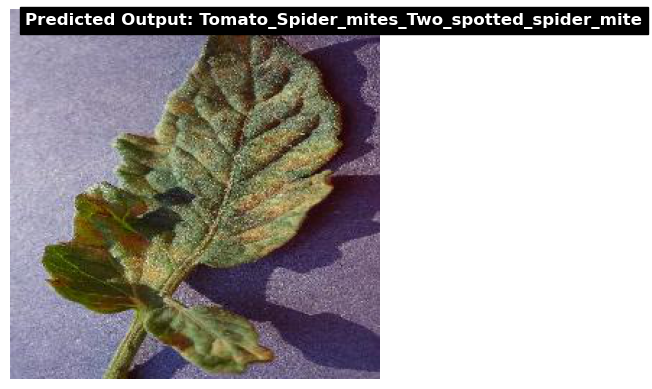

In [22]:
path=r"C:\Users\pavankumar\OneDrive\Desktop\major project\testImages\11.JPG"
img=imread(path)
img_resize=resize(img,(64,64,3))
img_preprocessed=[img_resize.flatten()]
output_number= rf_classifier.predict(img_preprocessed)[0]
output_name=categories[output_number]

plt.imshow(img)
plt.text(10, 10, f'Predicted Output: {output_name}', color='white', fontsize=12, weight='bold', backgroundcolor='black')
plt.axis('off')
plt.show()

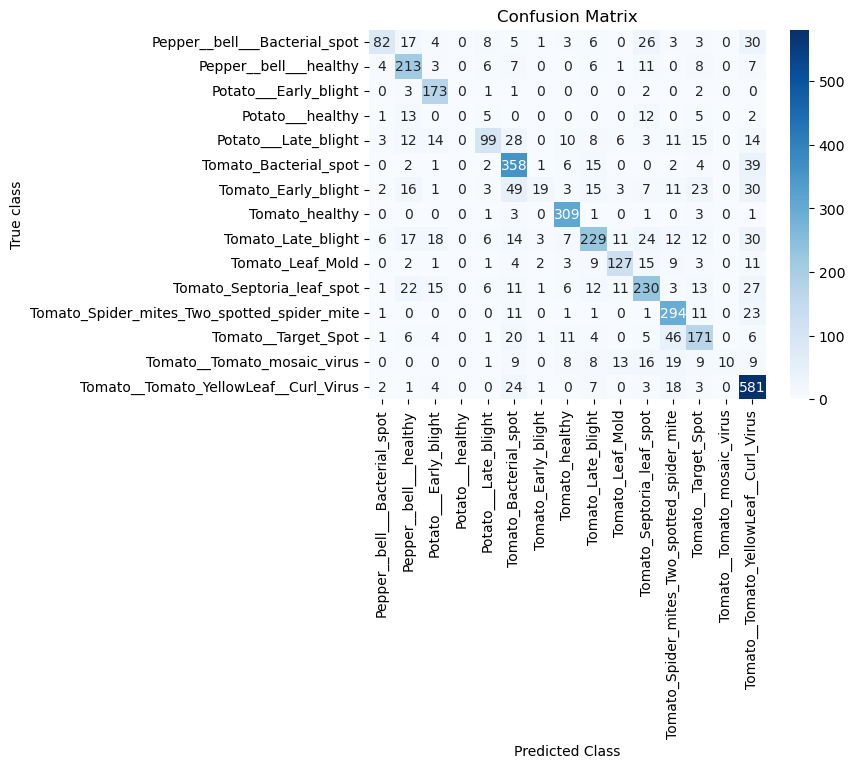

In [16]:
# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)
class_names=categories
# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, cmap="Blues", xticklabels=class_names, yticklabels=class_names,fmt='d')

# Set the axis labels and title
plt.xlabel("Predicted Class")
plt.ylabel("True class")
plt.title("Confusion Matrix")

# Display the heatmap
plt.show()

In [17]:
# Generate the classification report
report = classification_report(y_test, y_pred, target_names=class_names)

# Print the classification report
print(report)

                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       0.80      0.44      0.56       188
                     Pepper__bell___healthy       0.66      0.80      0.72       266
                      Potato___Early_blight       0.73      0.95      0.82       182
                           Potato___healthy       0.00      0.00      0.00        38
                       Potato___Late_blight       0.71      0.44      0.55       223
                      Tomato_Bacterial_spot       0.66      0.83      0.74       430
                        Tomato_Early_blight       0.66      0.10      0.18       182
                             Tomato_healthy       0.84      0.97      0.90       319
                         Tomato_Late_blight       0.71      0.59      0.65       389
                           Tomato_Leaf_Mold       0.74      0.68      0.71       187
                  Tomato_Septoria_leaf_spot       0.65      0.64

C:\Users\pavankumar\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pavankumar\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pavankumar\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [18]:
accuracy = accuracy_score(y_test, y_pred)*100
precision = precision_score(y_test, y_pred, average='weighted')*100
recall = recall_score(y_test, y_pred, average='weighted')*100
f1 = f1_score(y_test, y_pred, average='weighted')*100
print(f'Accuracy: {accuracy:.3f}')
print(f'Precision: {precision:.3f}')
print(f'Recall: {recall:.3f}')
print(f'F1 Score: {f1:.3f}')

Accuracy: 70.148
Precision: 70.205
Recall: 70.148
F1 Score: 67.421


C:\Users\pavankumar\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [23]:
path = r"C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset"
model_folder = "dtc model"
categories = [d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))]
categories

['Pepper__bell___Bacterial_spot',
 'Pepper__bell___healthy',
 'Potato___Early_blight',
 'Potato___healthy',
 'Potato___Late_blight',
 'Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_healthy',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato__Target_Spot',
 'Tomato__Tomato_mosaic_virus',
 'Tomato__Tomato_YellowLeaf__Curl_Virus']

In [24]:
X_file = os.path.join(model_folder, "X.npy.txt")
Y_file = os.path.join(model_folder, "Y.npy.txt")
if os.path.exists(X_file) and os.path.exists(Y_file):
    X = np.load(X_file)
    Y = np.load(Y_file)
    print("X and Y arrays loaded successfully.")
else:
    X = [] # input array
    Y = [] # output array
    for root, dirs, directory in os.walk(path):
        for j in range(len(directory)):
            name = os.path.basename(root)
            print(f'Loading category: {dirs}')
            print(name+" "+root+"/"+directory[j])
            if 'Thumbs.db' not in directory[j]:
                img_array = cv2.imread(root+"/"+directory[j])
                img_resized = resize(img_array, (64, 64, 3))
                # Append the input image array to X
                X.append(img_resized.flatten())
                # Append the index of the category in categories list to Y
                Y.append(categories.index(name))
    X = np.array(X)
    Y = np.array(Y)

    np.save(X_file, X)
    np.save(Y_file, Y)

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0022d6b7-d47c-4ee2-ae9a-392a53f48647___JR_B.Spot 8964.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/006adb74-934f-448f-a14f-62181742127b___JR_B.Spot 3395.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/01613cd0-d3cd-4e96-945c-a312002037bf___JR_B.Spot 3262.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0169b9ac-07b9

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/0fe8a42b-b943-43d6-88c4-78abdcbfe02d___NREC_B.Spot 9236.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/1024fbd6-ded7-4532-becb-aeb624ea832b___JR_B.Spot 8884.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/1044c742-39a0-4b1a-984f-3cb2bdeda94b___NREC_B.Spot 9219.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/1092e87d-5d66-43cd-8344-43b393d86065___NREC_B.Spot 9244.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/10af9ff

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/197e7e21-9ddb-4fbe-a87e-2885a14c29d5___JR_B.Spot 9035.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/197fdd19-46d1-46f7-8e79-aa9545f76ff0___JR_B.Spot 9000.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/19a868e4-5e24-43e8-b61b-a41022340f8e___NREC_B.Spot 1886.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/1a1af0c4-9e4a-4158-b982-f81d487a3b68___NREC_B.Spot 9148.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/1ade72cf-

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/28c448aa-4d2c-4a96-baf0-e7ed99ae2495___JR_B.Spot 3385.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/28cb6224-3cd7-4336-aeaa-a864141d0d98___JR_B.Spot 8910.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/28f23e77-e556-40c8-8bc2-835227732de2___JR_B.Spot 8848.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/292d6666-67ca-4c4f-91e9-b7313fdd523c___NREC_B.Spot 9130.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/29896da5-a2

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/35ef7246-60e5-4bcc-bc1f-020eac1eacc2___JR_B.Spot 3298.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/3610f357-8b9f-4f98-8e7f-c4297daf3b20___NREC_B.Spot 1971.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/36223df9-bc20-4672-8938-6f1f60fb4a0e___NREC_B.Spot 1873.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/365ab78f-6a75-49ef-acb8-44b8b21fac2c___NREC_B.Spot 9159.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/36aa146

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/41f3e9be-44a8-42b1-9654-8e7127bfc57e___JR_B.Spot 9048.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/41fed9b9-d409-4b56-a9d6-3e98f31a4e3a___JR_B.Spot 3275.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/42268507-28e9-4fb2-bd74-a2afdb3eebfa___JR_B.Spot 3240.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/423247c0-70c3-4d41-b22f-33071ee36a7a___JR_B.Spot 3246.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/424602ec-36eb

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4c6a8199-896f-4cbf-8db4-3baa021a9e1c___NREC_B.Spot 9247.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4cda1135-6cad-421b-9648-d00f9f3cd16f___JR_B.Spot 3304.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4cf90b49-1b89-422e-84ae-2e2fcfc2fa02___JR_B.Spot 3362.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4d035250-f831-438b-a583-d192cbb26a55___JR_B.Spot 3163.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/4d20e159-89

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/5bd8d538-c13c-4da8-9f70-6c9a936dee3f___JR_B.Spot 3164.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/5bdf4dcc-7f67-4dc6-92a3-671c6dd4c61f___JR_B.Spot 8942.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/5c421e64-d609-4e2d-9b4f-aa836b4f9864___NREC_B.Spot 1962.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/5c532630-a204-4e10-8fb4-5a0d09f9a1eb___JR_B.Spot 3214.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/5d17a185-67

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/6c859178-38ef-450e-8e93-c357957f5608___NREC_B.Spot 9061.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/6cb54c8d-be3e-48d1-a6ac-08eeb93d6201___JR_B.Spot 3401.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/6ceb56c6-36aa-4196-b60f-6fb8306b3cb4___NREC_B.Spot 9162.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/6cf6e676-20a1-45bc-8f5f-48445e5cbaa8___NREC_B.Spot 9086.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/6cfc68b

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7a0a678b-9bd3-4f13-a650-31566fdb30da___JR_B.Spot 8961.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7a77bf9c-a881-49bd-9bcf-a3fae89788b1___NREC_B.Spot 1793.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7a901ea0-0ebe-41fa-9585-f74f6ce49d17___JR_B.Spot 8859.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7a968e7a-1789-4e52-ab25-1a356b3a1e25___JR_B.Spot 8828.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/7aebe4e4-23

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/875f41e8-cd70-44f4-a17c-c8b77fed406c___JR_B.Spot 8902.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/87606a4a-7b9b-404f-af47-2cd43498d8a2___NREC_B.Spot 1924.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/884c2da1-3b43-46aa-85bb-0f72ed25c266___JR_B.Spot 8906.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/88567f21-a54a-44bb-a572-e3b1c14c3832___JR_B.Spot 3156.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/8860c32a-65

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/994dd8b0-a87e-485a-be38-cb01b8843e44___JR_B.Spot 8857.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/99a07bbb-44a9-48b2-ae4e-306e4282802c___NREC_B.Spot 9064.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/99cd2ddf-fb89-41c3-91cc-0697293b3d9f___NREC_B.Spot 1948.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/9a1c088a-e800-4de1-bf37-c41fcdd14905___NREC_B.Spot 1950.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/9abd1ec

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a73080aa-8609-4ca2-86ff-28440774f4b8___JR_B.Spot 8861.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a7ae874f-138c-4996-949b-f6ba3d4bc1b0___NREC_B.Spot 1959.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a82938f7-bbd4-4ccd-8482-f596735744a5___JR_B.Spot 3305.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a877ca65-3824-4d1a-a438-a32be1beb7ad___NREC_B.Spot 1967.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/a88f92fc-

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b748edc9-357c-4fa6-8e71-03c03845d3d5___JR_B.Spot 3188.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b76271aa-ca0b-44ac-a6f9-379ef70ef443___JR_B.Spot 3389.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b766708d-5d33-4034-afc8-fbf9ffece733___JR_B.Spot 9037.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b7ec200a-5db5-479e-99d0-c40009123835___JR_B.Spot 3128.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/b810580c-a559

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/c784712e-b6ae-4d22-8c18-5c5a2d2d2f0e___JR_B.Spot 9098.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/c7960681-a0d4-428c-a9c7-a12a6d7ea973___JR_B.Spot 8924.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/c8080916-dd9d-40c4-a39b-1957ebd17b87___NREC_B.Spot 9115.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/c868e0ed-12df-48d5-9ad8-e924a0c7ccbf___NREC_B.Spot 1986.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/c869760f-

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d46517ef-7359-469f-9dd3-c8669c6cd889___NREC_B.Spot 1902.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d47bf701-9feb-46d5-a4e6-4cf58765898f___NREC_B.Spot 9136.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d4d0e98c-5d9c-4301-9c1e-546c3a3abfd1___JR_B.Spot 9008.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d4f5ce4f-56e2-4e4c-b696-e760f02fe2a5___NREC_B.Spot 1928.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/d4fc75c

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e2baac0d-0b5c-4e1d-90d9-70a8d6a6855b___JR_B.Spot 9015.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e2bc1ccf-bbc2-457b-89cb-6e7154ec3414___NREC_B.Spot 9092.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e2e60809-4508-47a7-9357-6f410aec402a___NREC_B.Spot 1911.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e348be18-797b-48ab-856a-3e58bde6c874___JR_B.Spot 3229.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/e3f81cee-

Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f231ad19-e0c1-4ddc-9b8c-5415d2be9acd___NREC_B.Spot 9099.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f2c48f6c-f92e-4543-816c-0621648003fe___JR_B.Spot 9010.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f2e21841-962e-4044-bb5d-efd8af95df74___NREC_B.Spot 1893.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f31f4122-67f4-4395-8e7d-2ac6e8241f37___JR_B.Spot 3135.JPG
Loading category: []
Pepper__bell___Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___Bacterial_spot/f37ef7e1-

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/00726ad4-2569-46ce-9d4e-dbf82b14bd94___JR_HL 8686.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0119205b-cfac-4322-be37-dcc401fcfa11___JR_HL 8527.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0137d804-551d-4f78-88b4-d603056dd7e7___JR_HL 7719.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/01468dda-44f3-4de8-8aed-948bcc29b719___JR_HL 8704.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/01482fdd-5dfd-4190-bbc0-6189a3161fae___JR_HL 7983.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/08945f1c-9204-48d6-a5b4-bece52a18909___JR_HL 8056.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/08af8792-fca1-451c-bf59-51cdd9d8b7e6___JR_HL 7740.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/08c9ab27-c1a4-4ccd-a179-ca6e2fa05d78___JR_HL 8769.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/0984b7ed-2a64-40fe-b0fa-ff440b0fc8e4___JR_HL 8600.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/09c7fa21-c544-4a90-86ec-c56d3996602d___JR_HL 8578.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/116a8c0e-51fb-4205-ace6-87865b2329d5___JR_HL 8657.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/1179e122-90ec-4849-aa86-3b8610bf7961___JR_HL 8581.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/118ec2cf-48d0-4bb9-9487-612ea61471a1___JR_HL 7730.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/11dfe9bb-1cf0-462d-991b-9066bdea7078___JR_HL 7763.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/11f58a03-e692-48ef-9ede-b97e5e732224___JR_HL 7912.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/1b09df7a-eb13-4192-b211-900898ab21b4___JR_HL 8533.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/1b2c7e1e-2f0a-4e74-9932-d26118020ffc___JR_HL 8590.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/1b4b5b1f-9390-46c5-908a-d53b93059f5d___JR_HL 8379.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/1b574484-60cd-4ae4-83ed-511a5ae07ea8___JR_HL 7849.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/1b71a13e-9f6d-4321-be6e-8a7410b76f0e___JR_HL 7724.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2260546d-20e8-4602-b7cf-a42f21492ae3___JR_HL 7805.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/226a6fd3-6624-4360-8637-3755f4acd3fb___JR_HL 5898.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/228e2afd-54a4-4097-8489-916c608361a9___JR_HL 7690.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/22eaa182-bd24-47f0-a2f8-e7bcfff9163a___JR_HL 5907.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/234945aa-456b-4f88-856c-40ea3dacf0d7___JR_HL 5889.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2d5f93aa-ee53-49eb-ac82-cd0d4b9359c6___JR_HL 8481.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2d71f791-64fd-4f1a-97f6-812780014edd___JR_HL 7653.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2d7a6a97-2425-4644-8821-2788ac9d0d18___JR_HL 8157.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2d909414-0496-462b-b972-0ae16ee8f1e9___JR_HL 8061.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/2d93ee5a-6562-49c4-82fd-f5fbc950f4df___JR_HL 5943.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/354ec641-1c12-4440-8dd5-635d169d484e___JR_HL 8139.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3564ffeb-efdb-41c5-b0c0-bc4ff12fbbbc___JR_HL 5924.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/359fd210-bc58-413b-9367-df218023b037___JR_HL 8638.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/35bac1bd-0af2-45ad-a1c0-4b19dc070240___JR_HL 7950.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/35c7f0ff-2b3b-4d07-be50-08ff0edfc51f___JR_HL 7625.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3e75d3f9-4e1b-4f09-94e2-e55a9c4d860e___JR_HL 5978.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3ede2904-b21a-4b6a-940b-062c21ff71fa___JR_HL 7613.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3f257cf2-a8ad-4a82-8114-2d70fbdcbed9___JR_HL 8181.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3f3b903c-cfeb-4574-8be7-1580296d7c2f___JR_HL 5865.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/3fa34390-5e39-4858-a1e3-53c914782b84___JR_HL 8610.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/48704549-8dc8-45f4-ac1f-2cd3cdb2a6d9___JR_HL 8251.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/48914149-316b-45ec-a6cf-853fa1215244___JR_HL 8025.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/489667ae-bca0-4e52-819f-2e04be3ae8cd___JR_HL 8726.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/48cc23f2-d264-40f7-9267-7fc97a19aba2___JR_HL 8484.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/48f5f336-54af-4415-be68-d23b38fcdd42___JR_HL 7631.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/51e39127-50f9-45a0-bbc9-f31197ad036d___JR_HL 7996.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/51e49986-3954-472f-8504-a95452b0fc88___JR_HL 7666.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/52197c22-7ca0-4ec1-b1b1-c91b4f5aba8e___JR_HL 8085.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/529dc793-fa77-4aab-90af-1c61539f9aee___JR_HL 8429.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/52fd227a-51d0-46ec-87c2-c5a0833f07c9___JR_HL 8529.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/5a91d465-2042-46de-8940-dfde77038e60___JR_HL 8793.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/5aab6778-8eb7-4397-8912-0ef8a54d8c01___JR_HL 8046.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/5af6651e-818b-450b-b45a-008fce7096b3___JR_HL 5888.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/5af94784-1208-4c66-b95d-5743128bde63___JR_HL 7711.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/5b0924fb-73aa-4a83-b79c-cfbf60490e85___JR_HL 8010.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6120353a-2ee2-46d3-80f1-6535ddfe7aab___JR_HL 8073.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/615f1ae8-e24a-467c-93eb-c4dd352e3f50___JR_HL 7767.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6189bc8c-6309-4692-8fa2-efe95f3c27d1___JR_HL 7802.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/619b71a3-585f-43dd-b22a-3c2f3fcccfa7___JR_HL 5904.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/61e598a1-aaef-48ef-b2d3-773619d25b21___JR_HL 7910.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6a140ba2-7c14-4a2b-b822-e5b80302e61e___JR_HL 8605.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6a3603ae-fc95-48ee-968f-2afcca4a1a6a___JR_HL 7979.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6a6a7f87-4efb-43c7-ae36-1f9db31246f2___JR_HL 7703.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6ab630ac-c705-4aa8-82ec-1b618cc400f4___JR_HL 8257.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/6af0dc26-87c3-4eef-be98-8c6741a8f94d___JR_HL 8735.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/72c50697-b546-4737-a9bc-e14d1d6f71cd___JR_HL 8575.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/733c8247-142b-4d35-8f0c-05bc74de95fe___JR_HL 8432.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/735e7dff-5438-4c3f-be1a-129882228f64___JR_HL 8336.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7396426f-841d-48c1-ab42-7b2578d098ee___JR_HL 8271.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/73ac9ebe-2f3f-455e-8ae7-750b3be4a7f6___JR_HL 8532.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7c482062-5c2b-423e-a244-9aca359f1131___JR_HL 8895.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7c6366da-565f-4314-b58d-a5665b6f15af___JR_HL 8112.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7c8b6274-abca-4531-a84d-5bd56c859ccc___JR_HL 8794.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7c95b0e8-b8df-4312-aca8-51d4731e7c1e___JR_HL 8899.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/7cad85ff-b760-4440-b81e-e25fec79afbd___JR_HL 7709.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/843ef0a7-5eed-45b5-98b4-4c2fc94084cf___JR_HL 7922.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/8485a59c-2014-49e9-bed5-7581cb9fcd84___JR_HL 8319.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/84a2db83-35aa-48cb-8d75-d8f9e3a5c0b3___JR_HL 8361.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/85012959-e963-4a3d-b211-b875e27c6b30___JR_HL 8559.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/8568ef1d-e8b7-4a15-b0cf-39800013e611___JR_HL 5840.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/8ba97ec7-5e91-4850-8e87-fe0aaa18aaaf___JR_HL 8058.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/8bd3098b-4e5d-49d5-be7e-f32da29c75f0___JR_HL 8125.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/8bd3df6b-9344-49ee-8597-776ba6b54317___JR_HL 8404.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/8bfac003-63b0-4c5a-a4b6-09ba08e90b6a___JR_HL 8282.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/8c0a54ed-b09f-4be8-9dd1-03819b128db4___JR_HL 8497.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/92885a8f-715f-44f9-a124-f90b4f456b01___JR_HL 7588.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/933e660d-55cf-4383-992d-48612e53bbd8___JR_HL 7624.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/93871bd6-a65b-4a43-9a06-c8f9092fef90___JR_HL 8881.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9395cf41-c7f6-4b44-81f1-bf9f58fa1ca6___JR_HL 8846.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/939d5042-a50f-4c4e-9f07-74437d88cd85___JR_HL 7883.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/99ef61dd-a84c-4dd5-9b51-106baf167e40___JR_HL 7959.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/99fc2c08-25c4-47a6-9e0f-a7b8c4f3e683___JR_HL 7831.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9a477ad1-c362-4a16-baa0-5282e592f12a___JR_HL 7791.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9a528ba1-d798-4eef-9d1f-5b09485879c6___JR_HL 8626.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9a6d9b66-d1cc-4fe0-8408-ff1be11d4b2e___JR_HL 5909.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9f2bc299-6d58-4350-9893-e944206e7aab___JR_HL 8329.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9fc5d7ed-9906-479b-992f-13cf045a2e49___JR_HL 8001.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/9fc9ea86-e97f-4b96-8838-6e614196b2f6___JR_HL 8054.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a01006eb-885d-4882-87f3-5fe273f4b3cd___JR_HL 8696.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a0140b14-8370-4c95-9195-cdb779122dd7___JR_HL 7580.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a78a9a04-3ff9-44b2-bf18-58d5dc301014___JR_HL 8633.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a8481ff9-ee82-4035-b099-7f434e0edded___JR_HL 8556.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a8758911-2b5a-4383-9636-1e90d33c90a4___JR_HL 7991.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a87fefe4-6f62-46e2-90b9-273ba9997ed1___JR_HL 8292.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/a88c2d89-062f-45bb-9388-4cea9920132b___JR_HL 7939.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b0c38dd5-62ae-4579-8323-49d1969d7d15___JR_HL 7960.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b0dfaf4d-1c02-4438-b711-274dc92f8ed7___JR_HL 8180.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b0ea3617-be2a-4294-b547-3e341fbeb545___JR_HL 7786.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b10e6123-8ec8-4684-aef5-90a20198c3a6___JR_HL 8604.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/b12059e3-404f-441a-9875-4af81aa3bd63___JR_HL 8570.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ba527e73-8be2-4c53-9e5b-cafeab987bba___JR_HL 8037.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ba684f19-7ec6-428f-88f9-f6818bd1a077___JR_HL 8659.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/bab5a3c5-f5e1-448f-b130-5bdaa6a91c79___JR_HL 8188.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/bab8a6f8-4810-4152-8ab0-79d928f8b948___JR_HL 7823.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/bb0abefe-b415-45ac-b56c-c54ab1c5eb76___JR_HL 8393.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c225f3a3-270a-4ae9-a44d-b35c12db7e46___JR_HL 8110.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c2313033-b139-487e-92c2-86b8c8f91d8e___JR_HL 8902.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c242dc1e-a2ab-4b51-8a81-0e6e1c8df833___JR_HL 7629.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c24934a1-721e-4806-ae72-fa6df4cf6ab7___JR_HL 8238.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c277293d-bab5-433b-95d1-591ee60e1bd2___JR_HL 7793.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/c9e45b8e-1c71-4c65-b6dd-cc2a96d88f18___JR_HL 7809.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ca1c9cb1-75e6-4937-85ec-814aaac3bc32___JR_HL 8620.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ca1cc01b-2a40-4d7a-994c-307c8e82e745___JR_HL 8392.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ca45d0b4-76ba-47a7-950d-aed9f357c8f5___JR_HL 8351.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ca67e39d-cf11-4660-b629-6654c815ce70___JR_HL 8782.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d001c6f1-3c5a-470b-b4a2-7996b9c68cd6___JR_HL 7695.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d00322d6-55cb-43fb-9685-927c6939736b___JR_HL 7903.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d009f25f-266f-4369-b6d1-11e5fea7a08f___JR_HL 7816.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d0b2d824-78a1-4ddc-985e-f8d2077955d3___JR_HL 7785.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d0bce877-53bf-4be0-b05d-6f403c5d4504___JR_HL 8838.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d9078c6d-9a57-43d5-bd00-e2a7fd93f881___JR_HL 8738.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d91405d3-8115-4004-99d3-dcb4c5f8a1d6___JR_HL 7725.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d91c3b56-5777-46cb-bda2-1fca87e5cd82___JR_HL 8339.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d93007b0-adaa-43d4-80be-d796d59944e6___JR_HL 7683.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/d93780fa-76b4-46ff-b182-36fe7181e2b3___JR_HL 8894.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/df5a72ad-2928-4bcb-81d8-cfb85a3186a2___JR_HL 8243.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/df7005ca-2252-470b-aba5-e1eb43bb468e___JR_HL 5916.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/df911e7c-0200-4e05-9076-6c40141bcbab___JR_HL 8273.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/df99e967-62ec-4d50-991f-c0dd948d0cf0___JR_HL 8586.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/dfd700a9-cef2-453e-8006-52fd08c0ca35___JR_HL 8770.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/e921cedb-b111-45d5-9dce-ce03a785fd27___JR_HL 7994.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ea4a18b9-2f82-44eb-b5ca-955b3f2bf92d___JR_HL 5958.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ea518a46-a3d7-4d1c-972c-36a18bf92224___JR_HL 8323.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ea5402e9-f5e9-450c-bef6-f9d0bb544e68___JR_HL 5873.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/ea84c71c-2ed3-44d2-9577-6e08131d6c6d___JR_HL 8200.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f17e7ab8-61bb-452b-9e15-5113e2792f78___JR_HL 8442.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f1dcd8f8-45b1-4b59-b613-7b0384e58365___JR_HL 8178.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f20f36a0-6816-455b-9ea6-cd3bdf90a844___JR_HL 8045.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f24f1078-123e-4c89-bba8-2e1f7cf264bb___JR_HL 8196.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/f2833b90-ad7d-4bd8-bb88-9f97d0517c98___JR_HL 8325.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fb02614c-dcbd-4e7d-9ec6-ab3c5bf267ad___JR_HL 7626.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fb4468f7-1a89-496a-8953-32edb1ff775a___JR_HL 8888.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fb6f5d31-176f-4694-9178-0732fb1efcf5___JR_HL 5868.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fb7d12ae-ac5d-4593-8f17-1f248a6ff331___JR_HL 8539.JPG
Loading category: []
Pepper__bell___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Pepper__bell___healthy/fb916ecd-183f-4caa-8daf-fb9d83f43e88___JR_HL 7972.JPG
Loading category: []
Pepper__bell___healthy C

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/07d777f8-2c5a-48da-935e-f17c572b1e6e___RS_Early.B 7880.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/08029ccc-387e-4be6-9389-04f7b82fdb2a___RS_Early.B 9130.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/08194ca3-f0b2-4aaa-8df8-5ec5ddc6696a___RS_Early.B 8151.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/08392b44-ecc6-4f38-8566-361b552cfe21___RS_Early.B 7393.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/0898bffc-57aa-4fdb-92d1-fd6a03d2a011___RS_Early.B 6946.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/12826416-efc5-49d3-b615-731629c95435___RS_Early.B 7215.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/129b1c3a-4f7d-4c45-ae03-2a4c3eb17dd4___RS_Early.B 7413.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/12a7bc09-8d7f-4790-8046-6e3f12f71399___RS_Early.B 7973.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/12ebe6fe-c8ce-4a00-866f-8776aca75159___RS_Early.B 6873.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/12f7b8bd-7aab-48de-ba2e-d2562408542f___RS_Early.B 7386.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/1f56ef5b-9a3b-4731-bf82-b08aeb84fcb5___RS_Early.B 9032.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/1f80f111-6a3e-4dfc-8456-0f3e9a19ae10___RS_Early.B 6879.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/1f830d02-1fc6-41d6-99c6-851e0d2af4ad___RS_Early.B 9182.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/1ff86a73-9f36-45c5-8012-c5d90445b7ac___RS_Early.B 8563.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/201fed44-8dde-4ece-9e76-3706b8afdf46___RS_Early.B 8259.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/2cf993b6-98e7-4678-aea5-9177ea3b63bd___RS_Early.B 7692.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/2d149f7a-4b0a-40a6-8d0b-1d1f14e5e696___RS_Early.B 9143.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/2d344be7-2d5f-4d27-aeb2-b92c8191b877___RS_Early.B 7173.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/2dc9baab-663f-4f09-a0a4-7c07edfb4c42___RS_Early.B 6866.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/2e88d4ed-b11b-4123-9e4b-f3c02a65ad39___RS_Early.B 9180.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/3ec5894d-dcc2-4276-ba28-0048b6d5605a___RS_Early.B 8027.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/3ef2279b-2fda-463a-b007-e2a93ff977f0___RS_Early.B 7235.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/3fb9fd25-3f61-4983-8342-2abb34d1b010___RS_Early.B 7920.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4019e40b-0175-462a-b6bb-228cf42c1a65___RS_Early.B 8256.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/403aa255-393c-43b4-8f68-f68efbf4f5df___RS_Early.B 8544.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4b484f0f-82dc-45d1-a5b6-72c8a6a96323___RS_Early.B 7262.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4b7b3611-d9b9-40c8-b0f5-d730fcd76679___RS_Early.B 6937.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4b925312-1973-41cf-afdf-9090d02dd539___RS_Early.B 7913.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4bac4925-72ff-43e7-8726-5e2126c6c30d___RS_Early.B 8206.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/4bba904e-b4af-4a81-8252-b8d997bc5057___RS_Early.B 7695.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/569206bf-423e-4508-b1b4-2ca6821aceac___RS_Early.B 7554.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/56a6692b-15ba-4097-aba1-ba428b6fefcd___RS_Early.B 7899.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/5720f8b8-4fd7-451f-af18-a48730691c2d___RS_Early.B 7155.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/5748b34e-9143-4540-b4f0-37b8f7dd9e96___RS_Early.B 7198.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/5755142f-0cba-45b7-a563-beb1bf6db374___RS_Early.B 8321.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/6173dbe2-1379-4241-a43e-7cbad448b6cc___RS_Early.B 6993.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/61a602c4-02e3-49e5-9858-5b1d4d4795f7___RS_Early.B 7875.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/61d53ca2-a8e2-4e5d-b8cd-3f9608b74fc1___RS_Early.B 6746.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/61da9830-ebfd-483a-88dd-a66fcff4c457___RS_Early.B 7817.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/61f4f7c5-cebe-471a-9be9-b595255b7fb4___RS_Early.B 7029.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/6eebb348-cafa-4863-937c-3b249f71df0a___RS_Early.B 9230.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/6f37a2b1-e63c-4d82-aec2-9ff036473867___RS_Early.B 7585.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/6f75cbf6-25c5-4b56-911d-c8a6ffa242d4___RS_Early.B 7914.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/6f8dfa1b-8c6f-4be6-93ff-e9180dde7357___RS_Early.B 6914.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/6fc04d72-747b-4a96-912a-db0bd967ece0___RS_Early.B 8002.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/7c0e4eed-d8e2-410f-a7bf-9f5a1c4a566d___RS_Early.B 8042.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/7c9b2deb-6f9f-4671-bdcd-56481d8f0a35___RS_Early.B 8608.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/7cc0cb45-7fae-4d55-8dce-aa5e4484b7d9___RS_Early.B 7088.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/7d056cd3-76d1-49f5-8491-a25e4fc4f852___RS_Early.B 8414.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/7d90df0a-da17-4641-9006-75aa7de6ed5e___RS_Early.B 8702.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/879d0dfe-d17d-486a-992c-d80089133c50___RS_Early.B 7428.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/87c0254c-c987-4c54-adda-45c5e7346170___RS_Early.B 8848.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/887347a3-ee1c-4141-a423-ffe050dd246e___RS_Early.B 7851.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/88c63d75-4423-4233-9097-728af8a52033___RS_Early.B 6862.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/88e29276-8c4f-4d15-b3d4-d1db0a05cac1___RS_Early.B 6973.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/911b9166-40ba-4dc8-974e-c916e6866142___RS_Early.B 9089.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/9125d133-5b86-4363-8fbe-79c813ac8795___RS_Early.B 6748.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/9141a8b4-6144-446d-b71d-925bcd432840___RS_Early.B 8648.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/91721448-8786-49f6-a66d-d410fe714676___RS_Early.B 7725.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/91a21acf-c95a-4ffc-90f2-8c64456f4032___RS_Early.B 7139.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/9cd81447-0701-4969-86aa-5f20269923c5___RS_Early.B 8790.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/9ce9c6dc-b20c-47f8-91e0-31886945c4bb___RS_Early.B 8094.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/9d0c69df-f5dc-4118-a654-ab40d100b9b6___RS_Early.B 8870.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/9d2f37ae-aa02-4b04-b0cb-9fe125cfdbe2___RS_Early.B 7691.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/9db872fc-f367-4dfa-b1f7-23490bb4552b___RS_Early.B 8842.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/aaa394b2-f7d5-41a5-97eb-acc4068ef72d___RS_Early.B 9155.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/ab0878eb-0310-4788-b2d7-14102cdd241e___RS_Early.B 7026.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/ab23a940-3124-4101-b562-08ca34a8334b___RS_Early.B 7790.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/ab808dff-e0fc-42d0-ad9a-c4cb7f69e59b___RS_Early.B 9210.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/abb9a8c4-5d0f-443a-b7c9-780036ffe76c___RS_Early.B 7380.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/b954c296-ae18-4efb-8a8c-450486faa919___RS_Early.B 6998.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/b95c05a8-2d70-4af5-a384-5b5b4450b7c6___RS_Early.B 7724.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/b99ba68b-4608-4335-a292-b4249d83762d___RS_Early.B 9096.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/ba5dfd98-89d6-49d5-b398-beb05cb9d8ad___RS_Early.B 7824.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/ba96aab6-adb5-4021-b6ad-3305f50aec12___RS_Early.B 7317.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c4b16bb7-f358-4010-a04c-10206bad02e9___RS_Early.B 8391.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c4dd703b-1d4c-4e4c-8064-0e1d743c47ae___RS_Early.B 7050.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c4ec31de-5466-49c0-b034-84a825327e0b___RS_Early.B 8062.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c53d85d7-bddb-422b-955c-6842cce9a927___RS_Early.B 7253.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/c53efbea-fddd-481d-aec5-14fd3c3e1723___RS_Early.B 7796.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/cf3169aa-b842-46ed-bb1a-3e02b6858c86___RS_Early.B 7566.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/cf38c261-5bae-4b5d-92b4-16c634557d2a___RS_Early.B 7169.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/cf761f3d-755a-42b2-83cb-729443246c6a___RS_Early.B 7319.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/cfa37804-6d71-45fe-bd88-c899b9534992___RS_Early.B 6673.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/cfd3112d-e376-4b82-bc06-de0bfba0ab41___RS_Early.B 8389.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/da4c4f0f-ea7b-489a-8ac1-f8c63ff59bc4___RS_Early.B 8818.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/daa35c03-7307-4e2e-8b15-f33bfff5a12d___RS_Early.B 7712.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/db4dbc48-209d-4615-95cd-1d7ee7f1d7e0___RS_Early.B 7545.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/db5d0f5f-a722-4f12-96bf-c9608e5c7f2a___RS_Early.B 8945.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/db60c4cf-30f1-460c-a345-3045f192f725___RS_Early.B 6722.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e490f736-a52f-434f-ada7-3bb255d99635___RS_Early.B 7417.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e4b0f6ac-2b1e-4e10-8733-de421a01c390___RS_Early.B 8254.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e4bd2479-dd2f-41ce-9544-4f1804c4ab8b___RS_Early.B 8601.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e50bd734-03b9-479b-9ca0-48ef217a2c59___RS_Early.B 7976.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/e50e7166-a67d-4207-a49c-0240b0218d48___RS_Early.B 8907.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f0cdbf74-8401-48d1-b1cc-94862e1a4452___RS_Early.B 7447.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f0f41a0d-7679-4e56-85df-44934fe0cb3b___RS_Early.B 7054.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f12d7916-b4f0-46f7-91bd-8dc097743149___RS_Early.B 8963.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f15637d3-829d-46f9-b45e-1e1768d6b8c9___RS_Early.B 7635.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/f164ce92-d109-47ca-9f75-380a7f16155a___RS_Early.B 7104.JPG
Loading category: []
Potato___

Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/fdf3c33c-dad6-4f13-bd58-a31d327d9cb9___RS_Early.B 8947.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/fe24f700-d37f-4e51-b07c-931e8c3ded81___RS_Early.B 8792.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/fe2a7818-f2ec-4255-93f0-586c88a41624___RS_Early.B 7043.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/fe772b3d-351c-4d18-9dcb-26feb90afa0d___RS_Early.B 7456.JPG
Loading category: []
Potato___Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Early_blight/ffef8a3b-3e8a-4c24-a27e-64c41708f7a0___RS_Early.B 7132.JPG
Loading category: []
Potato___

Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/58a98860-86d8-41e7-9f8c-cc2ca5e90012___RS_HL 1758.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/5a3fc4bb-a78c-4276-8934-f0b037ffb860___RS_HL 5412.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/5cb360dd-5c17-4c57-b31d-97cd8dd8d0bd___RS_HL 1797.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/5d505af8-3f73-4781-980c-a4a696a04550___RS_HL 1934.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/5df30492-0b54-474d-8883-bba9474ca88f___RS_HL 1801.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDatas

Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/bb04f738-1848-4dda-8834-384a48b335cd___RS_HL 1765.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/bb328d40-e4e6-4b84-a92a-e7cb3922c19d___RS_HL 1829.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/bde33d08-678c-4f84-b80e-fcb986a9a446___RS_HL 5415.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/bf2bffbb-cd8f-4d36-bd58-847808397c75___RS_HL 1786.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___healthy/c07db642-c675-4066-99b6-56bc8207fb37___RS_HL 4164.JPG
Loading category: []
Potato___healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDatas

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/0396e413-e165-427a-ba72-04cbae7b8ab0___RS_LB 4751.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/03bab48b-962b-4c08-bc98-da95237d20ac___RS_LB 3190.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/0441138d-5f9f-4ede-ab9a-49edabc605b3___RS_LB 4235.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/0450570b-44d1-4290-956d-5d970164a2e2___RS_LB 5160.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/04b964fd-7033-4cdf-88ef-b1acbcd8183a___RS_LB 2783.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/12d72127-7880-4481-b3c6-caff04116a86___RS_LB 2632.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/12e2c9b5-fbfc-4bc9-898b-86ead976a615___RS_LB 2702.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/1338edcb-9e0e-458c-845e-206b869f9199___RS_LB 3205.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/13b1b19c-6720-4238-b384-4c86ea119ace___RS_LB 2765.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/140cad58-de9c-44b8-afb4-af5751e2e012___RS_LB 3247.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/224d9d63-c097-4142-b1a6-56f88a7bae2e___RS_LB 2630.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2269e6d9-bb15-49f1-8349-2f0126165960___RS_LB 3197.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/227f2f04-4d59-48d9-958d-5cccc70d3f2b___RS_LB 2772.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/22b19227-ae7e-495e-9fe0-d286fbcf9412___RS_LB 3996.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/22bd2a18-a4ba-4c9a-a4d3-2dabc295ccbc___RS_LB 4759.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2f419afc-a232-42c7-b0ff-92d928647a0f___RS_LB 4917.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2f6382f7-12fc-4309-b7db-b034b8165c67___RS_LB 4955.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2f76c068-ebba-499d-8819-2d12bde41695___RS_LB 3232.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2f7b6898-a342-42a5-a0e5-a9f2bad7eaf1___RS_LB 2831.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/2f8e6ae7-f6ac-4bab-992b-82e3c51cf476___RS_LB 2743.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/3d544e81-b7f3-4853-bb65-c78b125d1a6a___RS_LB 3238.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/3e379b4f-29dd-4f14-86e6-11fa37cf3ae9___RS_LB 4789.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/3e81c41f-5b6b-4458-8aa8-6a544a8e678c___RS_LB 4963.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/3f0fd699-1ce7-437e-a899-662a51d59974___RS_LB 2904.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/3f24e6f6-ff9f-4416-9fce-b8153a030de2___RS_LB 2730.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/4afd8bf6-0e1e-4a85-a576-1e8995c88d5c___RS_LB 2505.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/4bccc3ae-4246-48f8-9c07-f4a1d5856314___RS_LB 2760.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/4c846678-1c22-4734-b2bf-fb774bf3bb13___RS_LB 4090.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/4ca06863-f89b-497c-bd3a-9bca78f02942___RS_LB 3088.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/4cc2dba7-6871-481d-8989-07ea683e58b5___RS_LB 4979.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/57980690-2488-4715-ae89-84e84d17ee10___RS_LB 3978.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/57a137da-7424-4a9d-9e28-bce63decbdcf___RS_LB 2761.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/580e8c49-3b1c-46d2-b3f4-68f0b3de0d77___RS_LB 4063.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/58334b81-9aab-4b5c-b655-f7078a81135b___RS_LB 3846.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/58475c1a-a4c2-43bd-b361-60523b5c62d2___RS_LB 3912.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/6a6315ef-b37d-4067-80cd-bb2d8adf93ca___RS_LB 2919.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/6a687e1b-15c3-4752-b428-e14cbe85feab___RS_LB 2803.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/6a72ed4a-cdb5-4a50-9a0d-efc119066fd7___RS_LB 2865.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/6af65e0d-c1a5-4a28-9ecb-19e7e6d91a70___RS_LB 4128.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/6be49d30-1b69-435a-a533-21b2b1a7fd41___RS_LB 3309.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/7673ac2a-707f-4575-a11d-afe44817bfd4___RS_LB 4342.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/76be1a95-8bf1-468e-bc6c-f7d8fa5b7e5b___RS_LB 4758.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/76bea797-306c-4fc5-a868-69394fed05d4___RS_LB 2900.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/76ebfd7a-b3d8-4cde-b6b6-7e5132ec269b___RS_LB 4935.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/76ee26db-ef55-43b9-9179-6b9ba15dc21a___RS_LB 4058.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/85d29f87-cb27-4ffa-9ad8-9c47f9a53b33___RS_LB 4437.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/85d60a7c-4a4c-4fcf-8743-21b4c03ff12c___RS_LB 3868.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/86323439-ca8d-4819-ae81-800e50f85770___RS_LB 2826.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/8692ff0d-260b-4fb9-9598-efa91456c2bd___RS_LB 5438.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/86944800-4984-44f9-9c72-53fcb7324a3b___RS_LB 4015.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/929dd251-5fbb-406f-9313-a71e5f96b31c___RS_LB 4781.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/93905331-a3b3-43dd-8596-d8f7e6b3e88f___RS_LB 3306.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/93935af4-3aae-4dd6-90d9-fb28e439faf0___RS_LB 3299.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/939a9a98-cbc9-4b83-bb47-395f26d7fddd___RS_LB 4293.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/93d91b96-e024-477c-9b76-796e3f1614d4___RS_LB 3297.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/a10d340a-b35c-4310-be59-caa58bb0d500___RS_LB 5154.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/a1523281-33d2-4cc4-910a-3d614a4cd085___RS_LB 2816.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/a1f3508d-496b-4dd5-a820-d30acafd7d9b___RS_LB 2970.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/a221647c-0dda-468b-93f9-81f50b14ff81___RS_LB 3942.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/a24f3bec-3fbb-461a-81ef-ab791ceb66e2___RS_LB 4818.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ad2396a9-306e-4ca9-88dc-56b2bde77c6b___RS_LB 2755.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ad628434-32ce-4365-90b0-f394d98fbe00___RS_LB 4905.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ae20cc4e-fe37-48f0-9566-2d2efc5afd38___RS_LB 4290.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ae52f85f-bce0-4fb9-a109-009e099a72e6___RS_LB 4972.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ae5b08fa-25b7-4006-8b1b-2415356b3847___RS_LB 5453.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b6ad95ed-8f05-42a1-ac35-581696454497___RS_LB 3855.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b6b937ed-f629-4136-8d5a-38b734f7f662___RS_LB 4595.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b74d0fd1-9af7-4053-8538-ee937236a64d___RS_LB 4918.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b811c2af-734e-4689-aa43-4ab1d4faec32___RS_LB 4719.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/b86274d3-554a-495d-8304-76484e3c4d15___RS_LB 4442.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c4c1c25f-0594-4c81-a1e0-a609ee1f0808___RS_LB 2653.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c58de13c-b59d-4497-ae5a-08b425919b64___RS_LB 3116.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c5ff46d5-8f49-409f-b3c1-9a1a25418f47___RS_LB 2596.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c60533e5-8080-4c77-8ae4-7c1f2f7350cb___RS_LB 2810.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/c63d5cca-9639-4d42-88c4-13572afa1dda___RS_LB 2747.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d2ff230f-99a5-4dc5-968c-246d772788af___RS_LB 3279.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d30021ba-fbbd-451b-b257-1fc5c6ac54d4___RS_LB 4466.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d30d25f1-74ca-42d3-804d-c31b06720c46___RS_LB 2817.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d36e9212-7594-4e4d-9062-0a98bc689729___RS_LB 5055.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/d378a0c5-d275-44a4-9f00-f7f180270f4d___RS_LB 2781.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/de282779-9d54-4b8f-8292-e06c3e020e16___RS_LB 3971.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/de54e40d-4c5f-48d9-9b6d-bc96bde09898___RS_LB 4086.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/de63bbba-d8d0-4e74-95d7-6d5adfcd0955___RS_LB 3222.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/def9c9e1-fd12-44d9-92ae-18c5ff0f52da___RS_LB 2605.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/df0f75cf-febd-4fde-84a0-7c4da9f97fd2___RS_LB 2534.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ea2bb076-a483-4570-88ac-8ab236d4bb92___RS_LB 2503.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ea350085-28c1-4fc0-9fb9-386536cb971e___RS_LB 4890.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ea356b9c-9090-4f0d-9083-d1f63c77372d___RS_LB 2800.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ea542556-e7f6-416c-8451-149916f4574e___RS_LB 3086.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/ea5fc080-37a7-4954-ba8c-a5d67b6a0962___RS_LB 2888.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f93b9fc8-469b-4a2f-8c0b-ca3d1a093185___RS_LB 3870.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f95a6bbd-39a3-48e7-a612-8833c2b7b3ff___RS_LB 2784.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f964b423-2146-4523-9f71-d7937c475bf0___RS_LB 3842.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f973bbe0-ce70-4215-8d5b-9e7adc099261___RS_LB 2507.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Potato___Late_blight/f9bd5093-1f62-4d00-bb66-7f65ce5c412b___RS_LB 2854.JPG
Loading category: []
Potato___Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/030501db-683b-4ed5-9ec0-c475a5dfdd76___GCREC_Bact.Sp 5650.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/034caf25-29c3-4be2-a725-d2866ce6f548___GCREC_Bact.Sp 3575.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/03707c27-7f95-4f19-a173-1c0c74653fdf___GCREC_Bact.Sp 3046.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/03aa14e9-9ee4-4ba2-819d-effb3d1ba398___GCREC_Bact.Sp 5801.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/03af6874-872f-41e1-bce4-b3022bd7a9e6___GCREC_Bact.Sp 2995.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/095f2dd4-7e65-44ab-a867-c5d9634ec532___GCREC_Bact.Sp 3801.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/096c159e-7f45-404c-ba64-eecc7941ce23___GCREC_Bact.Sp 5675.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/098b62a4-f92b-4c0d-9ab9-a6061a9d1625___GCREC_Bact.Sp 2955.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/09c1a12a-ad44-4522-9755-851d6a042f02___GCREC_Bact.Sp 5585.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/09ebe433-a21f-4ffe-9954-e3ce4347143f___UF.GRC_BS_Lab Leaf 1084.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0eeb4776-110d-4100-8c88-26a64eb05b22___GCREC_Bact.Sp 6101.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0f1d337f-e8c5-445a-83a0-b89915eacb72___UF.GRC_BS_Lab Leaf 0435.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0f2247f4-7ffe-409c-9833-ce8a7723ee02___GCREC_Bact.Sp 6080.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0f3160b6-4cd4-486f-b0cf-269e406c41b5___GCREC_Bact.Sp 3522.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/0f4ce5ef-5ecf-4c5d-b301-3b5a44e3a1c8___UF.GRC_BS_Lab Leaf 0408.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/147fdb22-0a8b-46d7-8573-784d29b9d9cc___GCREC_Bact.Sp 6386.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/149fd0ef-ec5a-4a34-aa8f-8ed381b7d77d___GCREC_Bact.Sp 3370.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/14d87e41-89b0-4872-aa2c-3a85de708d2a___UF.GRC_BS_Lab Leaf 8992.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/14f9fe9d-517e-4f70-9a4b-97fff9a26e65___GCREC_Bact.Sp 6295.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1506485f-0fba-4e0a-aecf-36f9c5bae096___GCREC_Bact.Sp 5543.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1addf690-441a-40c5-b1e7-c618a8af1f40___GCREC_Bact.Sp 3744.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1ade5ae9-2b62-4d53-86ae-fee9d3d9a7e9___UF.GRC_BS_Lab Leaf 0777.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1aeee055-1c5f-4aab-a4af-bfe860f7dc46___GCREC_Bact.Sp 3034.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1afcd540-c746-4c02-8611-686ec35caaf5___GCREC_Bact.Sp 5654.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/1b3ccbf3-c1e1-476e-b34a-6af0a6fbb349___GCREC_Bact.Sp 3735.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/227f113b-8511-4d2f-a591-8e5d01e896dd___GCREC_Bact.Sp 6384.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/228ee04a-62e3-4fad-a457-62eb8b1472ee___UF.GRC_BS_Lab Leaf 0436.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2290365c-ec97-46fb-bc6c-51395d458821___GCREC_Bact.Sp 5937.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/22a42ef8-b719-40d1-9307-8f035913daff___GCREC_Bact.Sp 3861.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2300bcf2-b682-4be7-a101-e4517c15a32b___GCREC_Bact.Sp 2980.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/277f9f6d-07b0-4687-afef-ebf67e227e96___GCREC_Bact.Sp 6364.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/27a806fe-06f2-48fb-92cf-32d44d545606___GCREC_Bact.Sp 3052.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/27cae464-e8c3-4600-806e-2d65c8a84016___GCREC_Bact.Sp 3619.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/27ebdaaa-b432-4d4a-b404-a04e58a46f44___GCREC_Bact.Sp 6025.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/28357fdb-17f9-49e4-a10f-a5dae53aa48f___GCREC_Bact.Sp 3294.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2f75f735-41de-445a-812c-72700ec68121___GCREC_Bact.Sp 5881.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2f8a0ddd-dbc7-4c67-a993-2e6e7c79094e___GCREC_Bact.Sp 5966.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2f946796-28fd-458c-a2a1-93c7a946c829___GCREC_Bact.Sp 6090.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2f9b712f-708a-4e10-b63e-5c1c2208081d___GCREC_Bact.Sp 2966.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/2f9cc9b4-9244-4043-b786-25be4b3e4063___UF.GRC_BS_Lab Leaf 9032.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/35797a1e-c933-4ae3-817f-abc07775075d___GCREC_Bact.Sp 3204.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/357e7fb6-0d3f-44f5-9f13-ae84759da804___UF.GRC_BS_Lab Leaf 0525.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/35bec389-2983-44f6-8bd5-d70e77cda204___GCREC_Bact.Sp 5617.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/35c80526-d4ca-4742-9903-6a9463c532e4___GCREC_Bact.Sp 2965.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/35cfd84d-af4a-48c6-9add-aa389b3ef354___GCREC_Bact.Sp 3019.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/3d38f4a9-37ac-4211-bfc3-e26c815afc23___GCREC_Bact.Sp 3781.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/3d41d2d9-7014-4409-a953-21227ef9d8e1___GCREC_Bact.Sp 3699.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/3d997709-70ca-4845-a4df-02995c20f5f0___GCREC_Bact.Sp 2987.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/3da1608f-81b2-4531-9079-2c2fbe1ab7e0___GCREC_Bact.Sp 3633.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/3dbc84e0-27f1-421f-8978-82881bf846fd___GCREC_Bact.Sp 3514.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/43d79893-c9e3-49b1-9dd7-52677d9bd325___GCREC_Bact.Sp 3196.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/43f48412-a4b0-496b-b482-da1a54482855___GCREC_Bact.Sp 5670.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/43f97b78-04ee-4092-a909-6fd9af60d1a6___GCREC_Bact.Sp 3330.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/441dec39-f5c8-4885-b133-1db20ff1fd3b___GCREC_Bact.Sp 3487.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/443242bf-ad63-440d-89bd-cb11c2fc1e51___UF.GRC_BS_Lab Leaf 0874.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/499ed0ff-447b-4f2b-9f9d-d733202b4fcf___GCREC_Bact.Sp 3407.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/49b9840f-d9f1-42cc-92ad-96bbbd8bf9b2___GCREC_Bact.Sp 6379.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/49bfc0c9-1a64-4a1b-8a52-50d0df72e140___GCREC_Bact.Sp 3817.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/49c04c82-89d6-480e-96a3-d74a14b717b3___GCREC_Bact.Sp 3274.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/49c34c1b-08a8-4bdd-a933-0eb4daff5f97___GCREC_Bact.Sp 3501.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/50396b93-07af-41f8-bd0c-9d5068e1699e___GCREC_Bact.Sp 5662.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/505ff6be-e8f6-4af6-86a7-001cd2cac277___GCREC_Bact.Sp 5562.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5065cba2-6f5c-44e9-886d-e6fb8d764891___GCREC_Bact.Sp 3599.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/50726baf-e64e-4fea-91f5-f5c908aa9737___GCREC_Bact.Sp 2947.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/50950fff-ebce-4985-bf46-713a0cdae29c___GCREC_Bact.Sp 5589.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55b8b2b8-0967-441a-9524-9c4cdfe6db46___GCREC_Bact.Sp 3075.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55b8f3a6-d613-4437-860b-dc50459dd07c___UF.GRC_BS_Lab Leaf 9220.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55cf65bc-61b4-4b40-b2d6-3b9bf57a3009___GCREC_Bact.Sp 3586.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55dae2a7-f763-4fc0-be79-d658090aab1d___GCREC_Bact.Sp 5698.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/55f0b4f2-b1ff-4f01-9697-a05d12e831e4___GCREC_Bact.Sp 3620.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5c5dbca4-4322-4227-a543-6ff6f876a531___GCREC_Bact.Sp 5785.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5c862bf1-ab62-4106-bdca-6b22a1951dca___GCREC_Bact.Sp 3860.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5c973c59-c8da-4a3a-bd99-a645d0f83936___GCREC_Bact.Sp 6362.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5cc48c5c-f74c-4e20-820f-e03f8bff3e3e___GCREC_Bact.Sp 6008.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/5ce7093e-2e9d-4dd9-9401-7499c26ddaf1___GCREC_Bact.Sp 5566.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/64d5ec90-b356-4ce8-9ad4-2a152d98782e___GCREC_Bact.Sp 5557.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/650a2408-9d62-4ebc-92ca-689e2612e248___GCREC_Bact.Sp 3325.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/65476dd0-6a5b-4623-b97d-96d74dcdbe03___GCREC_Bact.Sp 3842.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/655639ad-cd0d-457a-b53a-8e25886e4f55___GCREC_Bact.Sp 3099.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/659908ff-205b-4fd1-af8b-5b2c11b56adf___GCREC_Bact.Sp 3139.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6a7ed25b-d34f-4f33-84ab-56efcd5eed15___GCREC_Bact.Sp 3830.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6aa07949-08b2-4945-a535-3f8b49f86599___GCREC_Bact.Sp 6344.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6ab6800f-13bf-4956-858c-f25c1d43fd9a___GCREC_Bact.Sp 3419.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6b30245b-6c88-4cdb-b170-96bcba1212c4___UF.GRC_BS_Lab Leaf 8765.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6b463262-379a-4694-affa-1030a9f4c087___GCREC_Bact.Sp 3366.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6e8eb50a-bb41-4bbd-a9f1-a6c829429cbc___GCREC_Bact.Sp 5891.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6e9172ee-1bb5-49dc-bf23-203b2de71bbd___GCREC_Bact.Sp 3518.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6ec9c8ed-75be-4328-852c-571753d458c1___GCREC_Bact.Sp 6183.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6f211a42-cdd8-4c5c-89b3-17e50f324621___GCREC_Bact.Sp 3569.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/6f825e2c-3ee2-4250-8c60-9ec3026d6a85___GCREC_Bact.Sp 3118.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/75f2019c-7bbb-4f1d-ba4f-26464aec3062___GCREC_Bact.Sp 3474.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/760d6620-5a8a-4566-92bf-8a3b5a8d81b2___GCREC_Bact.Sp 6188.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7624a9cd-018d-467a-99f9-2255a27103a4___GCREC_Bact.Sp 3725.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/762e1022-3ed8-4d96-9f05-e22c0757c8ba___UF.GRC_BS_Lab Leaf 0774.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/767eb77f-de18-4314-a465-4df8d442f468___GCREC_Bact.Sp 5951.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7bc2c7e3-01a8-441a-8aaa-b6cc95c4b17e___GCREC_Bact.Sp 3142.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7bd0f0c4-082e-4da4-ade1-a1d79637949c___GCREC_Bact.Sp 3664.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7bd80f73-7d7e-495e-a9c2-188d649744f7___GCREC_Bact.Sp 3859.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7c0bb91f-4508-4bb1-a3d4-da074429c167___GCREC_Bact.Sp 3167.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/7c46d515-2090-4371-a5c2-0af04544b5e6___GCREC_Bact.Sp 3513.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/81f185f5-2b41-4942-9e84-68886b771aa4___GCREC_Bact.Sp 3535.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8227d24c-9e0f-4119-9324-8ba192ba9201___GCREC_Bact.Sp 3299.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/822e2ff3-34d5-4634-b82e-2d5cc16c1485___GCREC_Bact.Sp 5990.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8242a847-cd26-45ee-995d-dcec33ba89f3___GCREC_Bact.Sp 3806.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8282af2e-63e1-4522-afed-d9a5210d30ec___GCREC_Bact.Sp 5898.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/885c07cf-7443-4cc6-ba15-cc8e75aa7ebe___GCREC_Bact.Sp 6016.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/88608ab3-6f80-4b0c-988d-038a3094d972___UF.GRC_BS_Lab Leaf 9179.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/887eab5c-9475-46b7-81df-ea2c5190e7fe___GCREC_Bact.Sp 6026.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/888463af-3611-49bb-bbf3-b3b35d0496dd___UF.GRC_BS_Lab Leaf 8725.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/88952ffa-2794-4088-8e71-ea69de1dc141___GCREC_Bact.Sp 3612.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8d56489d-58dc-43d8-a399-906b18b78566___GCREC_Bact.Sp 3081.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8d5d586c-35ad-4cf2-99f7-a8d92f56a306___GCREC_Bact.Sp 3145.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8d79a02d-108c-4edc-ba25-9eb38a107093___UF.GRC_BS_Lab Leaf 0560.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8d7aa2cd-626d-4893-8e7d-b34aa495f8cf___GCREC_Bact.Sp 6385.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/8dabe407-48fd-4cd2-9210-0dffdf259cb3___GCREC_Bact.Sp 3549.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/922b7e68-efd3-47d2-9f22-cbce9a45241d___GCREC_Bact.Sp 6357.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/927b90a6-6318-47b0-93fd-a1c33d2d36c5___GCREC_Bact.Sp 3641.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/927e4c4b-e6c6-41f1-aabb-255c624ae8f2___GCREC_Bact.Sp 3722.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/928c16b7-3be2-4646-b108-73c669974a7c___GCREC_Bact.Sp 3603.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/92ad5b62-cec5-424b-81a6-38b6c40c0c89___GCREC_Bact.Sp 6042.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/98df469d-20d0-4b6e-aae3-617473f3081f___GCREC_Bact.Sp 5792.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/98e5ec0a-f392-4c23-8132-815e93c06e07___GCREC_Bact.Sp 3293.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/98ebc6ae-4ce1-4332-a55c-f6756edb6459___GCREC_Bact.Sp 3232.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/98f8190e-9d84-4962-a833-a48643a91d4d___GCREC_Bact.Sp 3753.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/99044ddb-da2a-4b32-bc11-67e57cb2b807___UF.GRC_BS_Lab Leaf 0749.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/9f7e3b19-dd2c-4e1f-b339-d0c180d2c453___GCREC_Bact.Sp 5810.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/9f9da1c1-3c47-4e3c-a673-9a20e7f745b6___GCREC_Bact.Sp 3547.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/9fbe6dac-da52-419e-9a57-b56f94d5c910___GCREC_Bact.Sp 5837.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/9fc3b924-71f1-40a6-8826-de89c9e34e52___GCREC_Bact.Sp 3050.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/9fcfc450-dfc6-4749-bdf7-0cea7801dd84___GCREC_Bact.Sp 5821.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a3f7725c-9df0-4bd0-9cad-7a209ed4a16d___GCREC_Bact.Sp 3465.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a3f9c2ae-4fe3-4d7d-9812-2327e3da5f44___GCREC_Bact.Sp 6099.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a4106180-8662-4e07-b7dd-3a80c7fd08dd___GCREC_Bact.Sp 6230.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a41bdd7e-869b-4341-8023-cfd057efd537___GCREC_Bact.Sp 6278.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a4208fb2-ff57-41f1-bc52-30d69736076c___GCREC_Bact.Sp 3441.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a7b44387-9845-46b5-b520-5a7420efee98___UF.GRC_BS_Lab Leaf 0763.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a7c50117-d297-469d-8a1c-6ec7a5a6f2df___GCREC_Bact.Sp 5769.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a7c5d9df-0031-4f8d-8ba3-629353956a97___GCREC_Bact.Sp 5991.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a85b3db9-6b49-4ce8-91ce-97ce0abb9758___GCREC_Bact.Sp 3412.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/a85dac1e-5549-457d-acda-e776d340f980___GCREC_Bact.Sp 3693.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/aeb3e3c0-e171-4591-a00a-9e6d353d52e8___GCREC_Bact.Sp 3778.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/aec51dd9-6ce4-482c-af62-872f20de45a5___GCREC_Bact.Sp 3773.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/aeda6048-63dc-44ea-b479-b139131c3846___GCREC_Bact.Sp 5604.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/af321f84-057e-4580-a096-5b86b379e0c6___UF.GRC_BS_Lab Leaf 0321.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/af4af498-b222-49db-ac1a-e9a546b69dd6___GCREC_Bact.Sp 3003.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b510960e-d1df-46e6-bc09-d14610011a4b___GCREC_Bact.Sp 3393.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b540f78d-2b64-4c23-bc20-2287f63b383f___GCREC_Bact.Sp 6128.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b54854bf-7cc6-4ee4-8189-122c26e75122___GCREC_Bact.Sp 5912.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b5839236-fbe9-4b0d-b80e-9956f2018d64___UF.GRC_BS_Lab Leaf 0471.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/b5c376b6-3c0a-46d7-a053-2b3a57168897___UF.GRC_BS_Lab Leaf 9003.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bb199ebe-f777-4760-adb1-368291627d3d___GCREC_Bact.Sp 5749.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bb72c8b2-9f96-4320-8062-e7b47839a39b___GCREC_Bact.Sp 3266.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bba175d5-0107-4ea9-b485-00d169678afd___GCREC_Bact.Sp 6380.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bc185bd9-5335-4fd5-b426-8c30b56feda3___UF.GRC_BS_Lab Leaf 8782.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/bc54f201-4a3b-446f-af60-ea26285893c8___UF.GRC_BS_Lab Leaf 8951.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c2d782db-6a77-4ab8-bd0a-c0ca6c2bec7e___GCREC_Bact.Sp 3263.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c2edceac-615e-499f-ba58-5e2c4d21597f___GCREC_Bact.Sp 5794.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c32b4ac0-1b2c-4f26-9cb7-ba400bc2614e___GCREC_Bact.Sp 3385.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c3611ed0-7bb3-47cd-bfac-86cd6f44b5ef___UF.GRC_BS_Lab Leaf 0979.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c37d3b8a-fecc-488a-ab78-c00f5240283c___GCREC_Bact.Sp 3343.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c89a5319-7f76-4e6e-ad4e-808a4af55891___GCREC_Bact.Sp 3210.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c8bfa39f-b92f-4c10-98e6-ff3600445c24___UF.GRC_BS_Lab Leaf 8759.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c912cdc9-37c4-4593-a334-4a5d3a02c2e4___GCREC_Bact.Sp 3063.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c9251133-b2c8-4227-9c29-f14857e83be1___GCREC_Bact.Sp 5692.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/c9270cd9-e0ec-4aee-9411-a7977c2b9af8___GCREC_Bact.Sp 3706.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/cfadf3d6-8988-4cd5-967d-589977eccd48___GCREC_Bact.Sp 6274.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/cfd1650b-7007-4916-a41f-9587d4bc4bfa___GCREC_Bact.Sp 5568.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/cfe7ebae-8e0f-4b12-8aae-d76fd249b2c4___GCREC_Bact.Sp 6342.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/cff6ca5a-84c8-4059-b63d-55127d94b23d___GCREC_Bact.Sp 6100.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d00c45d9-7b1d-478e-93bb-5d5e13ecf14a___GCREC_Bact.Sp 5812.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d4b77bcd-b609-40db-964c-8515dabe74bf___GCREC_Bact.Sp 3670.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d4e4f6a5-f887-48b1-83d5-44e6f834cab4___GCREC_Bact.Sp 6064.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d4f3d9f0-b02e-4632-bf9d-6aefdcd4bae3___GCREC_Bact.Sp 3843.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d504f56f-b000-438e-a81a-e95870d70bb0___GCREC_Bact.Sp 5668.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/d5291fc4-6702-407a-a09f-1c8e2e7455fc___GCREC_Bact.Sp 5642.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/da866ac6-4fcc-4722-8cf6-3d0d93011d65___GCREC_Bact.Sp 3550.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/da934beb-3546-440a-83a8-016d9d480824___GCREC_Bact.Sp 3464.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/daa61ed9-a0bf-4533-841e-1a43633e86a1___GCREC_Bact.Sp 5649.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dabf464f-af7f-4fdb-b598-ebc369968706___GCREC_Bact.Sp 3287.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/db498ce2-43f3-46e8-a5ab-0af97ba95b3b___GCREC_Bact.Sp 6209.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dfce64d1-9954-4922-8beb-2681e2e6b896___GCREC_Bact.Sp 2961.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dfdf92be-f19c-4833-a744-0ba25b3bb8bd___GCREC_Bact.Sp 3793.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dfe0a874-9a6c-4121-9f20-b0e7a85a5996___GCREC_Bact.Sp 5684.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dfe2d859-22bd-47f3-82f5-b9ea501ab897___GCREC_Bact.Sp 6331.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/dff2f22f-6d7a-4331-bd7a-902e13212348___GCREC_Bact.Sp 5924.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e6d642b7-1313-4b97-b58b-eab8a92cae64___GCREC_Bact.Sp 5694.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e6ec0aa5-a195-4606-a539-cf7c13f62727___GCREC_Bact.Sp 3828.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e7545c08-3299-4f70-b9bb-3fb57c539f5d___UF.GRC_BS_Lab Leaf 9162.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e75acbf3-725b-4433-bc3e-542e0b931cf6___UF.GRC_BS_Lab Leaf 0474.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/e76265f7-6ce4-4448-856e-84a4cfb94bd0___GCREC_Bact.Sp 5862.JPG
Loadi

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/eb3d387f-a7b3-48a3-a925-41d7fc6e98e9___GCREC_Bact.Sp 3423.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/eb69cd1d-ab61-44cf-b8d0-2e6317fd3043___GCREC_Bact.Sp 2998.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/eb8f68ec-bc5c-4413-8b9d-096ddd2d2a3a___GCREC_Bact.Sp 6382.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/eba8000b-ecbc-4417-bc21-67c7e4dd8c8d___GCREC_Bact.Sp 5916.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/ebaf3d67-cb6b-4b01-be28-f2276db98177___GCREC_Bact.Sp 3649.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f0f7740b-f202-4119-9d9c-b187fe33829a___GCREC_Bact.Sp 3247.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f103eb02-d5b1-4601-8de4-674286ee8a6c___GCREC_Bact.Sp 6129.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f1164b16-0b05-413e-be8d-79d85901e34b___GCREC_Bact.Sp 3443.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f144a9b5-bdbb-48ca-a454-4885137f805a___GCREC_Bact.Sp 3629.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f14581e5-cc67-403d-a4f3-7f0be31b4899___GCREC_Bact.Sp 3497.JPG
Loading categor

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f5b9b1ee-1abf-489f-be80-a4c80bfb2820___UF.GRC_BS_Lab Leaf 0445.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f5d65946-2c64-4de0-8769-ec32c6d8ee0c___GCREC_Bact.Sp 6168.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f5d9fa8d-af44-4362-9134-190479bbe522___GCREC_Bact.Sp 3610.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f6084490-18e3-489a-9144-4584db9c1d38___GCREC_Bact.Sp 3049.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/f666c0a8-9564-43af-aa93-14192a43816c___GCREC_Bact.Sp 5673.JPG
Loading ca

Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fb9fb5cb-e187-481c-99ea-07b11c0936bd___GCREC_Bact.Sp 3320.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fbae79e4-5907-44e2-b249-68e0643f1a21___UF.GRC_BS_Lab Leaf 0330.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fbcddd00-575a-4569-9e41-5a73dda710f9___GCREC_Bact.Sp 3768.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fc1e1857-486c-485e-b9b4-4d1cf6ccb3b7___GCREC_Bact.Sp 6185.JPG
Loading category: []
Tomato_Bacterial_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Bacterial_spot/fc48610a-675f-4fdf-998d-5d877c909550___GCREC_Bact.Sp 2959.JPG
Loading ca

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/0621aab4-b9fd-4012-b0a6-ba72e63cd87d___RS_Erly.B 8220.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/06339fe1-154f-4bcb-be91-a29e86e25929___RS_Erly.B 7440.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/06d0298e-18e5-4bf5-8d33-8feef6600f15___RS_Erly.B 7573.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/06d6d114-8d26-43eb-b79f-44218bbfa0d1___RS_Erly.B 9441.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/070679a9-27e1-4e6e-8072-29f3750d525b___RS_Erly.B 6439.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/113562f3-fe24-4b28-9ec8-7ca432bded47___RS_Erly.B 9402.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/11922494-321b-4742-afbe-f6db6a8b4005___RS_Erly.B 9392.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/11f247d4-f87a-4273-bb9a-317e17916a75___RS_Erly.B 9470.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/121b3f84-70ed-4d1c-882c-d3204e2af046___RS_Erly.B 8421.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/121e9cbe-77d2-43ca-8e04-17a556a1c2b2___RS_Erly.B 7512.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/203d84bc-4acc-4cad-b4f9-f659ae641876___RS_Erly.B 7615.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/20459a26-c07a-4592-baf8-6d4172c23cec___RS_Erly.B 8358.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/20a276c8-90b5-475f-811b-1d63f34f1c10___RS_Erly.B 9551.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/2165f0a3-1265-491d-ad8a-e53102a87e9b___RS_Erly.B 9376.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/2179421c-3ce3-4581-8b65-17da6fffd3db___RS_Erly.B 7730.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/2998c7f2-9f4f-4734-aa39-403dd7211869___RS_Erly.B 7528.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/29e36e1e-0857-4985-8d33-505290dff591___RS_Erly.B 6343.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/29f5538a-fda9-4040-81c2-02269a45ad68___RS_Erly.B 7670.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/29f6e3c2-0bf9-42fe-9a39-aef42acd5191___RS_Erly.B 9480.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/29fb6588-a368-4143-9cdd-8a131f0d50f4___RS_Erly.B 7779.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/366e550d-8604-44cd-b239-325d9e14a4f4___RS_Erly.B 6378.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/36c17d6d-9e00-4e7c-bf14-eaadb64b508d___RS_Erly.B 7641.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/3726eff6-547d-411e-bc00-f8b533d067e3___RS_Erly.B 6494.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/3754ec0a-13b7-40c5-9839-b7499b6c365b___RS_Erly.B 7449.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/375a4113-c296-4b3a-897b-da6f4ac660dc___RS_Erly.B 6408.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/42ee69ea-4c2d-4e65-9c66-e3154dd08375___RS_Erly.B 8428.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/42ef04d9-9bea-4bd2-9ea4-54cb16c9be24___RS_Erly.B 9616.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/43e84adf-0897-47dc-97a4-94ef0e83eef5___RS_Erly.B 6399.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/4490b039-427d-414c-836d-a1fda6c1ad49___RS_Erly.B 8369.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/45a51377-1fd4-45f3-bfdb-02d9d0953ab2___RS_Erly.B 9471.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/51f589f7-d843-4d5d-8c5a-385951f58865___RS_Erly.B 9424.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/52082b15-4350-415a-be8c-bb0e0fc3ab88___RS_Erly.B 6332.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/52232f20-1d2d-4545-9a5c-76ed0f608bd2___RS_Erly.B 6445.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/5339898b-4bf4-4ee0-b69c-eac14c202a69___RS_Erly.B 9430.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/533debcd-c993-4c11-8515-9ec280cdc023___RS_Erly.B 7389.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/5d5d73a4-b480-4479-a5a5-8d6ba6909eac___RS_Erly.B 9409.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/5d89c2ab-31d9-4f0a-bd00-2c2475b2a037___RS_Erly.B 9377.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/5d998134-578b-481e-9b88-df0134eb567b___RS_Erly.B 7626.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/5daba301-b6f9-4fc4-8be7-a918d3a7554c___RS_Erly.B 8282.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/5e10503d-8b4e-4215-9128-b92b48fce53d___RS_Erly.B 7559.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6a6f1594-62fa-487a-a51f-38b86e7483cf___RS_Erly.B 6360.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6b52f204-547d-47aa-926c-b9508a5e6cbc___RS_Erly.B 7434.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6b9b4ddb-9ac0-4da5-9176-24c325bd6037___RS_Erly.B 7392.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6c124f22-619b-44fc-a3d1-231286d4bfda___RS_Erly.B 6403.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/6c3feee9-23a8-46c4-8ded-5b0ef2e49ff5___RS_Erly.B 9370.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7b377a4c-886c-46c5-8a57-a636cc47c9a8___RS_Erly.B 6475.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7b4b71f7-ba45-45b8-80c4-a80ae73b9d0f___RS_Erly.B 7611.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7b7780c0-f1b2-4095-924c-f3d7777b427e___RS_Erly.B 9613.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7b962f23-1e0e-4c28-b741-d21c51ab6d4b___RS_Erly.B 7835.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/7bab9b53-f608-4f3f-8325-d730d846b3d9___RS_Erly.B 7695.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8ac21e2c-f953-4e96-8d43-e82dae24017e___RS_Erly.B 7459.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8b2de2f4-1f12-46a7-ae3c-85fe9bd6ab6e___RS_Erly.B 7574.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8b448aba-68ad-461d-a8f4-99c6ccee8fbe___RS_Erly.B 7463.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8b7b2dbe-cb3d-4ab1-a487-7c7d5553b796___RS_Erly.B 7448.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/8c757ec5-a977-412f-bf8e-208fefc79063___RS_Erly.B 9504.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9a2960cc-21cf-470c-990e-e315699c2029___RS_Erly.B 9467.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9a86409c-60ef-4fb5-9783-665065eb5229___RS_Erly.B 7697.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9b0106a7-eb90-4bb2-beec-6c9eb2d90d4b___RS_Erly.B 7424.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9b16a9a4-c99b-4027-a301-4a8969761746___RS_Erly.B 7428.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/9b617d8b-b252-4a29-9af5-10ea563eb785___RS_Erly.B 7707.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a7782a03-c8c5-459a-af4c-fbca70cea302___RS_Erly.B 8303.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a7a4d12c-61bf-401d-ab88-0572c4dec56d___RS_Erly.B 9464.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a7aac68f-92a8-42dd-ad5b-662c172fa594___RS_Erly.B 7579.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a86f36c6-2089-4367-ba3e-5b7c8b3c0084___RS_Erly.B 7492.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/a87f4fa1-5d7b-42e9-81ed-127aa62ad1e6___RS_Erly.B 8258.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b60702b4-a7dd-4201-bfcc-4a13c7dcc44f___RS_Erly.B 7657.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b63549aa-e944-482e-9329-3b1fb95f92c8___RS_Erly.B 9597.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b6611980-ad87-4121-a6d0-b648b946b432___RS_Erly.B 8426.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b69edd18-e303-41b5-92a7-769154106917___RS_Erly.B 7587.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/b6bdfe3b-7cb9-48e1-86b2-4ccaf3770af1___RS_Erly.B 9477.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c163bdbd-0c60-44da-be29-a1d0cad71b72___RS_Erly.B 8343.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c21e480d-8263-4b9c-b429-4beceb2cb7d0___RS_Erly.B 8292.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c2369b01-d04f-443c-b6ab-9e62e1480420___RS_Erly.B 8397.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c27f6ed4-7ae2-4187-8e96-edafd886f123___RS_Erly.B 7618.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/c29f66a1-5df9-4bd7-a6cd-89a0d4a4cba5___RS_Erly.B 9608.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/cf3cffb2-f822-402d-90b9-d1df870c13f3___RS_Erly.B 7741.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/cf7acf3d-e079-4587-b3e8-bafe507c40d5___RS_Erly.B 8246.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/cf8c6e28-201c-4c8e-994f-8dcf98362e64___RS_Erly.B 7651.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/cfe67544-6d8c-48e5-af01-51732c571cb5___RS_Erly.B 8291.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/d032b2d0-3c5b-4f1d-9532-4fd09cbd5482___RS_Erly.B 7689.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/dda45973-b7a1-4080-93a2-bd7cd3e3026f___RS_Erly.B 8407.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/de57a88b-7170-4eca-93f6-330df50fa8b5___RS_Erly.B 9541.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/de8d6c32-2b7c-4c2c-a974-9c1c9c30486e___RS_Erly.B 9560.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/de96e7a2-6de3-4699-9680-9eb4d4e215c8___RS_Erly.B 9445.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/deed458f-ec5b-46c7-9658-c005cf90fc11___RS_Erly.B 7480.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/eb2537b2-d6fa-4c70-b919-f90bbe2c65f2___RS_Erly.B 7605.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/eb807a4d-9d14-49a0-af1f-1e26b093edff___RS_Erly.B 7409.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/eb84cf99-aee8-4acc-8d3d-c5a24c672eb4___RS_Erly.B 7423.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/eb94014e-83b7-46a4-9b1a-7cae23876302___RS_Erly.B 7471.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/ec5d1d0a-2909-4c2d-81d5-4bbed298167b___RS_Erly.B 6340.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f870ea24-aac9-41cd-92a3-72f87d395c33___RS_Erly.B 7598.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f882f8cc-49bc-49f6-a6c0-fbffe60d81a0___RS_Erly.B 7672.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f88be630-f853-48f8-b546-a2f7966368a2___RS_Erly.B 7418.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f899b748-cd86-460f-a202-a6946e04946e___RS_Erly.B 7494.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Early_blight/f8aaa5e3-fe38-4815-8f1d-8ca71db15a8f___RS_Erly.B 7511.JPG
Loading category: []
Tomato_Early_blight C:\Users\pavan

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/02b4afdf-e1de-4c0e-a38d-3f19afeb9ea9___RS_HL 0493.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/02d94768-da6d-4c1a-b8b3-fa2e5a2fcd4d___RS_HL 0449.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0326b4b6-0f25-47af-bfd9-d8fec314a4f5___RS_HL 0621.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0372686b-04b2-4a25-98da-5801747fa1af___RS_HL 0391.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/03bc8804-bc25-4930-b9bf-35c35920dc3f___RS_HL 9940.JPG
Loading category: ['Tomat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0a9986e6-b629-4ff5-8aab-7488ea9b935b___RS_HL 9704.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0aacdad5-c9b9-4309-96e3-0797bbed1375___RS_HL 9836.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0b330273-890c-4995-af72-cba070fc0061___GH_HL Leaf 312.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0b5cfce2-38fd-4984-8926-2d2911c48490___RS_HL 9733.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/0bfe260c-a71e-474e-bfb1-78f1e5ca5698___RS_HL 0497.JPG
Loading category: ['T

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/139d2f99-d25b-440d-805e-d070a399d8f1___RS_HL 0600.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/13a4fd9b-13eb-4fcd-af7d-b6c76fbbf456___GH_HL Leaf 272.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/13b114fe-22bf-498e-8534-4049123ef655___RS_HL 9775.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/13e0d497-f5fc-4fb9-9e9a-cb77bc330730___RS_HL 0397.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1421f343-ba3a-424c-ac71-b5eb9ac26c10___GH_HL Leaf 201.JPG
Loading category:

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1a02fa87-a194-482e-b4ac-8dec2064d793___RS_HL 0022.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1a0a5292-5e63-4afa-8611-38eef316f1e9___GH_HL Leaf 477.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1a0b9a32-3993-44e4-879f-338cd6e45a09___GH_HL Leaf 178.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1a0c4408-634e-4bd5-948d-e73ca5572976___RS_HL 0146.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/1a308834-fdd7-4121-ae03-5736d8d52e26___RS_HL 9689.JPG
Loading category:

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/21d294dd-0c03-457d-a02d-1243bdf0ff4f___RS_HL 9887.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/21f1c16d-2d7f-44e6-a2e4-7d830dfbfda3___RS_HL 9996.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/221b0575-215a-430d-a728-60020b7ad160___GH_HL Leaf 340.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/22356f83-9bb2-4b42-9283-bbf8e0dffba0___RS_HL 0430.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/223cb57a-b9b7-4c9a-b03e-701a8548ff4d___GH_HL Leaf 248.JPG
Loading category:

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2a11ceb9-41c9-4f2e-bed9-ef1c1c7d479b___RS_HL 0371.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2a1dd125-ece3-499f-a24b-1d00dbcc3184___GH_HL Leaf 227.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2a7e1698-9747-40e6-994e-5d4dc1d2b239___RS_HL 0279.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2a859068-5042-4f74-82ac-29339c760cbb___GH_HL Leaf 436.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/2a8f7c7a-fbd4-4669-90eb-61ee118db2a7___RS_HL 0126.JPG
Loading category:

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/316e62fa-d8a8-4451-80a8-a546c8c43511___RS_HL 9633.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3181ca61-aaa0-4263-a141-2760d164f84b___GH_HL Leaf 189.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/31dd192f-dcf8-4f89-9890-7bd22653f823___RS_HL 0052.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/31e077d4-97f5-4e4c-8b76-e2ccbf52ed2d___RS_HL 0460.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/31e58e07-386c-4915-aa37-8ce39ee29ce9___RS_HL 9949.JPG
Loading category: [

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3b05e678-aa3c-47c6-9ebd-0650efd82b16___GH_HL Leaf 399.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3b0677fb-ff25-4871-aa89-37f756e917af___GH_HL Leaf 253.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3b0d89df-61d0-407f-9a26-661c8bb730cf___GH_HL Leaf 242.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3b1ba616-6a8f-44e9-948f-5c056eb565c8___RS_HL 9980.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/3b247bc2-44d4-4fea-ae3e-aef886d27e45___RS_HL 0584.JPG
Loading categ

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4187b29a-6f70-4d07-b88c-73f6f60dcb26___RS_HL 0343.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/419bb16e-1d52-4788-8cb5-a8fb30d554fe___RS_HL 9683.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/41b01db4-dcc7-4f71-8d24-11a581577f71___RS_HL 9715.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/41c4774e-5193-47db-947c-27a724d0d993___RS_HL 0234.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/41dc5ea4-076f-4539-8cbb-6d4e53371c50___RS_HL 0472.JPG
Loading category: ['Tomat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4916cbbb-a567-4263-a56d-521abadfb0b8___RS_HL 0480.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/49291f4a-e689-4a59-8f40-60ee9f1aac26___RS_HL 9820.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4935c405-26c7-4e53-b6cf-0f4dcc798504___RS_HL 9730.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/4946ed4e-9003-485c-830f-1ef42bf78185___RS_HL 0191.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/495559bd-76e2-4c7a-935c-3ca1b4cf4b7b___GH_HL Leaf 180.1.JPG
Loading category: [

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/505465db-407b-4e0a-8110-7479dad5261c___GH_HL Leaf 389.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/50653809-a548-4b7e-898d-6e3dac85ac8d___RS_HL 9855.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/509601a4-652c-4666-bb90-44e4a6d98062___RS_HL 9764.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/50a1376a-3a56-40b5-9f95-614689509505___GH_HL Leaf 413.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/50ac802c-b814-4faf-b0d5-a7bc012747eb___GH_HL Leaf 315.JPG
Loading categ

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/59785876-4697-4cbe-881d-26133ccd21ec___RS_HL 9746.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/598606b2-3e32-4d1d-b86e-042a14cd24d0___GH_HL Leaf 504.2.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/59a8b3a3-7e21-4322-befc-0d3da471bd67___GH_HL Leaf 403.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/59b3cd39-7a2f-4dc0-a08b-4c88f893f338___RS_HL 9792.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/59cc3bec-c66b-43f7-a445-42af2d7be410___GH_HL Leaf 476.JPG
Loading c

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/62c9e613-b9ae-4be2-9000-2bc800549baa___RS_HL 9625.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/62d158a5-fda4-4bbd-af4e-9ef71858fc5f___RS_HL 9834.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/62e5933a-1405-4f56-b5c6-3bb6996465f5___RS_HL 0378.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/62e7fbf8-131f-4036-b52e-6e5c5b945b13___GH_HL Leaf 410.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/62fa284f-8fc8-46b7-a74d-71bada562464___RS_HL 0303.JPG
Loading category: ['T

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/69a348e0-b426-42bd-ba09-a8bb067430e5___RS_HL 0016.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/69d1a3dc-54cd-4917-99b7-a315d7932edf___GH_HL Leaf 347.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6a159b17-b233-4b65-ba45-9fbced7f1d39___RS_HL 0339.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6a6628d5-27fe-44a1-abeb-f3892a5516ab___RS_HL 9858.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6a74d0a9-4a5e-4dc2-9e14-aeade8b0c3b2___GH_HL Leaf 400.1.JPG
Loading categ

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6f489b75-4fca-4aae-834d-409db790224b___GH_HL Leaf 205.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6f5b57d9-46c8-41b6-9f79-eda044f687b1___RS_HL 9962.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6f6c7236-d6b5-4bbb-a89e-e1c8246550dd___RS_HL 0559.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6f6db1db-e3d1-4715-b46e-d0c64524da81___GH_HL Leaf 502.4.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/6f8aa21a-0209-4d38-b937-d0e1e809bf16___RS_HL 0027.JPG
Loading categor

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/77cd9b9e-9115-46ea-9c85-9744f1793b32___RS_HL 9699.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/77e04405-25a3-4be4-8fa8-60c73888eca6___RS_HL 0599.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/784b04db-e95c-4afb-b451-1b6837d0d90e___RS_HL 0059.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/7853cc96-2ac8-479e-83f5-353b88a351a2___GH_HL Leaf 514.3.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/7864a688-3ee0-4ddc-83e8-6edb177dd6bf___GH_HL Leaf 193.1.JPG
Loading categ

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8140c767-937d-450c-8070-2936aeb73834___GH_HL Leaf 439.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/81453f31-6152-44e0-bfaf-fcd1336fc064___GH_HL Leaf 479.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/81a4e19e-bbcd-4029-8a4f-ae97afe0cdcb___GH_HL Leaf 323.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/824ae544-73d2-448a-b442-a8d2cdd83922___RS_HL 9900.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/824d057f-080b-4b9e-ae96-e91d5bdf3b98___RS_HL 0380.JPG
Loading c

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8887e405-f98f-43c6-a85e-71aea03092b9___RS_HL 0238.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8887e457-f477-426d-bcf7-a6e7d43d42c1___GH_HL Leaf 296.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8934ec44-9624-4e9e-af58-29ec2f1d88a7___GH_HL Leaf 494.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/8940094d-3432-4690-b2b7-9a5996a82f86___RS_HL 0426.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/89662229-ef90-4f4a-ac7a-74542f88377d___GH_HL Leaf 495.3.JPG
Loading cat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/90a8b687-3191-4ef5-bb9c-e11aeb2d6c8f___RS_HL 0057.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/90af034e-dedd-4edf-afb7-9449c4508535___RS_HL 9675.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/911f4e0f-c13a-411a-8a75-2793b006a5d4___RS_HL 0083.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/912988d9-48b0-4a21-b3cd-1e136cbe5cc6___RS_HL 0629.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/918886d9-62bf-46a4-97f9-0afe76641b25___GH_HL Leaf 365.1.JPG
Loading category: [

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/991e23a3-fcbf-492b-8972-625779855b0e___RS_HL 0486.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/991e779d-ffcb-4f55-98f6-20575d202757___RS_HL 0166.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/99330465-d609-4f9b-b1cf-da0410f6122c___RS_HL 0388.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/994d4897-7227-4f74-a5e1-610d528e7d87___RS_HL 9927.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/99736699-54e4-4c14-bcce-6c249444e156___RS_HL 0165.JPG
Loading category: ['Tomat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a1b90ce3-79b4-404d-a848-4471b793772f___RS_HL 0544.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a20a5c58-38e3-4fe3-8bdb-1ce02169a6a3___RS_HL 0512.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a2118ec3-8434-4e93-8a4a-aa93262dfa76___RS_HL 0551.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a2317e6a-8548-432c-b69f-0f6daada41fa___GH_HL Leaf 469.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/a2615e6f-cf8b-4937-b50d-5f3d5226eca5___RS_HL 0096.JPG
Loading category: [

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/ad6857d9-7cf0-42ec-b61b-7b5208863831___RS_HL 0320.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/ad8359a4-48b9-4469-a012-ed9b220de38e___GH_HL Leaf 285.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/adb15e56-fb9c-4b1f-aae1-4ec8bedecd1b___RS_HL 9712.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/adc79be8-ca9e-4cf7-b62c-453e0e5fbdec___GH_HL Leaf 307.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/adeea527-67a9-4426-8b18-221fe085fe87___RS_HL 0008.JPG
Loading categ

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b5ff3a01-04bd-47d0-99c5-cb90ec1f9916___RS_HL 9804.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b6185c0e-e2ea-4283-b808-c37ee374b776___RS_HL 0094.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b6256250-7248-410b-b369-08cb07166099___GH_HL Leaf 452.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b632d565-2883-4d01-a994-2068433bac08___RS_HL 9843.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/b65ccffe-a2fc-44d1-b56f-c8e97db5232e___RS_HL 0120.JPG
Loading category: ['T

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/bc3ca9e1-86c1-4945-9993-c61a38a942ed___GH_HL Leaf 294.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/bc5416cb-a48f-4ed0-ab8e-0ffd7ef25f12___RS_HL 9992.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/bc5e650e-075e-4359-9f31-79cd0ef3208b___RS_HL 9807.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/bc6175c9-0e00-4618-af5a-3dd43a3e6266___GH_HL Leaf 238.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/bc825946-3ee5-4269-8ba4-202afc766654___RS_HL 0368.JPG
Loading categor

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c43b1ab2-6886-4f6d-88cb-b01d1c73e1b0___GH_HL Leaf 368.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c458d9e4-15b1-41f4-a93b-020d915afd0c___RS_HL 9884.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c49577fa-06ce-40f1-ab69-ff21836b5061___GH_HL Leaf 277.2.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c4a237c9-db9d-47c0-a6ec-80ef66070ba9___RS_HL 0438.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/c4a30e2a-f520-4cdc-a58d-7ea1eb7c22e6___GH_HL Leaf 454.JPG
Loading cat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/cbb3f283-baaa-40b1-9e46-3414d8f74f99___GH_HL Leaf 231.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/cbd86fc5-7f88-4984-a1ed-445de8b76573___GH_HL Leaf 354.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/cbda1b76-250a-4bce-aa3d-1b04feeca6d7___RS_HL 9707.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/cbdb596e-46a9-4d85-9adf-550b8d2bd7ae___RS_HL 0340.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/cc289e5c-7899-4081-9ea9-c3dc3ad3d2d4___GH_HL Leaf 408.1.JPG
Loading

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d442075f-73bb-47a0-9545-9b36bca9300b___GH_HL Leaf 210.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d454ff7e-7a9d-45c1-b7f1-d098edcb1fa7___RS_HL 0418.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d45c5eb7-c7b7-430b-9b2c-917a4a34315e___RS_HL 0151.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d461b7c8-4c81-4309-8ccd-4400ddbb25aa___RS_HL 0586.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/d48fe069-a000-4242-b6cf-fb465e47615b___RS_HL 0594.JPG
Loading category: ['T

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/db467743-857b-42b3-ab2a-a80e90467a99___RS_HL 0570.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/db9db9c3-42af-4609-a30e-48e4797174c7___GH_HL Leaf 182.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/dbbde73f-e630-4799-9a08-37bd5602f1b2___GH_HL Leaf 208.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/dbd289fc-1399-44fe-968d-39a5a4f16679___RS_HL 0495.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/dc3a13dc-a628-433f-a038-a3f377bc608e___GH_HL Leaf 422.JPG
Loading categ

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e30f24b2-c298-4853-8fda-9e67b3738a55___GH_HL Leaf 287.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e336eb74-a19d-4461-871e-3124c5e0d047___RS_HL 0558.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e33cde2d-5103-48aa-bb82-490aa779312c___GH_HL Leaf 515.2.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e357a876-daff-428c-828f-7f1b6e998175___RS_HL 0593.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/e36e5c2c-277b-4e8f-b12b-46df2e569c85___GH_HL Leaf 187.1.JPG
Loading c

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/eacb7fe2-5c0a-4058-a7d7-a2270faee988___RS_HL 9654.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/eb047146-6e86-44bf-a9b5-f668cb2f301b___GH_HL Leaf 225.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/eb0b95d9-4012-494c-85b6-48f7e250c958___GH_HL Leaf 404.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/eb1f4546-7ba3-4d36-82d2-d5ad42671ae2___RS_HL 9814.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/eb2c25bd-b896-45f1-b3a2-7ca6b78c219d___GH_HL Leaf 351.JPG
Loading cat

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/f3bc0c64-2d60-4031-b696-66a313460663___GH_HL Leaf 517.4.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/f433b7ce-cddb-4f22-8b0f-2376789c45f1___GH_HL Leaf 337.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/f437a6f0-4c35-4d6b-8eaa-ca57f18fad53___GH_HL Leaf 229.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/f44c5128-2575-4fda-82c7-9954ead65027___GH_HL Leaf 384.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/f48aed97-8db4-40a5-aa39-e2c3c70fe8be___GH_HL Leaf 524.1.JPG
L

Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fde29807-8223-4fc5-a06b-7cc93101a6d1___GH_HL Leaf 174.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fe0b76dc-4263-4cda-8840-310ebe72a432___GH_HL Leaf 490.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fe0e2d7f-3aee-4c36-8fe1-661b4eacc994___GH_HL Leaf 507.1.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fe28e4c7-0c35-4f52-984e-0e60f33a2c6e___GH_HL Leaf 198.JPG
Loading category: ['Tomato_Late_blight']
Tomato_healthy C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_healthy/fe8f8808-2631-491e-a46b-bd2a1a4958e7___GH_HL Leaf 213.1.JPG
L

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/048eddf2-6142-4031-b23a-654cc3803d01___RS_Late.B 6097.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/049dbcab-de65-4f09-9b1b-e59886f56f2e___RS_Late.B 5141.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/04ba0ca5-c52c-4bab-897b-2d38f7835a03___RS_Late.B 5631.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/04d8f472-b6ba-4bf7-82eb-a643937af9aa___GHLB2 Leaf 113.3.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/04da342d-5952-4f2f-b19c-14cdc7fcb07b___GHLB2 Leaf 8716.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/09e2fe63-c535-4986-a697-ed275752dc75___GHLB2 Leaf 9030.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0a39aa48-3f94-4696-9e43-ff4a93529dc3___RS_Late.B 5103.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0a3f65fc-ef1c-4aed-b235-46bae4e5c0e7___GHLB2 Leaf 9065.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0a4b3cde-c83a-4c83-b037-010369738152___RS_Late.B 6985.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/0a6203b9-ced0-4934-ae23-4a7d2e2e2fdd___RS_Late.B 6424.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1159051e-1278-4b35-929c-e26b963d048f___GHLB_PS Leaf 8.1 Day 16.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/116c7fc2-8443-40b7-a8c0-9619e3e46f08___GHLB2 Leaf 8797.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/117a7f38-eaa6-4f88-b892-33e2a66d77d5___RS_Late.B 5129.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/118be78d-e498-427f-8399-add5e8ab1b15___GHLB2 Leaf 149.3.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/11b2caf9-a56c-4d3e-bea4-a5d00affd161___RS_Late.B 6140.JPG
Loading category: []
Tomato_Late_blight C:\Users\pava

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/178eb3a0-a4c6-4c2b-8bad-e11d66a76f52___RS_Late.B 4886.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/17948fd9-d37a-4324-b0e1-0b03701682f0___GHLB2 Leaf 8746.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/17b9f7ec-5126-4d11-8c1b-a679e0fb9e74___GHLB2 Leaf 114.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/17fcb016-4663-4f95-bc0b-b40392235015___GHLB_PS Leaf 35.1 Day 13.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1847f41b-f412-46a2-90c1-21ba9aac6246___RS_Late.B 6816.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavan

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1f38b254-2338-4e4a-b772-2a8e60ca8bc0___GHLB2 Leaf 121.3.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1f73406a-14e8-4be2-8450-9379d4f9b2b5___GHLB2 Leaf 9062.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1f8743b6-f385-4464-9e41-48bd9fe85637___GHLB2 Leaf 8914.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/1fa37cd4-066e-4deb-ab99-5fa8dcc4481c___RS_Late.B 5454.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2018ff03-69eb-437f-96e2-f51801042c32___RS_Late.B 6157.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\O

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/26c09416-7271-4262-9ddc-fb741bedce05___GHLB2 Leaf 97.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/26d22895-7a72-4e27-99b7-222618d69b7b___RS_Late.B 5111.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/26deb2c1-3321-46e1-b900-c27853632d65___RS_Late.B 5561.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/26fa9fb7-10fa-496c-9433-e4053ff456da___RS_Late.B 4867.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/275e6226-c0a6-482d-b382-da22452db846___GHLB2 Leaf 8607.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2df8ffd2-e986-46cf-93bf-f271921701c2___RS_Late.B 5441.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2e493726-b22f-4e98-a2e2-418a4425cafb___GHLB2 Leaf 8911.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2e5a8b76-c1d5-432c-bbde-7589e087b120___GHLB2 Leaf 8976.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2e62a850-078e-44ce-ac30-6b940479e017___RS_Late.B 6080.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/2e6c4476-c99f-4f05-a1bd-70701326a15d___GHLB2 Leaf 8925.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/373403cf-6ba1-441e-bd8a-590578b67ba7___GHLB_PS Leaf 1 Day 16.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/37621a3b-a1df-4052-bd30-40ac0f04252a___GHLB2 Leaf 149.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/376c3deb-3feb-425b-a6dd-ce0f95b7c763___RS_Late.B 5413.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/379e967d-88c2-422e-9f5f-e4b671fd4511___RS_Late.B 6253.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/37dacc71-848d-43bd-8bb3-85ceafb11f91___GHLB2 Leaf 8605.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavank

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3f36ff41-3817-497b-95c9-7f79819925e7___RS_Late.B 6314.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3f389ac5-10ee-4623-98f2-76b0b479cf3e___RS_Late.B 6785.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3f5d6de4-0966-4798-b142-78c4fb4097b5___GHLB2 Leaf 8628.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3fae9c64-18f0-4a67-9f97-554248bb1bed___GHLB_PS Leaf 24 Day 16.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/3fb24ffc-0f4f-4990-99e9-d8170fc9f6cc___GHLB2 Leaf 131.2.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavan

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/44f72a0c-3313-44bd-acdb-905ae5944a57___GHLB2 Leaf 8880.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4505676e-d70e-460e-bac1-ce20d94f3944___GHLB2 Leaf 158.2.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/452dfdfb-298d-4c0c-b500-0c480eea587d___GHLB_PS Leaf 40 Day 18.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/45472e0c-7abb-48eb-aab6-8a1b612839eb___GHLB2 Leaf 8962.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/455a88bf-102d-4eeb-bea9-f0e648a3ad31___RS_Late.B 6903.JPG
Loading category: []
Tomato_Late_blight C:\Users\pava

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4cffeba2-15a0-4d56-9429-8dbb0f69c00e___GHLB2 Leaf 158.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4d6314e5-b280-4872-8eb6-cf4632934ae3___GHLB2 Leaf 81.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4d8b05f5-930b-426b-bbea-0bd33e8a6c42___RS_Late.B 6830.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4d9faab5-238d-42a1-ae87-5e3d0a38a3e2___RS_Late.B 5033.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/4dbcd899-49fd-4292-9931-d5857b5501df___RS_Late.B 6168.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneD

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/54eb17df-c42a-472f-91ec-92784e034115___GHLB2 Leaf 8910.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/555b889a-d22e-4371-bd35-21ae629604ff___RS_Late.B 6742.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/558681eb-ad2c-4c93-a347-c140f7e4517a___GHLB2 Leaf 116.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/558b263e-f6d3-4f15-9d16-2e100a34b99f___RS_Late.B 5414.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/55dd5de4-3ebb-44f9-9656-60c8ecc04f52___RS_Late.B 6462.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5c5142ea-6b6b-4ea5-bd9c-b2da28bfadfa___RS_Late.B 5634.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5c5a2e9e-e460-403e-9d8a-f961b1f10935___RS_Late.B 5133.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5c63799e-98ee-4f57-9f01-8695b60243de___RS_Late.B 5144.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5c6dfda8-1d4e-4ad0-92b1-5c6ffc790ea1___RS_Late.B 6223.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/5c715755-192c-4d69-8740-e778e4a66618___RS_Late.B 6215.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDr

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/647fc3ec-00a2-4f1a-ad81-a5ed6ac25420___GHLB2 Leaf 8957.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/64984183-009e-4dba-a25a-f769bab08080___GHLB2 Leaf 8637.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/64a054b2-4375-48ff-aca3-f823d64d831e___RS_Late.B 7123.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/64e8fe57-b397-413c-a365-1158b9adb6cb___RS_Late.B 5328.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/64e98151-c3bc-417e-bd40-02aac283e3c0___RS_Late.B 6678.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6e45480a-127e-4173-9402-7b724728a139___RS_Late.B 4837.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6e594cdd-0b3f-41d2-b056-f03819790e8c___RS_Late.B 5348.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6e93da35-363f-42f4-af65-e6eeb1217058___GHLB2 Leaf 8780.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6ed34168-5646-44ae-8279-1d9ae0f4e962___RS_Late.B 6633.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/6ed45835-4863-4d95-9d71-8ec0f1b26f27___GHLB2 Leaf 8834.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/75ab27f9-4a06-4ec8-a335-078802c71fe0___RS_Late.B 5384.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/75c6ecf4-8a75-4bc6-bfcb-2331f5c56b38___GHLB_PS Leaf 24.1 Day 13.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/75d24a6f-1c28-4e42-a7e7-8f8c496c22ce___GHLB2 Leaf 8594.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7609a2a4-654e-4dad-b3e6-1cb4aab89420___RS_Late.B 5633.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/760a8072-2979-49aa-a6bf-e075151758d8___RS_Late.B 5089.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavan

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7dbd4aab-b307-435c-90bb-7a358eba9814___RS_Late.B 6617.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7e10e4ed-19e9-4e89-a936-4b2bb30d4e90___GHLB_PS Leaf 1 Day 13.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7e322351-379f-4b07-8001-01baf6bf589c___RS_Late.B 7038.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7e409fcc-0ff7-4d05-9852-e0f4495db3e8___RS_Late.B 6195.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/7e4224e3-dd76-4041-8fe2-c9abf67d3a98___RS_Late.B 6630.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankuma

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8224fe93-c0bc-47e1-8ef4-3572667de662___GHLB2 Leaf 8694.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8243854c-24f1-49e5-b568-819ae3867a8c___RS_Late.B 7143.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8275c408-1ce2-4b4b-a6de-b7a0b373ad05___GHLB2 Leaf 8741.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/82dc2c64-2489-49d7-b199-f8c6a04c1649___RS_Late.B 6282.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/82e462d5-14fb-4530-a8b8-c844d1cc5f43___GHLB2 Leaf 8701.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8b3de207-e6ff-4ac5-8480-f6230bd6b385___RS_Late.B 6506.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8b58a065-ad58-4f19-b621-5e6eb2d77993___RS_Late.B 7131.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8bae80d9-576c-4930-8c75-f6df2be339de___RS_Late.B 4912.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8c13a3dc-b380-4a2f-b468-660212d8dbf0___RS_Late.B 5405.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/8c36f3d7-3aee-4341-8319-449e3f5e6f79___RS_Late.B 5596.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDr

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/910c7947-dc38-4cb3-8df5-69bee6796afa___RS_Late.B 6968.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9125266c-1269-43ff-b813-2052f3d16a9d___GHLB2 Leaf 8536.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/913a9ecb-2dad-4a37-8e5e-e97a1aa2b8a1___RS_Late.B 5327.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/914b2040-5c4b-4943-be32-1c565d9c49ec___GHLB2 Leaf 72.1.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/914e1c39-d7e1-4b6e-83be-254ab705746b___GHLB2 Leaf 101.3.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\O

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/974a15f0-913a-41ab-b5a4-30015f159902___GHLB2 Leaf 8792.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9751ae34-d376-465d-9fce-ddb75caf98d2___GHLB2 Leaf 8781.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/975cefdc-29dc-4355-b9bb-5abd4a910654___GHLB2 Leaf 8657.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9768e99b-26dd-4295-bac6-a374dc1360be___RS_Late.B 6569.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9781d9ef-a5b7-46e9-a763-a2b03b4d703f___RS_Late.B 6885.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9d849fe1-407c-44dc-9f48-92fd23d0887d___GHLB2 Leaf 8624.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9d933bc8-f52e-4000-9ecb-d0d465c5c3ee___RS_Late.B 6660.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9e5dd34f-124c-4a64-ba9f-77c8d05faa9c___GHLB2 Leaf 8749.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9e633823-3dde-450c-8172-733021e4dff0___RS_Late.B 6414.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/9eb4d497-0c22-4f14-b779-4d2df664f25a___RS_Late.B 7158.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a4e72582-b214-412a-a3ae-5a75da76973f___RS_Late.B 6884.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a5278b93-6815-488a-b359-27edb3ff7220___RS_Late.B 5381.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a54133fc-459a-4e56-88e3-51ca0aeffadd___RS_Late.B 6258.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a58b9916-46bd-49c2-b26e-de46080fdeee___GHLB2 Leaf 8879.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a58d9924-0f70-44f3-ac76-1c2d7fc238e1___RS_Late.B 5086.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneD

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a93a7ca0-3ed4-4d86-9441-49a6d605c26d___GHLB_PS Leaf 26 Day 9.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a93d975c-6992-4f12-b454-5b3268961e20___RS_Late.B 4892.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a93e7941-b915-4e05-a3b8-7dd4176e6eaa___GHLB2 Leaf 85.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a94e64ec-e8fa-4814-a8d9-3a45c769a462___GHLB2 Leaf 8543.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/a98fa7c9-5ed7-4232-8ea8-28cf75c7869e___RS_Late.B 6888.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankuma

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b0fbd7bd-f906-489b-96ff-a2683eb76dd3___RS_Late.B 6173.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b15c92e9-6973-415c-80fe-82703ff722f7___RS_Late.B 4994.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b17fad17-1d16-4a55-9b4e-d1a35ddbb611___GHLB2 Leaf 8933.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b19055d9-6a5d-4b73-90a5-3b3685ac344a___GHLB2 Leaf 8729.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b1f047e9-a4c2-45c1-8861-d52828c1444d___GHLB2 Leaf 106.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\One

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b96d76c8-4ad5-4bfb-bb21-faed3215583e___GHLB2 Leaf 8723.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b96efa85-1d48-4a5e-9c80-4b1848182c93___RS_Late.B 6961.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b982e973-aede-4317-92fb-b8a2385d3172___RS_Late.B 5465.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b984cd6b-35cc-4f3d-824f-b663d08cae6b___GHLB2 Leaf 57.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/b9acddbe-1fc4-44a8-9802-91f0d9f57e22___RS_Late.B 5026.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDr

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c042e7e2-a583-4709-b944-830965256802___GHLB2 Leaf 110.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c062b009-0e6e-4cf0-976c-004a06b7e6ee___GHLB2 Leaf 8881.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c0767cc9-acc8-4f4b-b9b5-1958899633ef___GHLB2 Leaf 8807.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c0b62c7a-4b0c-43d6-80d9-d5c6eef43325___RS_Late.B 6114.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c0cd110f-ee8a-428e-aa00-d51f89b5a843___GHLB2 Leaf 8639.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c74ae94e-2ddf-4c47-a90a-fbf4bac11a2d___GHLB2 Leaf 9117.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c782c37e-851e-4601-ab5a-65f627a7a099___RS_Late.B 4911.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c7871a80-0d29-40ab-b117-344808cb3485___GHLB_PS Leaf 33 Day 13.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c7c6bb21-8005-4584-b983-f5c35eb51e29___RS_Late.B 5061.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/c7eaa5c7-da88-4df5-bba2-f89c61c82c86___RS_Late.B 4929.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavanku

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/cdda8dae-ea06-49fd-bdc3-12852b4105b2___GHLB2 Leaf 8843.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/cdeb7f9d-c0de-4fbd-95a5-fbaaa51460dd___RS_Late.B 5571.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ce02cb11-2c42-48ab-b20a-6412252b7cf1___RS_Late.B 6249.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ce3f895d-e031-4ed9-ac40-7f6550894bff___GHLB_PS Leaf 52.1 Day 18.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ce6a5c52-75d4-4d81-8d7e-3ece1c7812f3___GHLB2 Leaf 8872.JPG
Loading category: []
Tomato_Late_blight C:\Users\pava

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d45e9f86-2819-4c41-886c-73b7012674b3___GHLB Leaf 2 Day 16 .JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d491156d-bcb8-47b9-b6b9-3f1d2dc1777f___GHLB2 Leaf 8779.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d4ac342b-52cf-490f-808f-410d101fcd4b___RS_Late.B 5483.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d4af5357-afc6-4a81-8d7c-bf8f947c3c91___RS_Late.B 6908.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/d4f41a97-4705-48e0-9707-2deeb12e4ef6___GHLB Leaf 8 Day 6.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavanku

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dadc7e0f-8caf-4db0-9a05-f4b724c73bc2___GHLB2 Leaf 8685.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dbb8c0f5-faf2-450b-919e-38c5b51af399___RS_Late.B 6717.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dbb9fbf0-e196-4730-ac80-859b7dd74188___RS_Late.B 5498.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dbbe0ac5-5cb6-4bcd-940a-f0a8104d4e79___RS_Late.B 6067.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/dbd66146-54e6-4621-870d-24208b99e254___RS_Late.B 7051.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneD

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e19d885a-349c-4e13-b015-5c17d2895b30___GHLB2 Leaf 94.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e1d00dcb-f2cb-41ca-8a45-a46c43e7c90e___GHLB2 Leaf 8697.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e1fa1e4a-7259-496f-8066-79678f36f3e8___GHLB2 Leaf 8593.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e20107e7-137f-400e-817f-5dc4c58e5d70___GHLB2 Leaf 8677.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e22dc874-f57d-4b17-bc6d-7d35bdbadc35___GHLB2 Leaf 8663.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\On

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e7aaf85a-7392-43b1-9b10-6f1fb0045cba___GHLB2 Leaf 8961.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e7ad9c9f-d300-4246-8e98-4e364eb4d7b6___GHLB Leaf 23.1 Day 18.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e82e3fd9-cc3c-4196-9bef-178576b882de___RS_Late.B 6316.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e837f5b0-6d32-481e-872c-a2db611d20c3___RS_Late.B 6804.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/e85eea01-1188-4b85-8650-c64536c3a937___RS_Late.B 6754.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankum

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ee26dd7d-3a4e-44c1-af1a-34dfdaa3d585___GHLB_PS Leaf 1.2 Day 7.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ee85b4a0-f9ee-40a6-b612-66dd11414929___RS_Late.B 5069.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ee90e57e-7289-4dcd-af6f-a585d97628b7___RS_Late.B 7040.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/ee963b20-1464-49b5-a390-790b05e8daa1___RS_Late.B 5487.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/eed357a4-620c-42ef-b626-cb3b5026abca___GHLB2 Leaf 8970.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavanku

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f59830b4-079b-4ca4-9c92-7416f0818a2b___RS_Late.B 5010.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f5aebbf7-df07-4682-8d3b-3dd46e2e36c4___GHLB2 Leaf 9092.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f5cb0905-3729-492a-a45f-63c20ae7e6a1___RS_Late.B 6777.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f5e90a98-8ea6-4547-a417-8370d08a1e1f___RS_Late.B 5196.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/f6114b61-d9c7-43fb-abb4-5a79501a624b___RS_Late.B 6715.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneD

Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fd99b211-340e-4ac0-9c33-b59e9c594ba2___GHLB2 Leaf 93.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fdbc3a0b-5da5-452d-a6e4-b5a5e6dc396a___GHLB2 Leaf 8575.JPG
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fddb6641-3785-4971-b44c-3cf0193112c2___GHLB_PS Leaf 43.2 Day 18.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fe20bf11-9be6-480c-8c99-b7b391ac9653___GHLB_PS Leaf 44.2 Day 18.jpg
Loading category: []
Tomato_Late_blight C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Late_blight/fe416307-5c50-4c9f-96b5-f6e15ef79045___RS_Late.B 4975.JPG
Loading category: []
Tomato_Late_blight C:\Us

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0bae0514-799a-479f-a407-ad763f458916___Crnl_L.Mold 8989.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0bb34c9b-ecf7-4fb1-8ee1-098bccdcdaae___Crnl_L.Mold 6522.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0bc63b4c-e41b-4338-a8ac-af664048fdbb___Crnl_L.Mold 6913.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0bc8fe4f-f614-43ce-bb2f-e3c0ef79f148___Crnl_L.Mold 8907.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/0c0debed-e807-4236-a2e3-d9b72f54367f___Crnl_L.Mold 6899.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/19a5dad8-125e-4765-98d9-0164586fa807___Crnl_L.Mold 6590.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/19fc6cfd-7430-4695-a4e1-5c947193ab46___Crnl_L.Mold 6922.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/1a1acd8f-bd8d-47be-945d-ce308dffd678___Crnl_L.Mold 6675.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/1b2db321-28cd-4e33-88eb-b6c1302ca033___Crnl_L.Mold 6701.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/1b35b99c-c7c0-4f2c-975e-148e4b6e18b3___Crnl_L.Mold 8820.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2b8e612f-7448-44f7-899c-95b3c8291824___Crnl_L.Mold 6671.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2ba2d560-919c-48cd-8f98-c4caf8fc37e7___Crnl_L.Mold 8994.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2bba06e5-9c91-45f2-a841-7b30b0d53f23___Crnl_L.Mold 6603.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2cd79cec-d3fd-48a0-a747-186659750725___Crnl_L.Mold 6972.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/2d37debb-8e09-4461-8e58-a23a06b4722a___Crnl_L.Mold 8896.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/3a0fc986-02fd-42fd-a1e8-9a1d6e635fb0___Crnl_L.Mold 8969.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/3a3cf9a2-0793-4139-a435-b00eb5332007___Crnl_L.Mold 7091.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/3a41e6a5-87e8-4e06-b7a2-3d31adc17adb___Crnl_L.Mold 6648.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/3a7f507d-76d7-4489-baf4-2e4dad468173___Crnl_L.Mold 8784.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/3aa896a7-f25b-43b7-a319-0c5c5b8184c7___Crnl_L.Mold 6753.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/479d6746-71a9-4abc-83d7-8cbfcedf1496___Crnl_L.Mold 9150.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/483cc7e3-9fbd-4433-82b4-133c561f994c___Crnl_L.Mold 6537.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/48f87aed-cace-4b4f-bc57-1b6b2a6c1e9b___Crnl_L.Mold 6810.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/4914514e-fd44-4e2b-becd-5daf581c78e6___Crnl_L.Mold 9019.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/4a221a03-1d3a-4641-9fd3-e0fc919fef54___Crnl_L.Mold 9104.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/5467ad1f-7db3-4b4d-907a-12ea50ef84c3___Crnl_L.Mold 7097.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/546f348a-359a-4cff-8cdd-c87ecb1cec95___Crnl_L.Mold 6873.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/54ad9e10-f37e-40af-89ab-43ec8bcfbb55___Crnl_L.Mold 9057.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/55495e8f-9873-4dda-a02e-32736fed032a___Crnl_L.Mold 6499.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/559675ba-6f1c-4d85-b66d-849c6b8845d4___Crnl_L.Mold 8651.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/662d31b7-5dcb-4af1-b645-20b83610d1ee___Crnl_L.Mold 8687.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/6685d4bb-ddc5-40b3-b7cf-e4b71a713e31___Crnl_L.Mold 7019.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/66c0dead-4a9f-4c5a-8c0a-4ed4eada7292___Crnl_L.Mold 8764.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/66e2cbf6-82f1-49b6-9f62-727cfadef50a___Crnl_L.Mold 8684.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/67001860-5fda-495c-b2fb-a036f21448f8___Crnl_L.Mold 8838.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/73100edb-a729-4497-9c65-e8de1c6ae7af___Crnl_L.Mold 6581.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/731cf3e6-e1a9-4258-9679-d7502ad51914___Crnl_L.Mold 7127.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/735f7469-96ea-4e79-9865-72883d3c16db___Crnl_L.Mold 8998.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/738b2359-39ac-465b-8d8e-43dc842a280e___Crnl_L.Mold 6535.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/73c3f88e-6802-4afd-9065-431bbe6a312d___Crnl_L.Mold 6970.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/802b8083-7628-4974-8d38-ffe2d82ad62f___Crnl_L.Mold 8997.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/808fed44-acfc-492e-b295-9711805936b1___Crnl_L.Mold 8678.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/80b652e5-7f1f-4806-8d9d-550ce54891ce___Crnl_L.Mold 7090.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/80d2ad46-e4a5-47ec-9c63-d1e4780575ee___Crnl_L.Mold 8809.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/81132ca8-bfed-4898-b8ef-4d6497b0b705___Crnl_L.Mold 7080.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8da3d37b-f88f-43a6-a1d2-da605a3faeb0___Crnl_L.Mold 7181.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8e3d29dc-2a32-4471-9318-7ba1c664e1ad___Crnl_L.Mold 8903.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8e92b724-a066-4039-a090-2699c5cfed4e___Crnl_L.Mold 6724.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8ec82028-24e9-4bb8-8c36-31a42189790e___Crnl_L.Mold 8783.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/8f03cf41-751b-4dd9-9f74-e7bd40919d96___Crnl_L.Mold 7074.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/9846d408-3d13-490d-b9b1-4809f33c22ef___Crnl_L.Mold 6750.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/9857cf56-43fc-40a6-8108-e6a9c10a8ef2___Crnl_L.Mold 9141.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/986df83a-fa2c-4c3a-8884-d28d04f9cb4e___Crnl_L.Mold 6769.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/98a11218-40d3-4c27-afda-abf73e371f01___Crnl_L.Mold 9055.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/99d2b2e1-b3e6-4689-ad9a-209cdfdf4084___Crnl_L.Mold 7025.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a72375bd-cec2-462a-8871-19eb0b2bd2dd___Crnl_L.Mold 7139.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a740fdd7-45f9-445f-a992-37005aa41d32___Crnl_L.Mold 6883.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a7aba5e4-a78a-459a-9caa-77f0f98ef2d5___Crnl_L.Mold 9012.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a7ea5602-9cd1-444e-bce8-ed314ddda894___Crnl_L.Mold 9101.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/a7efbe92-8d37-41c0-9af9-792e575f5894___Crnl_L.Mold 6900.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b5bff13f-7b25-4725-af06-11769005cda1___Crnl_L.Mold 8930.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b625a517-f750-41d9-887d-61033eddbce9___Crnl_L.Mold 8890.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b625db0c-4b96-4cac-b6ef-8ded223bc857___Crnl_L.Mold 6563.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b66c322b-7fc4-4d0a-9e57-afe7a58b0c1b___Crnl_L.Mold 6554.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/b69f0ec4-240b-47ae-8cd7-0a3bec246bf1___Crnl_L.Mold 8722.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/c08002a0-531c-46b0-b580-e9419eac30af___Crnl_L.Mold 6518.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/c0a8c47b-c9dc-4b8e-b291-3a87965075df___Crnl_L.Mold 6754.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/c0bd50dd-bd61-4b2c-a7f2-84c1730ecfc5___Crnl_L.Mold 6984.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/c1672351-bc9d-46b1-b9bc-332f9a9505bb___Crnl_L.Mold 8819.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/c247f911-53bf-4b36-ade1-a3f2ddc34f53___Crnl_L.Mold 6589.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/cfb343fb-950d-488c-a158-8208aa69c1b0___Crnl_L.Mold 6751.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/cfd41486-76c4-4a0e-b61b-848a4afdc553___Crnl_L.Mold 7157.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/d0049080-d379-4a5c-9407-1073f4d3ce3f___Crnl_L.Mold 8642.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/d10c19de-1b3f-42fb-822f-6a2927d17c14___Crnl_L.Mold 8812.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/d11b8bf0-6fcb-4b1b-b687-c2e0d2fabaa2___Crnl_L.Mold 6669.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/dbbb1200-16e8-4842-acbf-57ccd1afc2dc___Crnl_L.Mold 7035.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/dbd8242c-1c4c-4d6a-97ba-6cb26fffec49___Crnl_L.Mold 7145.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/dc533794-bc05-4564-b110-dea895234a02___Crnl_L.Mold 9068.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/dc61dd2d-7b0f-4927-a3af-4ad0c71bda15___Crnl_L.Mold 6561.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/dc84eefb-f6bf-4978-a58a-d11f1ed0b26f___Crnl_L.Mold 9125.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/edd27dda-8e38-45da-9744-75982f71b4fe___Crnl_L.Mold 8762.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/edd41abf-a135-4648-b724-a57b91f403e5___Crnl_L.Mold 6980.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/edf50862-c5ce-406d-a3f1-f228bd358ca3___Crnl_L.Mold 7038.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/eeb1fcab-1278-4c23-bef4-2b54ec75f651___Crnl_L.Mold 9158.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/efa60351-9550-43dc-b0a7-c74b591f29bf___Crnl_L.Mold 7083.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/fa2fb8f3-3561-4dad-bec1-a60555b9197d___Crnl_L.Mold 8852.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/fb0dbb23-b3fb-406f-bb7a-c5e0d45207d3___Crnl_L.Mold 8948.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/fb134b57-4763-4598-a0ee-ec7aa7e95d35___Crnl_L.Mold 6695.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/fb7b35d0-f501-4410-902c-99ab6022ae47___Crnl_L.Mold 9163.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Leaf_Mold/fb88e8e4-f380-4d43-a70e-0e64db8d1b64___Crnl_L.Mold 6798.JPG
Loading category: []
Tomato_Leaf_Mold C:\Users\pavankumar\OneDrive\Desktop\

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/050ab551-f613-4561-9a90-2a6a206e9b43___Matt.S_CG 2787.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/057115de-0a9b-4e3a-b98f-7ba3ce174b8f___Keller.St_CG 1800.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/06225525-413e-411b-a503-85e8dc6050a8___JR_Sept.L.S 8351.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/062f056c-5c23-4712-bbe2-f53bae4d7ad5___Matt.S_CG 7534.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/0648ab1f-53de-4c70-9854-10f0794cb30c___Matt.S_CG

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/0c8fd2f4-9c26-4e6d-90b5-fae10602579c___Matt.S_CG 1072.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/0ca7ed02-4540-47df-b01d-194b23226a2d___Matt.S_CG 1733.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/0cba2d69-c73b-472b-9fc1-beca9b3f02a0___JR_Sept.L.S 8369.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/0cff7307-2103-4aaf-b2af-899221b15e34___Matt.S_CG 7756.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/0d12d6ee-bc90-413e-8638-e476cd8ba8ee___Keller.St_CG

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/14d466da-8b4b-42e1-89b1-cf5f461bd64a___Matt.S_CG 6538.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1512a5b8-2c65-4abb-8003-ee207d10ac5a___Matt.S_CG 2803.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1585bf58-6209-411e-92e5-84d55162dec8___Matt.S_CG 7594.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/15a7cf58-3dd6-415e-a4e1-ec825aba252d___JR_Sept.L.S 8472.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/15ad0147-6e02-43a7-b215-1be0dc719776___Matt.S_CG 77

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1c9a19ab-15e6-4af9-9130-603a329f356e___Matt.S_CG 7520.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1cffba8e-40e0-43ce-914b-c184feb2cb2e___Matt.S_CG 7401.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1d2e1e46-0835-4f07-bebe-edf37ade1a12___Matt.S_CG 6363.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1d3dc5a7-5c0a-4852-8210-b06eede5d40a___Matt.S_CG 6071.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/1da58848-43c5-44ce-974e-bdd0b3c6e7d5___JR_Sept.L.S 83

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/250522aa-27e8-4238-8a1a-61dc70bb4b9d___Matt.S_CG 7557.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/253ddc99-8132-4710-bb89-eb83ab271abc___Matt.S_CG 0698.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/25592188-309d-450c-b45f-fbbdb02b316f___Matt.S_CG 6181.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2567c820-aa63-490c-8e47-921b85164728___Matt.S_CG 7447.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/256b92d9-41f3-47a4-870f-c0c0f0ac201e___Matt.S_CG 6842

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2c14cebf-97c1-4ee4-a247-f9e181234319___JR_Sept.L.S 2563.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2c26297d-15a5-4afa-b9ee-e56e3032cad5___Matt.S_CG 7489.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2c368f9a-5098-4a37-b127-477f1978ff78___Matt.S_CG 7499.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2c4f9430-88b0-4796-a4b1-5dd262650f40___Matt.S_CG 6195.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/2c51b21d-6890-491a-9fd0-08fd5628f26f___Matt.S_CG 75

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/32106b67-e151-43ea-9ef1-63515e971e90___Matt.S_CG 7834.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/321a737f-773e-47ec-adb6-5f084d74adfb___Keller.St_CG 1994.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/321e0205-71b9-438d-baf3-e6429b301689___Matt.S_CG 1657.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/321f1ae4-f088-44c1-aaaa-19283d863fda___Matt.S_CG 1613.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/325ed9c5-08df-49cd-9317-1e3364a3687e___Matt.S_CG 7

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/39081040-dbed-48f3-aef1-7bab8831a7e0___JR_Sept.L.S 8447.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/390beb09-e4d3-4248-bb1c-7cefbd45a8d1___Matt.S_CG 6507.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/3931a2cf-5122-47f2-bff0-509460130890___Matt.S_CG 1139.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/39bc5eeb-9d3c-4b0b-8602-3e6c01ae9bd4___Matt.S_CG 0741.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/3a1f89c1-9f3b-47ec-aafc-7f2ba2558d6d___Matt.S_CG 68

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4271d0f3-743c-4006-b9e6-fbee7ab28ec7___Matt.S_CG 7484.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/430dab60-e5fe-4a57-be67-e77bd91f9fda___Keller.St_CG 1772.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/43660e03-52a8-4451-bcd4-3b4806be2276___Matt.S_CG 6721.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/43a563e9-03a7-48d7-bf5e-2581319325fd___Keller.St_CG 1906.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/43f78d0c-798d-4466-83f6-49e84d6a9fad___JR_Sept.

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4c764c63-9353-46cc-9afb-08de31110043___Matt.S_CG 7535.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4c7b64ad-9bc8-4f71-b481-13ab966f8d6a___Matt.S_CG 7393.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4c81baad-0278-40ad-a3ca-38a24cffb956___Keller.St_CG 1818.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4ca205ed-57b5-4d2a-ba00-a706e9b9ffed___Keller.St_CG 1966.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/4cf0ee3d-a8b5-47f5-be25-e578d60b6cfd___Matt.S_C

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/54004f4a-6645-410f-ba96-5d3055522667___JR_Sept.L.S 2515.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5418736d-c947-4cdc-b82c-692de712880a___JR_Sept.L.S 2619.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/544fbdc4-17a2-45c8-847d-fd31731a9d25___Keller.St_CG 1848.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/54647a38-830d-49c7-b96c-f96ece03494a___Matt.S_CG 7585.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/546a14dd-fe94-4651-82bb-012f6fbf53a7___Matt.S_

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5a79c447-4d9d-4daf-81a6-c23a00480a93___Matt.S_CG 2473.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5a821b14-10d8-49ad-9e16-be2eeef81d4f___Matt.S_CG 7434.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5b01bfdf-a1ef-49c8-9247-c98eac4ec5fb___JR_Sept.L.S 8422.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5b0cd135-94b9-4591-966c-0257a0beea5e___JR_Sept.L.S 8486.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/5b1c13ef-e560-4479-869c-8d52ac4cf559___JR_Sept.L.

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6353ab0f-fb71-4a41-8404-2e8a62a1e7b9___Matt.S_CG 7418.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/636308e1-3416-420b-90c2-b595a7dbcc6e___JR_Sept.L.S 2677.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6364e000-312d-4b62-8d7c-d5e0d33e37e3___Matt.S_CG 7382.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/63e3d1ac-76a4-48a8-83d6-50a65433a8e3___Matt.S_CG 0690.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/63ee749d-3285-4bcd-9adc-4771fda912b0___Matt.S_CG 67

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6ab1d41b-ce72-4019-9852-5627d34aa0e2___JR_Sept.L.S 2711.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6b1b7993-cac0-458a-a7d3-e807f9008083___JR_Sept.L.S 2683.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6b4bcc3a-93f3-4b30-aa76-4af6113377a9___Keller.St_CG 1928.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6bb03663-2989-4c0b-8aba-bedc9e3430eb___JR_Sept.L.S 2607.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/6bda66a5-562c-4ad9-9e14-7d76dcbd4eef___Kelle

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/717d2ca2-2e4f-45f0-9585-847074e94d3a___Keller.St_CG 1871.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/71d8607e-536c-4384-a9c5-db2dcd3e149d___JR_Sept.L.S 2641.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/720cc0eb-fccf-4e33-8f75-c834b6297b86___Matt.S_CG 6771.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/720e357b-bde1-421f-99b2-27a22068baef___Keller.St_CG 1982.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/721a3f17-639a-4e5f-adcc-6e21ec90330f___Keller

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/79f0e1e3-7275-46a5-b4de-fbf5410dae80___JR_Sept.L.S 8482.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/79fb9a6a-4cbd-4168-8ed7-d031fb38d9ba___Keller.St_CG 1896.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7a21a34c-b9a4-4a3a-8413-da52065d6415___Matt.S_CG 6773.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7a469155-1492-4f16-b352-d4e99b3e94a2___Matt.S_CG 0838.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7a54c885-df65-4a4a-98b0-a0b5c914d8bb___Matt.S_CG

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7f1a7403-f9d4-4910-9495-550a263c6e77___Matt.S_CG 7624.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7f851bf4-b472-4dc3-b7d5-23e877cf6547___Matt.S_CG 7802.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7f89a8ce-00bd-4305-9b4a-fe1e7b57fdab___JR_Sept.L.S 2654.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7f9588b9-0bdc-4c29-9d84-bddf86c9c453___Matt.S_CG 7383.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/7fa38347-d1e6-4d31-9b90-50ac10cd11ee___Keller.St_CG

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/862cca81-2acd-4a2b-89aa-bd01d9524d7b___JR_Sept.L.S 2577.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8658b25b-ee75-49e0-b4dd-13093e09a299___Matt.S_CG 1365.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/86726614-43a7-445c-a854-153e3830cbcc___Matt.S_CG 7686.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/867fb710-fcd0-407b-ae58-1f04eb1db822___JR_Sept.L.S 2535.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/86ed9e6c-2c17-42bd-998e-f7f9069ae9c4___Matt.S_CG 

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8d9de432-48bb-4a21-9288-6ea97064edb8___Keller.St_CG 1917.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8ddb1dc4-2a3b-47d1-aff4-53272713f514___JR_Sept.L.S 2603.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8ddc7884-3f79-4284-8b11-bd68e156c5bf___Matt.S_CG 6554.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8e15b503-716a-4aa4-83f8-62c7d9aae2f1___Matt.S_CG 7655.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/8e20ced5-3f32-475d-abd9-6db81cab76c1___Matt.S_CG

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/947633cb-9ba7-4703-9afa-9fde8ad25888___JR_Sept.L.S 2539.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/947797d8-4187-4401-920a-79f7cbb6f509___JR_Sept.L.S 8381.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/94af2c43-753b-459f-8767-da8cee61bfe1___JR_Sept.L.S 2496.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/94d2930c-7f66-4900-90b5-4ea22d053320___JR_Sept.L.S 8377.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/94efa674-cb5a-4a95-80d2-bb194bb5d89a___Matt.S

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b3e8e25-fd25-4757-b82f-11196ce2fd62___Keller.St_CG 1856.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b5141dd-be8a-441d-ae3a-d750c08e4f40___JR_Sept.L.S 2694.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b52dfbf-f3d7-4777-a620-7eaa6d3086aa___Matt.S_CG 6156.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b542a20-992a-454e-afa1-a93d68699261___Keller.St_CG 1802.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/9b545b69-98e0-461b-a822-b95ffef9821f___Matt.S

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a13ce2fb-5b13-4dec-a2e4-417dc3f3a817___JR_Sept.L.S 8485.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a14b1dd0-e8ce-4c8c-82ff-0196c8507c14___JR_Sept.L.S 2522.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a1769cf0-7a8b-480e-865e-608b5e14534f___Keller.St_CG 1893.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a18876cb-29aa-414e-8129-6008064a1af5___Matt.S_CG 6423.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a1b6deb1-e0f7-4eb4-a2ca-77d1f1e45aaa___Matt.S_

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a90aa234-3af2-4fe7-b8eb-415427e16700___Matt.S_CG 2484.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a9f7e7d6-cb65-4fcf-961d-7a7900bbed6d___Matt.S_CG 7758.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/a9fdfa3e-cde5-4dc8-a7a2-7484f223c250___JR_Sept.L.S 2575.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/aa1d512a-2d97-4f5c-a9f5-f2698f50b120___Matt.S_CG 6608.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/aa233fb1-e0b7-45cc-a5f3-a163b703299e___JR_Sept.L.S 

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b0e900f0-d8b8-4efe-a447-4cd4340417d3___Matt.S_CG 7582.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b11ca2cb-b0eb-4ce7-831f-7a085c268ab1___JR_Sept.L.S 8543.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b12f3967-aa7e-4c0a-bb81-9b96a3e6587d___Matt.S_CG 1249.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b176a644-d8ac-4bdd-9d6b-e4038ce910ac___Matt.S_CG 6914.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b17ef6a5-face-416c-82e7-2cce4b30eea2___Matt.S_CG 62

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b9e8cc21-e046-44a4-a393-a6c2190cc022___JR_Sept.L.S 2511.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/b9f908ad-b621-476a-9d0f-bc7ca4f0f7da___JR_Sept.L.S 2584.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ba03e414-81d2-44ec-ab16-bf279266d531___Matt.S_CG 2697.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ba0b33b8-1915-4e1b-a979-081d7c6231e2___JR_Sept.L.S 8451.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ba1d1b79-0317-4edc-9641-12d1a7c44055___JR_Sept.

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bf39f9c1-a339-4890-8e9f-16c4b6446193___JR_Sept.L.S 8545.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bf4d8522-a43c-40ee-afd2-d5fb78ac3630___Matt.S_CG 6354.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bf59d55b-5231-42ee-9880-adae9625c00d___Keller.St_CG 1976.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bfb5ed4d-3ab7-4b59-88be-d49f685be1c3___Matt.S_CG 0760.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/bfba7874-d314-4594-8abe-ba74da25c523___Keller.St

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c5806b61-685f-43a2-a5af-c8c9f086e7ea___Matt.S_CG 1244.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c5dda767-1685-414e-bcfe-4f0f09328c0b___JR_Sept.L.S 2521.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c60ad129-c83a-4466-94c1-240b78bd5d12___Matt.S_CG 6500.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c63725ce-e02c-4492-ba93-20a2cca9b45b___Matt.S_CG 7615.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/c63e9550-1dd7-4286-ac93-d2b356018bfd___Keller.St_CG

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ccfd6b0f-5f54-45ea-8567-cf0cc63403bf___Matt.S_CG 2568.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/cd2cd0c6-bf72-4bfb-9647-58f5358638d4___Matt.S_CG 6020.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/cd3b1a93-f5b4-406f-aa8a-640280edf543___Keller.St_CG 1860.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/cd6c24ea-037a-4d83-b2c8-24616da8ff46___Keller.St_CG 1883.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/cd83759b-c7da-4406-8794-9b311ab05871___Matt.S_C

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d32e7797-bc8e-4042-a170-bb2d2a415d75___JR_Sept.L.S 8399.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d3386545-c374-4a84-ac9d-09b4308d48af___Matt.S_CG 7503.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d34bb16c-4890-499a-8bcd-7fbd6c540a91___Matt.S_CG 7546.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d37daba6-3681-4b5f-961f-07bef457325f___Matt.S_CG 7522.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/d3b7009f-ada0-43b1-8265-b1c30d6fa877___JR_Sept.L.S 

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/db51d98a-5c42-469b-9812-7998206b303e___Matt.S_CG 2781.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/dba053d6-6ded-4582-9448-64c01a7c1b9c___Matt.S_CG 6442.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/dba28341-c2bb-4c7f-a15b-8fac8f38e00b___JR_Sept.L.S 8371.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/dbc37452-1ff6-4ea9-a6ff-3c2d1f621bde___Matt.S_CG 7822.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/dbfb2b8b-eb80-46e6-bfd0-cb03eaa2210b___Matt.S_CG 76

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e3032dd9-8c1b-48b8-bc3e-607336b67f90___Matt.S_CG 1382.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e315bc15-63a0-402f-adda-bdd0c8ba938d___JR_Sept.L.S 2629.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e32420bf-2fb6-43ae-8b09-eb7aa6862a23___Matt.S_CG 6139.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e38651f1-8c9d-41bf-85b8-439272ee46ab___Matt.S_CG 1393.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e3874274-851b-44e4-a063-32770cb4ea52___Keller.St_CG

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e9de0604-a1be-42b7-8c6f-f376904c0473___Matt.S_CG 1688.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/e9fa8424-f050-4541-ab57-7d5853f3716c___JR_Sept.L.S 2545.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ea4c1935-bc73-4e5f-9f31-eb9f7a22fbd4___JR_Sept.L.S 2537.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ea58163c-f3f2-463f-8ef5-03b347fb2e79___JR_Sept.L.S 2605.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/ea5c98f5-2df4-4018-a538-cefa58bec252___Keller.S

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f097ffb6-610d-4801-a303-5d60ff24fafa___Matt.S_CG 6294.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f13ab290-0715-4c2c-bd6a-f72a044e2096___Matt.S_CG 0676.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f15d2ee7-3710-4f31-bdc7-3215a27a7ae9___Matt.S_CG 1282.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f1a943c2-373d-43e1-97c4-19458d938bdc___Matt.S_CG 6732.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f1c96393-8760-48a8-a8ba-1fa6e417433c___Keller.St_CG 1

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f7c80186-a4f8-4c18-af38-106b81f23bbd___Matt.S_CG 7658.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f7f15148-b2f9-4b26-b94c-745e0325f872___Matt.S_CG 6244.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f83c5c25-a744-4f98-b2b3-1c1138759929___Matt.S_CG 0808.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f848dd07-4247-4135-a442-91dde43ae49c___Keller.St_CG 2022.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/f8666878-6995-4e12-93b9-c20b02b606ba___Keller.St_C

Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fcda5137-4f0a-4734-89a5-13d5bd119942___Matt.S_CG 7550.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fce4cdc2-400f-4afc-ac78-147a63ab43f1___Matt.S_CG 7596.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fcf78048-c241-4211-b63c-737d5d9f24b9___Keller.St_CG 1774.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fd042aff-4c10-4a6d-880f-cef50afd03b6___Keller.St_CG 1970.JPG
Loading category: []
Tomato_Septoria_leaf_spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Septoria_leaf_spot/fd192f6d-f764-43aa-8ab9-9c1578d55200___JR_Sept.

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/053c2c95-1110-4d4e-98d1-e189858deb3f___Com.G_SpM_FL 8449.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/057ecdbe-a9f1-47ff-8c5e-17ae92ff5670___Com.G_SpM_FL 8427.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/05a76480-4ffe-476f-a101-fdadd8b3fbcf___Com.G_SpM_FL 9329.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/05be6ebc-1641-4707-91da-9b5650b9641a___Com.G_SpM_FL 8857.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/0bfd3a50-768e-4661-a134-43aaee7a1c1d___Com.G_SpM_FL 8837.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/0c142adf-5d26-4593-a7b3-d16a07f1df33___Com.G_SpM_FL 8768.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/0c2e84df-4d41-46f6-9cf9-05aea349ce18___Com.G_SpM_FL 1142.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/0c817d69-a13f-47d9-be7b-a17eea45774d___Com.G_SpM_FL 8613.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/13d29393-08c1-4e17-ba66-b31e4f9c970e___Com.G_SpM_FL 1211.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/13d71bfc-b33a-42ca-962b-3de4bc7faf9c___Com.G_SpM_FL 1346.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/140136da-2b1c-4a29-b984-31e693c10d1c___Com.G_SpM_FL 9442.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/141ec6e2-9ff8-436c-9d18-9edb8b26d861___Com.G_SpM_FL 8644.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/1d7350c2-9ca5-42c8-89bd-6c6f94dd6459___Com.G_SpM_FL 8803.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/1d7a6c32-da22-42a0-8dca-85b758836bc6___Com.G_SpM_FL 1452.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/1d7bff81-b441-4f32-8cc0-85dd50b79cf3___Com.G_SpM_FL 1443.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/1da21007-3d29-487f-b839-e835993f20d2___Com.G_SpM_FL 1389.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/2451545c-3a36-49ad-ad97-b81008d9e198___Com.G_SpM_FL 1654.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/245d8d65-da20-4d9e-9970-c3e6bbb08800___Com.G_SpM_FL 9624.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/246bf675-01a0-4da1-90ab-a1b44d3768dd___Com.G_SpM_FL 8635.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/2482ef02-b513-41ee-95df-81ae24ef55dd___Com.G_SpM_FL 8562.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/2cfa680e-a8f9-43b5-856d-cb8fe9607a73___Com.G_SpM_FL 9334.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/2d0b5528-6c40-4881-9b9d-bd2cb06a2831___Com.G_SpM_FL 1200.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/2d213315-0896-4c0b-92a6-f7d84b17775f___Com.G_SpM_FL 8884.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/2db25538-8655-4530-95e8-025d428e158c___Com.G_SpM_FL 9522.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/34eec178-d8fe-4a7b-a1d0-c0b107a35964___Com.G_SpM_FL 9502.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/34f4c44b-7e74-4b66-993a-27b2f7da9ab3___Com.G_SpM_FL 9604.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/3531f15b-53f7-4e0f-b80e-64a7b0e26fc9___Com.G_SpM_FL 8462.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/354777cd-2631-4633-a227-37a7c823a1e1___Com.G_SpM_FL 8727.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/3d59267d-cf74-4354-a41c-d3f79783fcfd___Com.G_SpM_FL 8667.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/3d74d3e8-d946-4270-b762-19b0d1552351___Com.G_SpM_FL 1413.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/3d7b00e9-5e2b-4fa7-ae44-373b6f09dfe7___Com.G_SpM_FL 1393.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/3dcda958-8c55-4ef5-a7fa-f166bb69ad38___Com.G_SpM_FL 8582.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/446f6ec1-1cca-4f62-b5a2-3590ad1b6958___Com.G_SpM_FL 1507.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/44755960-f542-4f8e-a1a0-94cf3cad8c21___Com.G_SpM_FL 1498.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/447b1188-b4f6-4bc6-9d93-ab730340e2d2___Com.G_SpM_FL 1693.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/448ddf37-5f6a-4197-8e41-94a956001532___Com.G_SpM_FL 9313.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/49d75a64-a635-4ad0-bb8d-09678e63fd02___Com.G_SpM_FL 1736.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4a1fef3f-35be-48ca-9e6c-78d5578c727a___Com.G_SpM_FL 1316.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4a3665bf-932d-4526-95a6-e491354df4ff___Com.G_SpM_FL 1541.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4a3af292-7433-414b-bda0-0398a3b782fb___Com.G_SpM_FL 8953.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4f67760e-24e8-4a5d-8162-93e0ce8d93f7___Com.G_SpM_FL 1146.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4fb1b62d-f244-4198-8643-27a14678180c___Com.G_SpM_FL 8642.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4fb875a3-1dd9-4694-92b9-92cd77af7ed9___Com.G_SpM_FL 9318.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/4fc60427-ea10-4975-8ab9-f3b83aa362ea___Com.G_SpM_FL 1227.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/5792673e-ed65-4ff0-b119-bfdf795251cb___Com.G_SpM_FL 1682.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/57947620-7dfb-4197-8e9a-c78b56e43ba4___Com.G_SpM_FL 9527.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/57c860fb-5102-433d-a7ec-09e540fb4866___Com.G_SpM_FL 1688.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/57d35e31-04f4-4f97-9454-db012ca0cda4___Com.G_SpM_FL 9253.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/5fc25157-2201-4a95-a8dc-3ea633ac3509___Com.G_SpM_FL 8729.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/6097d83a-d5e8-4588-af45-69acd79acd0d___Com.G_SpM_FL 8966.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/60e591ef-f49f-4eb8-9001-18c39d0609ce___Com.G_SpM_FL 9581.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/611deddf-d544-425c-add1-718133b0a3d2___Com.G_SpM_FL 8810.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/68399b92-e31b-47d1-a0c0-00bb1cd1d586___Com.G_SpM_FL 1212.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/684c3666-4ff9-4b23-a54f-aed12dc41aee___Com.G_SpM_FL 8539.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/68692dbf-ecab-4946-b432-a79046e67cde___Com.G_SpM_FL 9658.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/6875b9cf-a558-4b8f-9c85-bef8825c2a7a___Com.G_SpM_FL 1234.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/70ee5cf9-7a7a-4fb8-8ba7-62e4cda1ed45___Com.G_SpM_FL 1644.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/71048e39-6d6e-4381-9113-f2b4bd71ab93___Com.G_SpM_FL 8749.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/713f5bab-4bd9-4be1-be80-95ad81937b6a___Com.G_SpM_FL 8819.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/71648f5c-c9ee-4757-be82-4f8dce7ca3df___Com.G_SpM_FL 1228.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/77c058b8-2001-4416-8c49-0eb206ba4f57___Com.G_SpM_FL 1219.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/77c0be99-db82-465e-a73d-1e19fdfa75e2___Com.G_SpM_FL 1456.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/77d5f7bf-a888-43f2-8403-82a01a10bf12___Com.G_SpM_FL 9579.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/782fdcff-07d9-4488-809e-f5af7d55b908___Com.G_SpM_FL 9483.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/7fc9f1bc-6fe9-4248-af53-22b41f756ca1___Com.G_SpM_FL 9586.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/7ffe157d-d78c-433f-8272-a5dace87ef5f___Com.G_SpM_FL 8903.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/80288a30-b830-4bb8-8477-4491a125368d___Com.G_SpM_FL 1475.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8052041c-f635-49ad-b264-89a7cfc0348c___Com.G_SpM_FL 8732.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8638b153-2ee6-471d-9eb6-8900fb80bd38___Com.G_SpM_FL 8899.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/864c0d82-659a-40c7-b5f4-baa538db5766___Com.G_SpM_FL 1685.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/86508eec-6019-4504-a97e-285e5e910dc7___Com.G_SpM_FL 8723.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/866c7b99-ccd9-41b0-9600-65bdf300ce74___Com.G_SpM_FL 9403.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8d9ee954-f54a-4c94-aef8-87194c5662be___Com.G_SpM_FL 8848.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8db2385b-edb8-46c1-92ab-c46bf76db8be___Com.G_SpM_FL 8602.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8e2bcfaf-0564-4d2b-966d-b69dc9492ed9___Com.G_SpM_FL 9436.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/8e38f12a-ed30-4105-a8ff-80f9b729cbdf___Com.G_SpM_FL 9400.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/95259f4f-cf58-4eaf-8250-65a78d325fe0___Com.G_SpM_FL 1692.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/95379b0d-f7b4-4f9c-8eb4-860556e2eabb___Com.G_SpM_FL 1621.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/955a0b0a-915d-4f6b-b433-c365c8a4b9f6___Com.G_SpM_FL 9600.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/957e88e1-8803-4ded-a7bc-35144fc25665___Com.G_SpM_FL 9254.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9e0c8ec8-f525-444d-8657-32b668771b2f___Com.G_SpM_FL 1451.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9e1cfd52-d7f1-46a6-a88e-9fafe1f82b69___Com.G_SpM_FL 1283.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9e32ffed-d994-44ac-bc0b-5e934842d1da___Com.G_SpM_FL 9576.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/9e4b3cc6-afd7-49a2-9609-ec1bbd92b92d___Com.G_SpM_FL 1683.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/a67b81b4-ba9a-48eb-99cd-be36350a787e___Com.G_SpM_FL 8906.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/a6ab82be-a59d-4288-aec5-194d8d796a31___Com.G_SpM_FL 9322.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/a72e3d6b-3c1b-4e2f-83b3-26eef0e1c3f3___Com.G_SpM_FL 1311.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/a74561dc-37d9-407f-bb58-596344859fa3___Com.G_SpM_FL 8517.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/ae60fb8a-1774-422b-a141-869d27d74e22___Com.G_SpM_FL 9378.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/ae815daa-4243-42c9-95a1-a9764cfd8565___Com.G_SpM_FL 8693.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/ae992747-4345-47c6-8499-3146eb18e4b1___Com.G_SpM_FL 9298.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/aea2ebb0-d066-451a-8f0c-efb78efb1028___Com.G_SpM_FL 1335.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/b6e18e9c-dd2a-4dc6-a3e7-59de6138c6ce___Com.G_SpM_FL 8711.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/b743d419-9344-464f-94af-8a3135ee0a2f___Com.G_SpM_FL 9539.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/b7de2f62-330a-4ea0-91d1-d69f9629e150___Com.G_SpM_FL 8780.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/b7f07334-bbeb-43f4-8191-ea04b6e3fb4c___Com.G_SpM_FL 1665.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/be3326b5-c152-464d-8803-21ca7149e6db___Com.G_SpM_FL 1663.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/be731b6f-179f-436f-93eb-851f833575a9___Com.G_SpM_FL 1291.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/be960347-691b-4378-b9a9-4fbbb456fc76___Com.G_SpM_FL 8858.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/bf2d639c-f2a2-429a-9f37-61aaa399f773___Com.G_SpM_FL 1236.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/c630a36c-7cf6-425a-bb07-ad71d1cca764___Com.G_SpM_FL 9402.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/c632fc41-93b2-4655-abee-cfba25000d1b___Com.G_SpM_FL 1476.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/c65bee06-904b-4e58-a1e8-9f50d4d19fa7___Com.G_SpM_FL 9414.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/c6623b0e-ec12-4e31-a2db-75cd77166ded___Com.G_SpM_FL 1657.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/cdf3b1b8-c0dd-45dc-98dd-3a95be77e0a3___Com.G_SpM_FL 9538.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/ce0386c6-eef2-4746-8407-785b6be137f5___Com.G_SpM_FL 8778.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/ce05bc05-0c4c-4290-903c-f46ab2ba1f53___Com.G_SpM_FL 9283.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/cea4dd89-8d2b-4910-a037-3c6a8d3def20___Com.G_SpM_FL 9644.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/d56e9013-62c8-4678-95ae-6b9f7e2e16bf___Com.G_SpM_FL 9627.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/d585886c-b360-4186-8c00-7a94660e11fa___Com.G_SpM_FL 8514.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/d58b9f9a-d62c-44c4-8a76-dba4ccc7fca8___Com.G_SpM_FL 9562.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/d58dce86-2332-4c60-92c7-d033ddb9d0ef___Com.G_SpM_FL 1709.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/dc53d14b-3879-4eef-ac93-11fa6ab8287b___Com.G_SpM_FL 8863.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/dc864cad-1326-46e6-a670-2a3949948d95___Com.G_SpM_FL 9010.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/dc8a9f3d-1514-4bae-b79f-02c9fd4cc6a5___Com.G_SpM_FL 8671.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/dc952b07-cb79-47e0-9bfe-48bda40fbbb9___Com.G_SpM_FL 9446.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e2a70af2-7316-4377-99a2-47c2d3f7901e___Com.G_SpM_FL 1469.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e2aa2f14-9b4e-4b25-aa44-797be70717f4___Com.G_SpM_FL 1620.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e3154893-0c83-43c8-87ae-18aa09342d51___Com.G_SpM_FL 9362.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e33fa280-f5cc-404b-a205-36966e9ceb38___Com.G_SpM_FL 8950.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e9b4f610-ede6-4f4e-a604-b0c8bd1ce4cd___Com.G_SpM_FL 9281.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e9d4d420-33ec-4321-ae6b-503efa353e69___Com.G_SpM_FL 1470.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e9ebac68-514a-4322-b886-1fea2e69c56e___Com.G_SpM_FL 8999.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/e9fa86d5-dc29-49a9-bb72-ce75beecd01f___Com.G_SpM_FL 8947.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f34c4c14-fa28-4761-aeb3-7d00fa139bef___Com.G_SpM_FL 8481.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f37fc8a7-0bb1-40e4-9ab1-d2a0479c1d59___Com.G_SpM_FL 8853.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f396912f-435f-4802-a756-b373d5461373___Com.G_SpM_FL 1350.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/f3c249e6-04bc-4b2d-b964-d79881c4b7b9___Com.G_SpM_FL 1279.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/fa0f71aa-5583-4376-ab17-a755cf065aaf___Com.G_SpM_FL 1520.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/fa497010-52f0-46df-90ab-c40e1d9bb34b___Com.G_SpM_FL 8542.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/fab1a3c8-938d-474e-beb0-d34a68afdd17___Com.G_SpM_FL 1718.JPG
Loading category: []
Tomato_Spider_mites_Two_spotted_spider_mite C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato_Spider_mites_Two_spotted_spider_mite/fab1e254-f251-41ee-9e9e-a7ef7c2541ba___Com.G_SpM_FL 1417.JPG
Loading category: []
Tomato_Spider_mites

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/002213fb-b620-4593-b9ac-6a6cc119b100___Com.G_TgS_FL 8360.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/003a5321-0430-42dd-a38d-30ac4563f4ba___Com.G_TgS_FL 8121.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0044d10f-7062-4655-8abd-9fffc5b2f152___Com.G_TgS_FL 7908.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/007ec913-8cfe-43ed-b458-f041a17266ae___Com.G_TgS_FL 9844.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/00854623-ba28-446d-a1d5-03c0ae3f99d9___Com.G_TgS_FL 7949.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0a458dfc-b513-44f2-a3ce-dab4c3adb939___Com.G_TgS_FL 8166.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0a51617c-ecb5-42ce-9d34-300307be3465___Com.G_TgS_FL 0976.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0a578317-a98b-4e26-b17b-cd2930330375___Com.G_TgS_FL 0785.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0a610d40-f5b8-4580-8e32-cc90b3620017___Com.G_TgS_FL 8191.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/0abb0bf0-8a1e-4699-80ee-c434385d9514___Com.G_TgS_FL 8115.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/11c87e02-aabb-4e93-a320-bae6cd4b0fb8___Com.G_TgS_FL 9842.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/11d27524-c622-4901-9422-928fff0445c2___Com.G_TgS_FL 8003.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/11d94c10-2699-48ee-b3fb-27d4ac60aeaf___Com.G_TgS_FL 9894.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/120190ab-fc78-47d6-94da-bc524d9e9c9a___Com.G_TgS_FL 7954.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/12043f51-8708-4543-ae7b-1a4e97376ade___Com.G_TgS_FL 8244.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1a94e7be-a54f-42e2-ac9c-7242ea9d0fb0___Com.G_TgS_FL 9852.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1acc1730-96e3-476d-a25a-2c0de0a8df74___Com.G_TgS_FL 8228.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1ae385d6-0c21-402d-b291-d3b7c0ed57c5___Com.G_TgS_FL 8131.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1b0bb2af-424b-4268-9f2b-80e4324b769d___Com.G_TgS_FL 8358.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/1b46f9fb-4e90-4cbf-bad5-78414e389be2___Com.G_TgS_FL 8001.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/23bc8a9f-5b65-4e12-96f5-fe706f31b32e___Com.G_TgS_FL 8171.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/242cf310-927e-4933-85b6-d4d019ae6db1___Com.G_TgS_FL 0017.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/24bc07a7-87f1-441c-9c4d-8b29ec0fae9d___Com.G_TgS_FL 8126.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/252b0f54-737e-4622-960c-2196803b6a00___Com.G_TgS_FL 0974.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/258b3066-17f2-4cd0-967b-8c1f7b2bedf4___Com.G_TgS_FL 9860.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3015f64d-6fe8-4673-948a-9bdb854ce207___Com.G_TgS_FL 9972.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/301b5d55-0a07-4135-8a65-0314a4b50fe8___Com.G_TgS_FL 8161.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3021f8a0-e41c-4f6d-9b48-0e71e8b7339d___Com.G_TgS_FL 9943.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3057f7d1-30c6-4e73-a21d-ff0564649812___Com.G_TgS_FL 1083.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/30d35029-a9ce-44c7-b717-0fabef24398d___Com.G_TgS_FL 8253.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/39c2047a-9d7b-489e-b790-45bf9340ee97___Com.G_TgS_FL 8331.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/39ce44af-475d-45ec-be37-30ec021ba930___Com.G_TgS_FL 7967.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/39f19b15-fe5c-427f-8f5b-e4f78ae9bfa8___Com.G_TgS_FL 0821.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3a12d335-da9d-454c-925d-157e5b59f3b9___Com.G_TgS_FL 8144.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/3a2dbdb1-188c-4499-acff-1bcc3b377320___Com.G_TgS_FL 8206.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/44e04c0e-4bcd-40c0-9f3c-33078bf398b0___Com.G_TgS_FL 0832.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/451a25de-72b6-406f-9a70-c12787187fdd___Com.G_TgS_FL 8103.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/451eda81-5134-4d6c-aa4b-2d0ce9341159___Com.G_TgS_FL 7898.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/453d7ca2-7e73-4460-96e9-d49fe6512f1e___Com.G_TgS_FL 9749.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/455628eb-bcd3-4212-80e0-026cb71e4d25___Com.G_TgS_FL 0643.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/4f6e682e-f2d7-43da-b18c-b0282ec6f3a4___Com.G_TgS_FL 9774.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/4f72435f-b379-4954-8c28-27e8ec20bc76___Com.G_TgS_FL 0011.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/4f72eec5-805e-462f-b32a-06c70bac3351___Com.G_TgS_FL 9711.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/4f742898-78c7-4f18-b98b-937734263cbe___Com.G_TgS_FL 0884.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/502048b3-912d-4930-9dba-e2b6de5399ee___Com.G_TgS_FL 7868.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/58d63675-d19d-45c7-9b75-3a28fbb2a22b___Com.G_TgS_FL 9727.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/59225d90-cd75-41e0-a18d-78cfcba6a5de___Com.G_TgS_FL 0907.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/592fd013-93fa-442e-9fe0-89a455544285___Com.G_TgS_FL 9701.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/59334a76-8e36-4c68-bd5e-4b181b710305___Com.G_TgS_FL 9778.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/593b7742-d651-4521-b2c1-5ddf5cffd2ff___Com.G_TgS_FL 0846.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/634cade6-c20e-4e8c-bc9a-54b1c37d1f2d___Com.G_TgS_FL 7877.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6362e569-bbfc-4315-8c1e-9becbf57b426___Com.G_TgS_FL 0830.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/636eb33d-ba3a-446b-8a98-993ae5c08a20___Com.G_TgS_FL 0924.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/63816259-0857-4977-82f0-5d400bb7a7c3___Com.G_TgS_FL 8215.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/63a17b2f-817a-4717-9964-76ee7d6c3a63___Com.G_TgS_FL 9938.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6b66d5e4-aacb-405a-aea0-bbc9e842822a___Com.G_TgS_FL 9726.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6bd21bee-4648-43fc-b481-dc4913a8c9be___Com.G_TgS_FL 0841.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6bd6afac-37d6-472f-8ce1-018ec3dbd936___Com.G_TgS_FL 0667.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6bf6cc0c-2077-4129-bcc6-9d1ef0902fd9___Com.G_TgS_FL 8081.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/6c213594-9828-4c8e-ad0a-4e5cb6276f4b___Com.G_TgS_FL 7924.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/71db3398-c198-486b-b2e7-1b0095dc2e37___Com.G_TgS_FL 8055.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/71e6574c-3c0b-4091-aa23-27abd39a8849___Com.G_TgS_FL 9770.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/7209c1f5-561b-4efd-a7bc-3071d8cbf4fe___Com.G_TgS_FL 0746.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/72196eee-e109-4019-bb7a-4c272b460656___Com.G_TgS_FL 0712.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/722e5aaa-dce9-4962-879d-6f23992e58d0___Com.G_TgS_FL 9769.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/7b3f0354-12f7-471d-910a-32f3b671f95d___Com.G_TgS_FL 0773.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/7b43a21e-a0cf-49f4-b92c-9b9fd8a3e1c3___Com.G_TgS_FL 7893.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/7b55987c-1cc1-416a-b065-d865f56ede52___Com.G_TgS_FL 0913.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/7b6b9eca-fceb-423b-aaa4-d0007e01cd5c___Com.G_TgS_FL 0933.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/7b6e537a-75bf-4ea0-b89a-088730d7c633___Com.G_TgS_FL 1112.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/83f00e62-2e03-45dc-adde-e47fae14e191___Com.G_TgS_FL 9751.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/83fc02cd-8d12-4c82-92fa-ec58feb5a17f___Com.G_TgS_FL 1004.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/840b8b43-83aa-43fa-a275-f917ae86198a___Com.G_TgS_FL 7992.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/841b9730-7ea0-4cae-8735-49f057be9d11___Com.G_TgS_FL 8062.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/84545584-1b1b-4134-bcfd-f71187b6e54a___Com.G_TgS_FL 0734.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8c06b690-c804-4471-873f-e19f84d49fc7___Com.G_TgS_FL 8242.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8c1dfdea-0c3d-48bd-9a38-04e2c42264de___Com.G_TgS_FL 9993.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8c24d828-453c-4a03-8899-c7358d6da8c1___Com.G_TgS_FL 8401.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8c37c82a-1eff-41f9-b485-8a889034d5cf___Com.G_TgS_FL 1050.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/8c8e659d-009f-49bf-b2be-7972c3680a20___Com.G_TgS_FL 8362.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/947d51e3-5c1f-4a54-b1bb-4e6f31f21140___Com.G_TgS_FL 0943.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/94d7b607-9ede-4e15-9afa-f031bb204d7c___Com.G_TgS_FL 0814.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/94f680e4-21b1-4cf1-965b-139c967534ab___Com.G_TgS_FL 0853.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/952327b8-3fd4-4953-9a40-4d033b0eae9a___Com.G_TgS_FL 1079.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/953657b3-2482-4e49-b3d8-1d028be92a0b___Com.G_TgS_FL 9744.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/9cf9013a-c5b5-41a9-bf73-845b8e6d56f2___Com.G_TgS_FL 8016.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/9d04eab3-3ca0-4c04-aca6-6b63a5c0b491___Com.G_TgS_FL 0816.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/9d6a295a-f083-49df-875d-d1a6d49f352f___Com.G_TgS_FL 9837.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/9e498959-9c1a-460d-a383-b45fe86ba946___Com.G_TgS_FL 9922.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/9ecff2bd-36a3-49fb-a71f-3690d2a315e9___Com.G_TgS_FL 0945.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a873d860-abf2-4cce-8661-034d87ca61af___Com.G_TgS_FL 0964.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a8c2dd2d-45fc-4ab3-8726-95df9a7790a0___Com.G_TgS_FL 0662.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a900dc26-f4fa-462f-9611-cd3d0464c44e___Com.G_TgS_FL 9668.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a903e94f-f46d-430c-9ff1-3aab78130dca___Com.G_TgS_FL 9696.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/a91408f9-9d46-4f96-b020-06690c45eaef___Com.G_TgS_FL 9824.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b1c84bc2-ad42-4d49-915b-98c54071a0f5___Com.G_TgS_FL 9831.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b1daf6e8-612f-469c-9a22-e528e181f715___Com.G_TgS_FL 8405.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b1efde21-e7c7-4b59-8729-5a1e25680f16___Com.G_TgS_FL 1005.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b21a4d9d-2b2c-4698-b756-7538037d67bd___Com.G_TgS_FL 9705.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/b27fa37a-981c-4189-944a-f2cb1cc0d9ea___Com.G_TgS_FL 0786.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/bc020a47-dda4-4928-8d2d-6e20411b4de9___Com.G_TgS_FL 8008.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/bc240d07-16a7-4a69-9e19-18c6ac019061___Com.G_TgS_FL 9920.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/bc3558d7-913d-4364-a13c-71830f43f504___Com.G_TgS_FL 8373.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/bcdd0062-f5b6-4b26-b2e4-fd855c2c65ec___Com.G_TgS_FL 1119.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/bcf39621-3b6e-4211-8676-011dae6c529e___Com.G_TgS_FL 0990.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c5af6691-91a3-41a3-85ad-4b9bf717819e___Com.G_TgS_FL 9712.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c5cb8013-ec71-43a0-9d9c-9c2545740bb4___Com.G_TgS_FL 9931.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c5e4109d-af33-4ec6-8dfc-7ee20c384a83___Com.G_TgS_FL 8258.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c5ef18ff-9e4d-4600-bf43-75cabf873e6e___Com.G_TgS_FL 0984.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/c5ff5e20-be6d-435e-b2dc-2fa90a200077___Com.G_TgS_FL 8034.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ce39b8cf-1704-4359-b4bf-7398b168a850___Com.G_TgS_FL 1011.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ce4b766d-d0c1-4acb-98f7-93750016c47b___Com.G_TgS_FL 8330.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ce83f754-a201-4c2c-9309-5ee49f4ffe0b___Com.G_TgS_FL 0784.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/cebd039f-f264-476f-bb0c-2a5feafc0054___Com.G_TgS_FL 0957.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/cec49ee8-8ed3-40c6-80e5-d7ebff28dd45___Com.G_TgS_FL 8340.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d64ed033-f805-4c56-a693-376fae385832___Com.G_TgS_FL 0855.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d6ff0bd7-9f1a-4181-8a50-2cbf250e9f97___Com.G_TgS_FL 1113.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d7568e5a-2ce8-4851-85db-bcf229d1ab5f___Com.G_TgS_FL 9961.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d76205c4-0d20-4ba3-a4d2-4fc870883bee___Com.G_TgS_FL 9815.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/d76cf4ed-cb89-4467-929e-2f96ae9303fe___Com.G_TgS_FL 8120.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/dd4d1232-9a04-417d-9551-16bc8aeca9b8___Com.G_TgS_FL 8292.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/dd53ec50-e941-4b29-a49f-1c5c3c56ed9a___Com.G_TgS_FL 8329.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/dd88e777-1427-4282-bd31-46c701b2ec68___Com.G_TgS_FL 9745.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/de3db84e-e8a6-482e-b06d-3ebc28876ec1___Com.G_TgS_FL 8163.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/de609bf6-d5d9-4a52-b2f6-001740bdc689___Com.G_TgS_FL 1019.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e5a78940-7b50-4677-bdb4-b62812e5638c___Com.G_TgS_FL 9859.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e5ddbfad-a3f5-4700-bf35-f8ed4120d1ec___Com.G_TgS_FL 0922.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e661d207-6a91-4e16-8613-c5d62ecde7d7___Com.G_TgS_FL 8041.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e67471bf-2c4e-4957-9ef6-8ff0dfec7ced___Com.G_TgS_FL 0873.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/e68c0e5a-9d55-4b19-956a-ca7de83b3135___Com.G_TgS_FL 7964.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ec6bc457-a4d9-4deb-8f1b-5605637e6c99___Com.G_TgS_FL 9799.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ec7551da-66db-48cf-a1ab-2f9589f947d6___Com.G_TgS_FL 8095.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/ec90f802-c6ed-4df1-93fe-e25a4d668479___Com.G_TgS_FL 0693.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/eccda975-ab26-41a3-939a-7e820e53dab4___Com.G_TgS_FL 9792.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/eccec242-1036-436b-86f2-b3f8e4143615___Com.G_TgS_FL 7976.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f38d76b6-d04d-4af8-8550-314f5640c734___Com.G_TgS_FL 9765.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f3e4c805-e288-408d-860f-ddf0ee23fead___Com.G_TgS_FL 0968.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f3feff35-a58c-4c80-b3db-b372a17351c3___Com.G_TgS_FL 0819.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f42d69f6-2f43-4f5f-9363-a8c8d3264336___Com.G_TgS_FL 7988.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/f48afa9d-9fb2-4d31-acef-893c7c29d1d9___Com.G_TgS_FL 0985.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/fa844a5e-8301-40cb-a39f-bc83b935d008___Com.G_TgS_FL 9728.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/fa98bbb6-2231-4489-ab05-1eeb55bae882___Com.G_TgS_FL 8105.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/fac15e88-8950-4637-9bdc-26bca1e3ae8e___Com.G_TgS_FL 8169.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/facfaefa-628d-4e71-8174-9aa24d43724d___Com.G_TgS_FL 9767.JPG
Loading category: []
Tomato__Target_Spot C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Target_Spot/faeadae6-ed49-4445-8d6d-1d56d3d22d02___Com.G_TgS_FL 7945.JPG
Loading category: []
Tomato__Target_Spot

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/0fcf9c2a-5c8c-4f37-aa43-6fd41d5e5442___PSU_CG 2055.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/0fefaaee-79e4-45a6-8606-5a4ab1ea43a2___PSU_CG 2398.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/1170f108-86a3-4bc6-8a06-c82e55178f91___PSU_CG 2327.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/119554ae-c777-46da-abb7-591404fdc65f___PSU_CG 2393.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/124f2b6c-ba93-46dc-9662-04ec2b631a23___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/2d053972-2f30-414c-9de9-e37c98e44648___PSU_CG 2104.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/2d981dde-7e7f-4486-ae83-cdb9b28c7904___PSU_CG 2258.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/2df35be7-ba8c-4ff6-a608-f7c481c59ede___PSU_CG 2202.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/2e03280e-123a-4231-a73a-652c57338137___PSU_CG 2053.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/2f240e5e-cbb9-406a-98aa-12028411429c___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/570486a0-abe0-4046-add9-14aab37de620___PSU_CG 2313.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/57b10f20-7819-40b1-924c-b484c42c515f___PSU_CG 2356.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/58ddf6d1-0e20-4c35-944f-d50c922a07d8___PSU_CG 2415.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/59168647-7103-404e-86b4-2be640a85a98___PSU_CG 2156.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/597a2eac-2596-4aed-9b6c-0ec234998ed8___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/6e67c953-5934-439c-8303-e1762793a36a___PSU_CG 2181.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/6e8fac68-5902-4a78-a5c1-05c1c9dd006f___PSU_CG 2343.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/6ebb483a-d1b6-4d7d-aad1-e717c2a36167___PSU_CG 2286.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/6f020ba1-d1a7-41f4-95da-4ca61471b2e6___PSU_CG 2059.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/6f341314-6084-4784-a3ba-0a9bdc944366___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/8d37ec47-c16b-4d56-a19e-0cf49690a30a___PSU_CG 2197.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/8e59061b-3802-4297-8724-a001efb95268___PSU_CG 2064.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/91247151-4bae-4d55-a35c-edb9318bdb09___PSU_CG 2139.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/914cd3f1-e98f-49b3-8223-0a55870362b0___PSU_CG 2259.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/9155ae3a-ecb2-4744-b60b-60f96f4e3ba8___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/b529189c-a83d-429e-ae68-5281906cd3a7___PSU_CG 2080.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/b5987570-3fbe-4a4c-9790-1d55bcfd2c61___PSU_CG 2288.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/b6301c1d-250f-43df-a7e9-ab9d61c1c8b8___PSU_CG 2296.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/b637932e-ac61-448a-b0d6-cabd8b444d27___PSU_CG 2407.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/b71a5d29-e7db-4be7-b919-e41a035c3928___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/d9812306-9ab7-4c41-8c08-0aaaa0a9db5f___PSU_CG 2056.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/d987e4ec-b96a-411e-b132-daf7d8e8707d___PSU_CG 2114.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/da1583ac-e469-400a-9092-da870299fd35___PSU_CG 2071.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/da2bbe3c-5626-46d2-9640-2da89552f113___PSU_CG 2319.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/db0867bf-ca5a-4dd0-99e0-6d41efaffff6___PSU_CG

Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/faaab5c4-517e-4417-b471-fa1d762e35c4___PSU_CG 2173.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/fb199918-5c7f-4285-993b-3ed212140456___PSU_CG 2124.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/fb79c897-ed92-43c4-8b28-8bdbe951ff56___PSU_CG 2396.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/fc40f0c6-d15e-4c87-ad7d-8c376306b20c___PSU_CG 2198.JPG
Loading category: []
Tomato__Tomato_mosaic_virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_mosaic_virus/fcf80369-b340-4a7c-becc-8a600eb73447___PSU_CG

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/02e3b67b-0cf3-4624-a0f6-61f5abd2fbe4___YLCV_NREC 0154.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/03028d07-fabb-4524-af78-8919980ed2ac___UF.GRC_YLCV_Lab 03170.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/031014d0-92fb-40a7-87d0-f000697551ef___YLCV_NREC 2679.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0320cf63-ce16-4c8d-bef4-7fda66f36741___UF.GRC_YLCV_Lab 02599.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDriv

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/057bc3cc-7742-4aea-a79c-e1f3d5b7e7ee___UF.GRC_YLCV_Lab 02000.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0596712d-eb13-43b5-bd6b-2bef0c35dbe2___YLCV_GCREC 5198.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/059cfdda-02f3-4f6a-9ab9-d87638de50b0___YLCV_NREC 2582.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/05c7f371-7278-4d67-9bbf-9c21096b6044___YLCV_GCREC 2425.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/07c0b302-3b90-48bd-8615-b31b2cf87691___UF.GRC_YLCV_Lab 02927.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/07cd23b4-48dd-4ae0-be4a-dfe529e3779a___YLCV_NREC 2930.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/07d50744-753e-41f2-b637-99f2ff6c186d___UF.GRC_YLCV_Lab 01558.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/07d5a888-c3d3-463b-9245-150a8aec1ce1___YLCV_GCREC 5145.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/09f2d645-c2e5-413c-b5fb-3be87c149566___YLCV_NREC 0090.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/09f556e6-ee96-4397-90c7-e491169ad065___UF.GRC_YLCV_Lab 03121.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/09fc89d4-fffc-4a3b-aa4d-26b0ee5610c8___UF.GRC_YLCV_Lab 02107.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0a0fe942-bb9e-4384-8466-779017d00bcf___UF.GRC_YLCV_Lab 02192.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0bbc17fe-64da-46f7-938b-7208cc81c19a___UF.GRC_YLCV_Lab 02304.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0bca3405-5d24-4780-a96c-6c51d91c2677___YLCV_NREC 2696.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0be8de3c-4851-46ec-86d9-65688d4aad7f___YLCV_NREC 2410.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0bfc96b3-56ba-4ba4-804a-fc2ba59e0c6a___UF.GRC_YLCV_Lab 03202.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDriv

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0e4e83c1-3664-4754-956e-5250f49980c2___UF.GRC_YLCV_Lab 02976.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0e70ed92-83e0-42ee-bb0e-24a2063db86f___UF.GRC_YLCV_Lab 01659.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0ea977a7-c7b3-429a-b7cf-a9656070c0a7___UF.GRC_YLCV_Lab 02249.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/0ea9a403-bd63-42e1-9352-902db6c725e2___YLCV_NREC 2735.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/10a8d20a-60f2-4d4f-a6db-22c5e16d3af1___UF.GRC_YLCV_Lab 01926.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/10aba768-43c6-475c-ac57-24c191ff7835___YLCV_GCREC 2588.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/10ac7198-ec14-4f0b-bcf3-614beb62ddc0___YLCV_NREC 2386.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/10afeb08-5fa8-45bb-8af7-20aed5b9931a___UF.GRC_YLCV_Lab 09388.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/12ba8fc4-a464-447d-bee2-de7227a0730a___YLCV_GCREC 5478.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/12d0b182-d0a1-45e9-bf99-7e061bf0d83b___YLCV_GCREC 5452.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/12f21273-711f-492e-9990-6e680931e4e8___YLCV_GCREC 1911.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/12f9f83e-78d4-465f-9987-569cd1e39237___UF.GRC_YLCV_Lab 02867.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\De

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/14d0e8c6-51c0-4f21-972f-0b925c56a980___UF.GRC_YLCV_Lab 01366.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/14d27ecc-ff9e-455f-a53e-c37ceaaa4174___UF.GRC_YLCV_Lab 01628.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/14d50144-a715-4ec9-bfa6-3f59056311e8___YLCV_NREC 2020.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/150f2e9e-1317-492d-a926-3014853ea6de___UF.GRC_YLCV_Lab 03116.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/17be2856-5362-4e6e-8d00-db0cbe1b80ce___UF.GRC_YLCV_Lab 01498.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/17e22e2c-e795-49f8-82c3-58b048b1b4c3___UF.GRC_YLCV_Lab 03366.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/17e67b5d-d635-40ef-8c7a-fd10e08c9421___YLCV_GCREC 2647.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/17ec3876-8884-4da0-8a63-64f8009eda54___UF.GRC_YLCV_Lab 02639.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1a107fb5-bbaa-4e14-a022-be6869faa11d___UF.GRC_YLCV_Lab 01268.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1a1f95f6-bfed-4a4e-a2c2-f9fb45611631___YLCV_GCREC 5131.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1a25f86f-b8ab-49db-add0-4c0f49107080___UF.GRC_YLCV_Lab 02694.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1a41e1f4-7dc9-4e17-a2b9-bd708abdeb96___UF.GRC_YLCV_Lab 08529.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1bea01a0-c680-4f6b-9b59-56386acb2d7d___YLCV_NREC 2796.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1bef6514-c4be-4417-a390-3c506d4f1404___UF.GRC_YLCV_Lab 02020.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1bf681a8-33b3-4c87-849a-ba4247bd6b54___YLCV_NREC 0093.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1bf89324-315f-4267-9009-fe116526a0b5___UF.GRC_YLCV_Lab 02379.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDriv

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1da5a1f0-7b30-4984-869e-ecc7a618eb29___YLCV_NREC 2840.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1da736d4-1d24-47f8-9989-bfed656a7e9d___YLCV_NREC 1989.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1db26dba-d945-4ef1-9c64-dacfa10ce08a___UF.GRC_YLCV_Lab 02960.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/1dc30471-999e-4b74-a775-c85fc2c7ab89___UF.GRC_YLCV_Lab 02134.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDriv

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/205dc547-b4f5-4d86-b9ae-c91a768e29ac___UF.GRC_YLCV_Lab 09544.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/206a8eda-8843-49c9-83f4-e5d8f50c1421___UF.GRC_YLCV_Lab 01514.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/20710d03-d6ae-4c16-92c4-d2ccb2a5afad___YLCV_GCREC 5508.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/20725603-a5bc-47a2-b087-ede929c0bfe6___UF.GRC_YLCV_Lab 01830.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2227bc9c-8176-4e12-be5e-0f527209900e___UF.GRC_YLCV_Lab 02693.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/222dfc6a-c66e-4249-a779-688802f7fc6b___UF.GRC_YLCV_Lab 02264.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/223b5e25-2ba0-41ed-a1c9-175e2ac20e94___YLCV_NREC 2658.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/225295d0-d69e-4e19-b14e-4cc72a3c5f5e___YLCV_GCREC 2914.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/247eee3b-5e7c-4c48-8d9b-a760a590e4bc___UF.GRC_YLCV_Lab 02148.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/249c9700-e21c-405d-94a9-dbdd4964a38c___YLCV_NREC 2786.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/249d9c1b-41fd-4831-aef3-4fa546726432___YLCV_GCREC 2314.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/24b6bee3-4900-41cb-89e9-ed07092689f0___YLCV_NREC 0267.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2796069c-4173-4395-ae06-0f2de4f3bc6f___YLCV_NREC 2532.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/279a9e3a-016a-41bf-bf15-495cb384f657___YLCV_NREC 0182.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/279f7a3f-2c27-4698-8fb9-b40dfd311ba0___UF.GRC_YLCV_Lab 01671.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/27a25a3a-a15b-433b-8ec6-ed9cdb0299ab___YLCV_GCREC 2420.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/29e6e90d-608f-404d-a8dd-ea09eee31cd5___UF.GRC_YLCV_Lab 01923.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/29e86f03-8bc8-4967-8bac-f39fe8cbba96___YLCV_NREC 0213.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/29f63a5e-06f8-48bd-a753-0ca7bc927ea6___UF.GRC_YLCV_Lab 09621.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/29ff474f-12ea-4c39-b2a9-0ee050b879e9___UF.GRC_YLCV_Lab 03200.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2c6a74f2-1457-428e-87f0-5d7dc875a0f6___YLCV_NREC 0078.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2c742f2c-58f9-4b08-a534-350e972696a0___UF.GRC_YLCV_Lab 03100.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2c7bfbfd-03a0-4a77-8e20-ba199809deb8___YLCV_GCREC 2790.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2c7ec9c3-3b39-4102-b8c7-957cd56f90dd___YLCV_NREC 0151.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2e8198eb-5d36-4eae-9ec7-43a28e394079___YLCV_GCREC 5285.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2e90eb55-3401-4132-9f57-b4a46ed27e67___UF.GRC_YLCV_Lab 03198.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2e98b0de-d32b-4422-aff2-e3632c2bf921___YLCV_GCREC 2183.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/2e9e89dd-518f-45f2-a505-c127005a2a35___YLCV_NREC 2694.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/30f654d2-fb32-4bb1-8693-0e72f3393619___UF.GRC_YLCV_Lab 03042.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/310bf2f3-bdf1-4d7b-9348-f457930067f1___YLCV_NREC 2084.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/31104960-ccf3-41eb-a690-873b0663de4e___UF.GRC_YLCV_Lab 03056.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3115327e-438d-4a81-8b42-28278f6c104e___YLCV_GCREC 2534.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/33408001-e14f-41c8-9757-e085698d7467___UF.GRC_YLCV_Lab 03165.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/33453878-e554-4566-ac50-4a0956548533___UF.GRC_YLCV_Lab 01916.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/334a4ad5-c15c-4e82-8d3c-900514897068___UF.GRC_YLCV_Lab 02045.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/334cb794-ba7b-48fa-bf5f-c04e72ba11bc___YLCV_GCREC 2672.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/358a14ec-de11-4183-970b-8276228fb696___YLCV_GCREC 2544.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3590b404-1cdc-4588-b956-ccfe8e0c7fe2___YLCV_GCREC 1974.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/35a7c22a-0c4a-4706-aad7-42f70f9e20a5___UF.GRC_YLCV_Lab 01320.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/35b6a261-9e41-401f-b536-36df7294c03e___YLCV_NREC 2681.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/37c2cc81-0d24-4030-9f76-399c29561b3f___UF.GRC_YLCV_Lab 02512.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/37c875ff-bb1a-4efd-b65a-9e4aa6bed2a6___UF.GRC_YLCV_Lab 09463.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/37dd9a00-ad14-4215-959a-e564e1ef4047___YLCV_NREC 2974.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/37e19e70-4ecd-4ece-90a7-31f1c7e22c44___UF.GRC_YLCV_Lab 08549.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/39e2adcf-3eb8-49bb-8b0c-cdd205f6bdc9___UF.GRC_YLCV_Lab 03090.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/39e48a24-3108-482a-89b8-447645e2f5db___YLCV_NREC 2515.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/39ec3a92-788c-4e8c-aff9-3e9e30a07f99___YLCV_GCREC 5483.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3a094809-b00b-4b39-830d-67d2d6b0a9ca___YLCV_GCREC 5272.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3c5f14c1-81cc-49e5-b4c7-a9b08bd8e3c8___UF.GRC_YLCV_Lab 03129.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3c60ae4c-f308-4697-ab9e-193f52c8e32b___UF.GRC_YLCV_Lab 03355.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3c6bd94d-921c-4860-b355-9cc8f4e0f8cc___YLCV_GCREC 2378.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3c81738c-1241-4bc8-a55a-dc0efb3250ce___YLCV_GCREC 2390.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDr

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3f2a9199-c753-4c26-b56b-b5075805ddba___UF.GRC_YLCV_Lab 02833.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3f2be9e5-4587-4559-8b49-7cad446c4d98___YLCV_GCREC 2733.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3f2fd843-100d-4293-b675-cadc7ea8e67a___UF.GRC_YLCV_Lab 08478.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/3f3ef404-2b53-4f9e-b2dc-ad069da7e2e7___UF.GRC_YLCV_Lab 02941.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/41278dff-4a95-43e8-8c9e-f8a6ec63b486___YLCV_NREC 2648.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/412ee7f5-29de-4e75-85ee-2270610026d5___YLCV_GCREC 2278.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4156d099-7224-4fce-a317-31bfdd0759b2___UF.GRC_YLCV_Lab 02423.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/415da12a-0657-474b-bda8-930c5900d94b___YLCV_NREC 2428.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/434178e7-695a-4ac5-a330-00d9a7984d93___YLCV_GCREC 5463.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/434b63a0-52c5-4d9d-868e-e359c8bcc493___UF.GRC_YLCV_Lab 01301.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/434bc8d9-5745-40ea-8a77-3ae0e018ac01___UF.GRC_YLCV_Lab 09396.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/435fc789-e79a-477c-a5f3-a2b9a2c3d18e___YLCV_NREC 2661.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/457a69a1-8599-4401-bda6-3f295011ff44___UF.GRC_YLCV_Lab 03111.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/45905c3d-0614-4ae5-ae8e-7d0f3589bea6___YLCV_GCREC 2199.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/459c7e33-9780-4af1-b373-5ec67bdde2c1___UF.GRC_YLCV_Lab 02897.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/459de8b6-9179-44ec-b5a8-1b6925c471d2___YLCV_GCREC 5512.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDr

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/477375e0-eadd-4719-9bba-c61d99369b52___YLCV_NREC 2233.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/47744ad1-e745-46f0-811b-ea825c79d664___YLCV_GCREC 5518.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/479eee9b-f4c5-45a6-90f6-6f7fbd4069eb___UF.GRC_YLCV_Lab 09470.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/47a08ac1-44a2-4302-825d-ba23f6645233___UF.GRC_YLCV_Lab 08580.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4a1c0d21-3ba1-4c62-9e6e-f12b845d54c9___UF.GRC_YLCV_Lab 02699.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4a2b0b56-b419-4ddf-b512-2acba5de4011___YLCV_GCREC 5492.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4a2e2154-d5cb-4e7f-a616-47cc6185cc94___UF.GRC_YLCV_Lab 01759.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4a339e6d-1ba7-4180-86a5-c9682ec87516___UF.GRC_YLCV_Lab 01835.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4bef8634-a0e1-47c3-8be9-52ed47b4bb22___UF.GRC_YLCV_Lab 01582.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4bfdcf96-dd24-499f-94aa-07d04ce8d930___YLCV_GCREC 2121.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4c1dd171-b863-4268-a83f-982bc56b917b___YLCV_GCREC 2611.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4c253b9b-8be6-4904-a886-9ed431332b60___YLCV_NREC 2371.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4e31c6ed-e785-4c65-8694-89ef2b4a1b0d___UF.GRC_YLCV_Lab 02507.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4e33d562-0e40-45ca-adb1-4a7fb4999078___YLCV_NREC 0095.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4e63af06-ec7c-4888-9a2d-86cd6278d4b4___UF.GRC_YLCV_Lab 09511.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/4e63f123-5cd8-494e-9caf-22e90641eeeb___YLCV_GCREC 5418.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/506e6868-cab4-4109-8b63-40d7350c4e79___YLCV_NREC 0307.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/506efa52-b002-49a5-aa72-022e24185161___UF.GRC_YLCV_Lab 02243.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/50756664-8384-49db-939c-fc683e7cce15___UF.GRC_YLCV_Lab 03268.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5082c000-323f-4002-86e1-d446e94be8f7___YLCV_GCREC 2670.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/528f7ad4-282f-4efe-a3c8-6390e0bef59c___YLCV_NREC 0187.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5293ad97-cde7-4911-b63c-7dc035adcdca___YLCV_GCREC 2884.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5296d967-8fb0-48f3-b8c2-2d95ab89065a___YLCV_GCREC 2504.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/52a257ad-f17a-4f17-b2c5-d20cebdcbe32___YLCV_NREC 2200.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\ma

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5508c425-e7e5-4cfa-8e82-6f9eb5e91f3b___YLCV_GCREC 5414.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/550bd2dd-2f97-4382-9388-fde3c487d0fc___YLCV_GCREC 2386.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/552e4223-9503-49d7-b22c-33d1dac5ee78___UF.GRC_YLCV_Lab 02460.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/55379c2c-3db8-4083-92de-c5dfc44f2a28___UF.GRC_YLCV_Lab 02389.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDr

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/573bb735-f530-4b6b-8004-79abe8e4c53b___YLCV_GCREC 1915.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5741aac8-276f-4654-afc7-ebb939c3d4b8___UF.GRC_YLCV_Lab 02665.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5771f2cb-d87f-4c25-bbf5-cbb17782aa4e___UF.GRC_YLCV_Lab 03015.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5774baf6-25c1-4c89-b9c4-f2ccee5eb4bd___YLCV_GCREC 1992.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDr

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/59649a92-5837-4892-a904-9276040c59aa___YLCV_NREC 0281.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5973fb5e-f34c-4fa0-9c27-190c517b964f___YLCV_GCREC 5428.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/599329fe-867f-402a-8d37-a0c351fc2d03___YLCV_GCREC 2822.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/59c50dfd-66a1-45e5-b836-a01de0ecd1de___YLCV_GCREC 2144.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\m

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5b9ca962-211c-4f4a-815b-2d31577a79e2___YLCV_GCREC 5426.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5bb2afe5-b3f9-4c0f-94fc-aef0def5d5c0___UF.GRC_YLCV_Lab 09472.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5bb9c742-f8d7-4a28-8bb7-94895e9aa5e7___YLCV_NREC 2427.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5bc3e99e-cdbd-45d7-bbc3-0fd74fcea115___YLCV_NREC 2031.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5dfaed12-8031-49bc-8e40-df3c7e33eb07___YLCV_NREC 0072.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5dfc9f5a-e6ba-443c-a875-458aa4b973cb___YLCV_GCREC 2561.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5e3272b0-298c-4c66-8b76-aece9efb31d7___UF.GRC_YLCV_Lab 03293.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/5e4b6dcd-69ce-4aba-b8ee-fd63df524d3f___UF.GRC_YLCV_Lab 02622.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/60e47250-be41-4c81-b910-6e1696282e91___YLCV_NREC 2123.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/60fb77ed-7d2f-481c-99ef-0c32febda7a9___UF.GRC_YLCV_Lab 09524.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6125f932-7c87-44a9-88b4-2faef57438c5___YLCV_GCREC 5195.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/612c246b-6f3b-4b5d-a13b-a8c028d86873___YLCV_NREC 2836.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/635bf723-5f34-42ab-a9ad-d523b31f9812___YLCV_GCREC 2826.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6369205c-4f3f-4db6-a527-00bb7fe15384___UF.GRC_YLCV_Lab 02060.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/63764f3f-9050-437c-a308-a9f57bc43b2f___YLCV_NREC 2133.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/637a2753-5ae0-421c-aa78-e864fbde29fb___UF.GRC_YLCV_Lab 02014.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/65314250-0d10-4f56-8592-38bb55534d4d___UF.GRC_YLCV_Lab 03206.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/653b1d4d-3b9e-4e12-b4fb-8f1cadea9d81___UF.GRC_YLCV_Lab 03211.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6540f85e-9ccc-4bf0-a770-0693f08652c6___UF.GRC_YLCV_Lab 09542.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/654f98a0-2f76-4497-9309-bb34ff9e50e0___UF.GRC_YLCV_Lab 01611.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pava

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6740fff8-ba48-449a-a82b-cef9407a9096___YLCV_GCREC 2281.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/674a0dd1-8429-4339-81cd-cc4e6439e493___YLCV_NREC 2986.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/67727242-9c27-4ab5-8b7b-2ae2a33080c8___YLCV_NREC 2750.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6781756b-f3be-4449-a1c6-ac0a50ae0bf5___YLCV_GCREC 1994.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\ma

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6a2c40e7-45fe-4597-9230-d6b82df68323___UF.GRC_YLCV_Lab 02070.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6a31eb11-2b1f-4b62-993b-80a1d4446705___YLCV_GCREC 2308.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6a34e6d5-2acf-4d90-9e06-40368b092223___YLCV_NREC 2206.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6a40c2cc-0d3c-409d-9a7d-85ebe1cadd69___UF.GRC_YLCV_Lab 03048.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6c4d6408-dbee-49ad-abf1-0d73273b9015___YLCV_GCREC 2186.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6c510ada-04b8-4fa0-a0cd-173284ec59e8___YLCV_NREC 2207.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6c6c2702-7036-4d75-99a3-7da8df966606___UF.GRC_YLCV_Lab 02390.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6c6d960d-50e1-45ca-adb4-fc9b8218b698___UF.GRC_YLCV_Lab 02722.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6e33481e-7f04-40c1-8fc1-96304e85ff50___YLCV_GCREC 2187.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6e345153-aed9-4879-a2cc-24f9dc5100e7___UF.GRC_YLCV_Lab 01798.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6e37e8ad-3944-4e11-bc10-dd82616274d7___YLCV_NREC 2915.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/6e382244-fb3a-4caa-af71-05fff25f1c27___UF.GRC_YLCV_Lab 03397.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/706b643c-90d2-4f85-8560-86f0a9c57ec9___YLCV_NREC 2749.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/70734df3-e201-4660-bdc7-8728f3a47c0f___UF.GRC_YLCV_Lab 02596.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7086de63-abfe-40fc-aa74-adcfda695312___YLCV_GCREC 2172.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/70957c99-b2be-41e0-9263-5ab640ff2aa5___YLCV_NREC 0256.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7250d8a2-1582-4f29-8f24-65484d8fce33___UF.GRC_YLCV_Lab 03347.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7257f560-6655-4aa2-95cb-42d6c98c1229___YLCV_NREC 0236.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/725853d8-716a-433e-8838-44951c889fda___UF.GRC_YLCV_Lab 03158.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7267fbca-dd92-4dd2-a434-f608e90d9674___YLCV_NREC 2935.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDriv

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7466f105-337a-45c2-9c64-6507e6286131___UF.GRC_YLCV_Lab 02486.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7475a28c-f789-49d9-8289-17a5dc97717b___YLCV_GCREC 2895.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/749e717c-f4d4-44ec-9265-1cb37aae66ca___UF.GRC_YLCV_Lab 02145.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/74a30a70-3a7b-4ac7-b7fc-26abcd3c8ccd___YLCV_NREC 2844.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7659846e-0003-42bc-ba6f-d553ea1971b3___UF.GRC_YLCV_Lab 01644.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/76705bf6-0351-425b-9446-180be40dac89___YLCV_GCREC 2426.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/76762a24-0c95-40b2-b861-fc743293fb7d___UF.GRC_YLCV_Lab 02094.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/76835334-77ef-4b54-8cfe-0fd6c2733ab8___YLCV_NREC 2774.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/78d7cbe2-8f58-4bd4-a2e3-cd89ce41f384___YLCV_GCREC 5125.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/78d86bb7-9329-4148-84fe-63b734e7c4c8___UF.GRC_YLCV_Lab 08421.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/78d88883-2b65-4915-abe0-d08a34068bc2___YLCV_NREC 2473.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/78db61dd-af41-4419-8b25-48ab84a8406a___YLCV_GCREC 5248.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7a9408d7-125d-46b4-b028-97de2f8901e0___YLCV_GCREC 2404.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7a9b3a05-776e-4d2d-b7f6-58950a5854a8___YLCV_NREC 0294.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7a9e785d-f646-45ce-871d-8194f40b3ee9___YLCV_GCREC 2579.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7aaefbce-65bf-4ac6-8932-967149be1fb9___YLCV_NREC 2255.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\ma

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7c68fee7-06a4-4bbc-8a24-eb395c43a222___UF.GRC_YLCV_Lab 01651.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7c6b3ee3-33cf-4a2c-a245-497b88d6d9b9___UF.GRC_YLCV_Lab 09607.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7c74d6cc-d114-4031-a675-2c6bb6ff7b48___UF.GRC_YLCV_Lab 09612.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7c75b36b-61fe-4c5a-b371-8bb7bf128334___UF.GRC_YLCV_Lab 09471.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pava

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7e46c9f3-ecfe-45df-a984-ce6ead293d86___YLCV_NREC 2815.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7e494cc4-1b61-48a4-b8ff-164ac9162d37___YLCV_GCREC 2566.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7e67552a-5636-483a-9f95-593b214949d6___UF.GRC_YLCV_Lab 03022.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/7e6b55eb-7f0a-40c1-a49d-f304636387b1___YLCV_NREC 2293.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desk

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/808c8f24-5b5f-4b9f-bdbb-158adb9b573a___YLCV_NREC 2021.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/809d2867-5d16-452e-8759-07c763bd2120___YLCV_GCREC 2384.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/80a9f9a9-1868-44fd-9faa-071c58d55d97___UF.GRC_YLCV_Lab 02556.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/80bfd3c9-0308-466f-b250-fdce8f8eafe2___YLCV_GCREC 2728.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Des

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/820c230b-6ea6-4ceb-b8c1-6d515cd389b0___UF.GRC_YLCV_Lab 02101.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/821ab91a-6de6-45c7-85f1-0d1fe243e37c___YLCV_NREC 2153.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/821c7b6e-0e43-4ae4-b597-2683fbe14cf5___UF.GRC_YLCV_Lab 02034.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/821fd577-b818-4d94-ac0c-fc7d9e728eb2___UF.GRC_YLCV_Lab 02959.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8486dc84-3cec-4289-8c8f-73e651c564e9___YLCV_NREC 2051.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/848f4cab-7ede-494d-8317-e0dc77430a50___UF.GRC_YLCV_Lab 09431.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8491d0bb-bfd5-4b07-9a49-282b62f9f768___UF.GRC_YLCV_Lab 01710.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/84ccf2e9-b835-4b63-8628-164e84b78a70___UF.GRC_YLCV_Lab 09509.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/87a0b79c-e258-47cb-8b47-7b1393b132c4___UF.GRC_YLCV_Lab 01430.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/87acc23d-cbbb-42ed-943b-5a138beff815___UF.GRC_YLCV_Lab 02119.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/87ccc5c0-37fc-4e12-b7b3-ed22653fcf36___YLCV_NREC 2197.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/87cea921-e038-4cd2-a14e-31a45ae2560d___UF.GRC_YLCV_Lab 03298.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/895f3d8c-bdfc-4e66-acc0-ae0f3c18b395___YLCV_NREC 2355.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8964d0b8-5f3f-4aef-a22e-1a73237259a6___YLCV_GCREC 5520.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/896c8923-bea5-464a-ab03-db1b9427cac4___UF.GRC_YLCV_Lab 02075.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/898afc66-c48e-4c45-9859-98fa177b2dd0___UF.GRC_YLCV_Lab 09402.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDri

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8b2d1dc6-858b-452e-99a2-6ffbbc211051___UF.GRC_YLCV_Lab 09391.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8b3b339e-d9a1-49cd-8ee1-1a609811e0c4___YLCV_GCREC 5361.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8b3eaa8d-837b-4b67-b950-33c93aebd824___UF.GRC_YLCV_Lab 09368.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8b63fb5c-6731-451e-8151-639482fb81d8___UF.GRC_YLCV_Lab 01612.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8d22109e-4cfc-46ee-899f-678cd40a31eb___YLCV_GCREC 2540.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8d2444a6-3b9a-4496-9e3d-eb033137d7f7___YLCV_GCREC 2665.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8d3f9b57-d972-4e7c-a238-147e00dcb4e1___YLCV_NREC 2062.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8d40b0dc-ba87-4bbc-97cc-ce92c9095b12___YLCV_NREC 0102.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\ma

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8f59d63d-7faf-413c-a43c-9d3aee02b1cf___UF.GRC_YLCV_Lab 02106.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8f673fbe-f75c-44b3-aa36-2bdfe5992350___UF.GRC_YLCV_Lab 08573.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8f6d61de-94c3-4f13-9bd0-62e7732663c4___YLCV_GCREC 5170.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/8f7ac9bf-9c84-4ea4-9360-6d357776c69c___UF.GRC_YLCV_Lab 02179.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/91da8dcd-3174-4d9b-b09e-8ded9538fe66___YLCV_NREC 2418.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/91ebbbe6-03e0-4757-afe4-6e7bfadda891___UF.GRC_YLCV_Lab 02037.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/92013c7e-0825-4d27-a3fd-edc723f0c1b1___YLCV_NREC 2908.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/92082b88-d462-4934-bede-bcdd98795379___UF.GRC_YLCV_Lab 03184.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDriv

Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/945687d6-cceb-49d1-afb0-229e2f4cc85b___YLCV_NREC 2896.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/94630bcb-aa75-4621-b203-a8519b86b134___YLCV_NREC 2154.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/947f5ca3-3928-4019-900e-a725c0ed45d7___UF.GRC_YLCV_Lab 02398.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Desktop\major project\CropDiseaseDataset\Tomato__Tomato_YellowLeaf__Curl_Virus/94e37653-feb5-4d5d-908c-f7ef3f03a774___YLCV_NREC 2906.JPG
Loading category: []
Tomato__Tomato_YellowLeaf__Curl_Virus C:\Users\pavankumar\OneDrive\Deskt

Y

In [25]:
# Splitting the data into training and testing sets
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.20,random_state=77)

In [26]:
# Check if the pkl file exists
Model_file = os.path.join(model_folder, "dtc model.pkl")
if os.path.exists(Model_file):
    # Load the model from the pkl file
    dt_classifier = joblib.load(Model_file)
    y_pred = dt_classifier.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy)
else:
    # Create a DecisionTreeClassifier
    dt_classifier = DecisionTreeClassifier()
    # Train the classifier on the training data
    dt_classifier.fit(x_train, y_train)
    # Save the model weights to a pkl file
    joblib.dump(dt_classifier, Model_file)  
    y_pred = dt_classifier.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy)
    print("Random_Forest model trained and model weights saved.")

Accuracy: 0.4240368306275745
Random_Forest model trained and model weights saved.


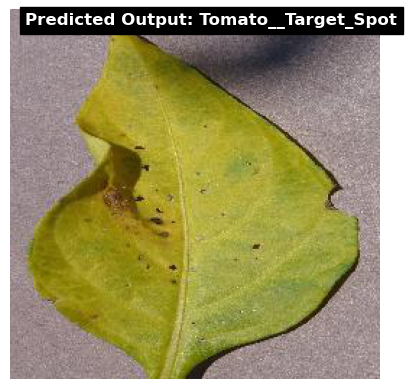

In [28]:
path=r"C:\Users\pavankumar\OneDrive\Desktop\major project\testImages\7.JPG"
img=imread(path)
img_resize=resize(img,(64,64,3))
img_preprocessed=[img_resize.flatten()]
output_number=dt_classifier.predict(img_preprocessed)[0]
output_name=categories[output_number]

plt.imshow(img)
plt.text(10, 10, f'Predicted Output: {output_name}', color='white', fontsize=12, weight='bold', backgroundcolor='black')
plt.axis('off')
plt.show()

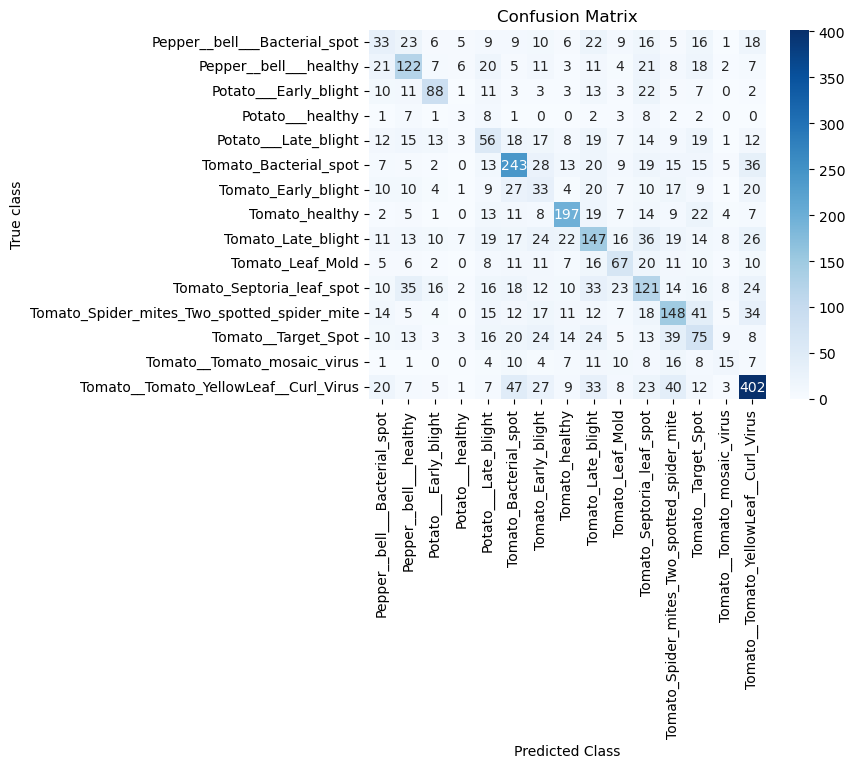

In [29]:
# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)
class_names=categories
# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, cmap="Blues", xticklabels=class_names, yticklabels=class_names,fmt='d')

# Set the axis labels and title
plt.xlabel("Predicted Class")
plt.ylabel("True class")
plt.title("Confusion Matrix")

# Display the heatmap
plt.show()

In [30]:
# Generate the classification report
report = classification_report(y_test, y_pred, target_names=class_names)

# Print the classification report
print(report)

                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       0.20      0.18      0.19       188
                     Pepper__bell___healthy       0.44      0.46      0.45       266
                      Potato___Early_blight       0.54      0.48      0.51       182
                           Potato___healthy       0.09      0.08      0.09        38
                       Potato___Late_blight       0.25      0.25      0.25       223
                      Tomato_Bacterial_spot       0.54      0.57      0.55       430
                        Tomato_Early_blight       0.14      0.18      0.16       182
                             Tomato_healthy       0.63      0.62      0.62       319
                         Tomato_Late_blight       0.37      0.38      0.37       389
                           Tomato_Leaf_Mold       0.36      0.36      0.36       187
                  Tomato_Septoria_leaf_spot       0.33      0.34

In [31]:
accuracy = accuracy_score(y_test, y_pred)*100
precision = precision_score(y_test, y_pred, average='weighted')*100
recall = recall_score(y_test, y_pred, average='weighted')*100
f1 = f1_score(y_test, y_pred, average='weighted')*100
print(f'Accuracy: {accuracy:.3f}')
print(f'Precision: {precision:.3f}')
print(f'Recall: {recall:.3f}')
print(f'F1 Score: {f1:.3f}')

Accuracy: 42.404
Precision: 42.642
Recall: 42.404
F1 Score: 42.465
